In [1]:
import init

In [2]:
epochs = 400

In [3]:
import tensorflow as tf


def get_dataset(x, y, batch_size=128, shuffle_buffer=10_000, drop_remainder=True):
    """Scale image bytes to diffusion space and batch aligned labels.

    The affine transform does not clip values. No prefetching, repetition, validation
    split, or deterministic shuffle seed is added. Labels remain aligned with images
    while shuffling.

    Args:
        x (np.ndarray): Image values nominally in [0, 255]. Trailing image dimensions
            are preserved; supply the channel dimension required by the model.
        y (np.ndarray): Labels with the same leading length as x. Values and label shape
            are preserved.
        batch_size (int): Number of examples in each dataset batch. Defaults to ``128``.
        shuffle_buffer (int | None): None preserves input order; a positive integer
            enables shuffling without an explicit operation seed. TensorFlow global
            seeding can still control this randomness. Defaults to ``10000``.
        drop_remainder (bool): True discards an incomplete final batch; False retains
            it. Defaults to ``True``.

    Returns:
        tf.data.Dataset: Finite (images, labels) batches, with float32 image values
        transformed as 2*x/255-1 and the configured remainder policy.
    """

    x = x.astype("float32") / 255.0
    x = (x * 2.0) - 1.0
    # x = x[..., None]

    dataset = tf.data.Dataset.from_tensor_slices((x, y))

    # A supplied buffer enables random shuffling; None keeps input order.
    if shuffle_buffer is not None:
        dataset = dataset.shuffle(shuffle_buffer)

    dataset = dataset.batch(batch_size, drop_remainder=drop_remainder)

    return dataset

In [4]:
from tensorflow.keras import datasets, layers

import numpy as np


(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

x_train = np.expand_dims(x_train, -1)
x_train = layers.ZeroPadding2D((2, 2))(x_train).numpy()

x_test = np.expand_dims(x_test, -1)
x_test = layers.ZeroPadding2D((2, 2))(x_test).numpy()

trainset = get_dataset(x_train, y_train)
valset = get_dataset(x_test, y_test, shuffle_buffer=None, drop_remainder=False)

In [5]:
from diffusion.models.wrapper.diffusion_classifier import DiffusionClassifier
from diffusion.models.transformer.di_t_classifier import DiTClassifier


vit = DiTClassifier(
    image_size=32, 
    dim_forced=False, 
    depth=11, 
    cross_attention_ids_dict={9: (3,), 11: (1,)}, 
    cross_attention_kwargs={
        "use_layer_norm": True, 
        "ln_no_adaptation": False
    }, 
    vit_block_ids=[1, 3, 5, 9, 11], 
    use_decoder_ids=[9, 11], 
    vit_block_mlp_output_dims={1: 32, 3: 64, 5: 64, 9: 32, 11: 32}, 
    downsample_ids=[2, 4], 
    downsample_kwargs={
        "pos_embed_type": "2d_sincos", 
    }, 
    upsample_ids=[8, 10], 
    upsample_kwargs={
        "pos_embed_type": "2d_sincos", 
        "scaling_method": "interpolate", 
        "scaling_interpolation_method": "bilinear"
    }, 
    feature_aggregation_ids_dict={1: (5,)}, # or -1
    clf_depth=3, 
)
model = DiffusionClassifier(network=vit)

vit.summary()

Model: "di_t_classifier"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depth_0_patch_embedder (Pat  (None, 256, 32)          160       
 chEmbedding)                                                    
                                                                 
 depth_0_time_embedder (Cond  (None, 32)               32000     
 itionEmbedding)                                                 
                                                                 
 depth_0_label_embedder (Con  (None, 32)               352       
 ditionEmbedding)                                                
                                                                 
 depth_0_time_label_merger (  (None, 32)               0         
 Add)                                                            
                                                                 
 depth_1_encoder_block (Visi  (None, 256, 32)      

In [6]:
from tensorflow.keras import optimizers


lr_schedule = optimizers.schedules.CosineDecay(
    initial_learning_rate=5e-3, 
    decay_steps=epochs * len(trainset)
)

model.compile(
    optimizer=optimizers.Adam(
        lr_schedule, 
        global_clipnorm=1.0
    ), 
    loss="mse", 
    # run_eagerly=True
)

In [7]:
from tensorflow.keras import callbacks

from diffusion import ImageGenerator
from common.callbacks.lr_logger import LrLogger


callbacks_list = [
    LrLogger(), 
    callbacks.ProgbarLogger(count_mode="steps"), 
    ImageGenerator()
]

Epoch 1/400
468/468 [==============================] - 82s 132ms/step - loss: 0.5831 - noise_loss: 0.5630 - classifier_loss: 2.3415 - classifier_accuracy: 0.1056 - val_loss: 1.0483 - val_noise_loss: 1.0285 - val_image_loss: 38.7393 - val_classifier_loss: 2.3015 - val_classifier_accuracy: 0.1135 - learning_rate: 0.0050


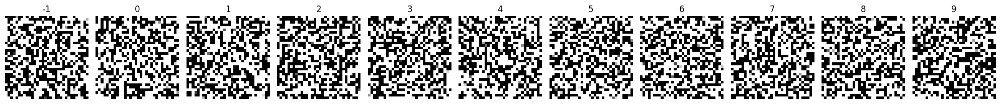

Epoch 2/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0602 - noise_loss: 0.0405 - classifier_loss: 2.2900 - classifier_accuracy: 0.1229 - val_loss: 0.9836 - val_noise_loss: 0.9638 - val_image_loss: 39.5132 - val_classifier_loss: 2.3015 - val_classifier_accuracy: 0.1135 - learning_rate: 0.0050


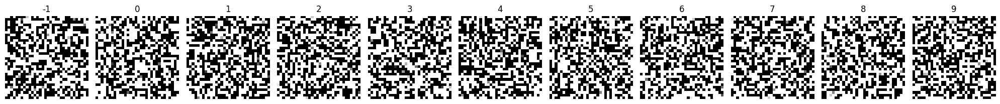

Epoch 3/400
468/468 [==============================] - 54s 116ms/step - loss: 0.0576 - noise_loss: 0.0382 - classifier_loss: 2.2537 - classifier_accuracy: 0.1463 - val_loss: 0.4861 - val_noise_loss: 0.4663 - val_image_loss: 16.8070 - val_classifier_loss: 2.3002 - val_classifier_accuracy: 0.1135 - learning_rate: 0.0050


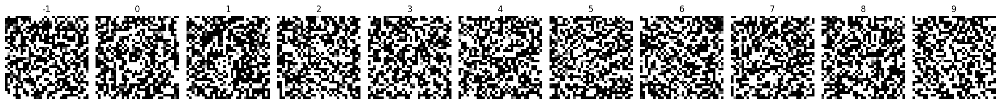

Epoch 4/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0542 - noise_loss: 0.0346 - classifier_loss: 2.2830 - classifier_accuracy: 0.1399 - val_loss: 0.1788 - val_noise_loss: 0.1590 - val_image_loss: 4.5880 - val_classifier_loss: 2.2959 - val_classifier_accuracy: 0.1135 - learning_rate: 0.0050


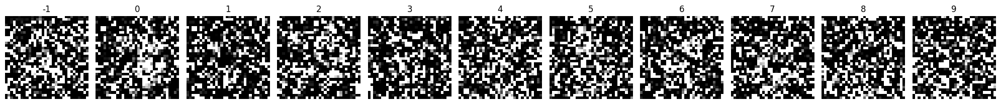

Epoch 5/400
468/468 [==============================] - 56s 118ms/step - loss: 0.0536 - noise_loss: 0.0338 - classifier_loss: 2.3088 - classifier_accuracy: 0.1303 - val_loss: 0.0922 - val_noise_loss: 0.0726 - val_image_loss: 1.2963 - val_classifier_loss: 2.2752 - val_classifier_accuracy: 0.1382 - learning_rate: 0.0050


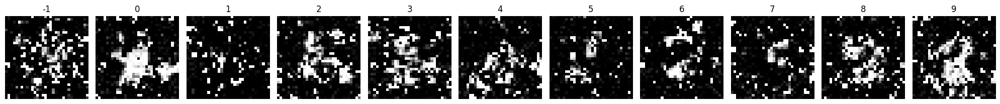

Epoch 6/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0531 - noise_loss: 0.0331 - classifier_loss: 2.3249 - classifier_accuracy: 0.1109 - val_loss: 0.0702 - val_noise_loss: 0.0505 - val_image_loss: 0.5578 - val_classifier_loss: 2.2862 - val_classifier_accuracy: 0.1509 - learning_rate: 0.0050


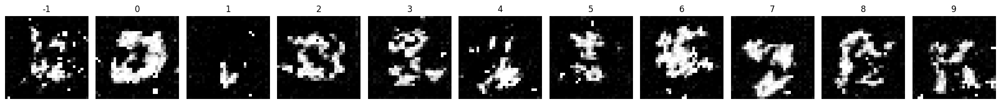

Epoch 7/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0519 - noise_loss: 0.0320 - classifier_loss: 2.3161 - classifier_accuracy: 0.1113 - val_loss: 0.0631 - val_noise_loss: 0.0433 - val_image_loss: 0.3343 - val_classifier_loss: 2.2950 - val_classifier_accuracy: 0.1827 - learning_rate: 0.0050


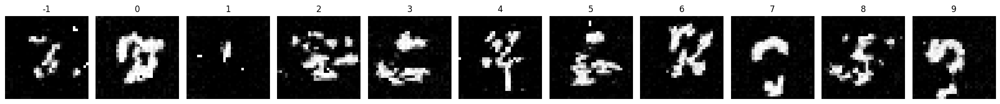

Epoch 8/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0512 - noise_loss: 0.0313 - classifier_loss: 2.3176 - classifier_accuracy: 0.1241 - val_loss: 0.0620 - val_noise_loss: 0.0423 - val_image_loss: 0.2306 - val_classifier_loss: 2.2902 - val_classifier_accuracy: 0.1822 - learning_rate: 0.0050


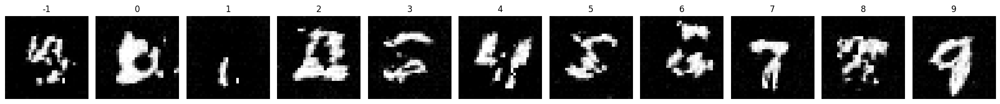

Epoch 9/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0498 - noise_loss: 0.0310 - classifier_loss: 2.1891 - classifier_accuracy: 0.1833 - val_loss: 0.0631 - val_noise_loss: 0.0441 - val_image_loss: 0.2151 - val_classifier_loss: 2.2023 - val_classifier_accuracy: 0.2582 - learning_rate: 0.0050


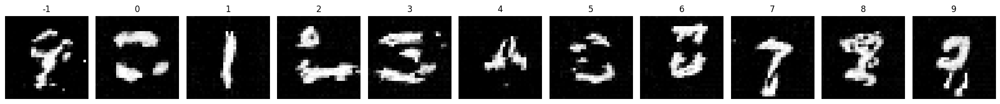

Epoch 10/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0489 - noise_loss: 0.0308 - classifier_loss: 2.1124 - classifier_accuracy: 0.2292 - val_loss: 0.0620 - val_noise_loss: 0.0447 - val_image_loss: 0.2208 - val_classifier_loss: 2.0074 - val_classifier_accuracy: 0.2819 - learning_rate: 0.0050


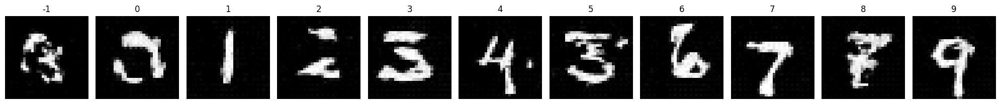

Epoch 11/400
468/468 [==============================] - 56s 119ms/step - loss: 0.0463 - noise_loss: 0.0301 - classifier_loss: 1.8849 - classifier_accuracy: 0.3059 - val_loss: 0.0616 - val_noise_loss: 0.0455 - val_image_loss: 0.2059 - val_classifier_loss: 1.8706 - val_classifier_accuracy: 0.3263 - learning_rate: 0.0050


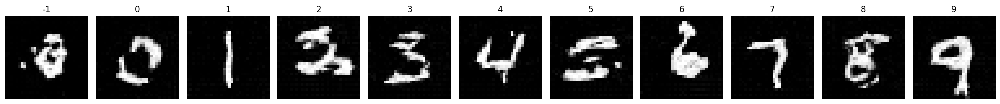

Epoch 12/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0447 - noise_loss: 0.0296 - classifier_loss: 1.7616 - classifier_accuracy: 0.3630 - val_loss: 0.0608 - val_noise_loss: 0.0462 - val_image_loss: 0.2152 - val_classifier_loss: 1.6982 - val_classifier_accuracy: 0.3919 - learning_rate: 0.0050


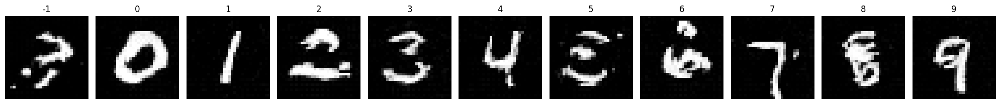

Epoch 13/400
468/468 [==============================] - 56s 118ms/step - loss: 0.0434 - noise_loss: 0.0293 - classifier_loss: 1.6495 - classifier_accuracy: 0.4040 - val_loss: 0.0612 - val_noise_loss: 0.0480 - val_image_loss: 0.2312 - val_classifier_loss: 1.5395 - val_classifier_accuracy: 0.4598 - learning_rate: 0.0050


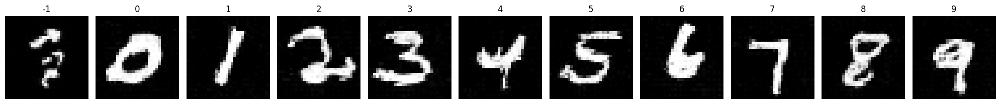

Epoch 14/400
468/468 [==============================] - 56s 120ms/step - loss: 0.0427 - noise_loss: 0.0291 - classifier_loss: 1.5869 - classifier_accuracy: 0.4293 - val_loss: 0.0610 - val_noise_loss: 0.0489 - val_image_loss: 0.2537 - val_classifier_loss: 1.3999 - val_classifier_accuracy: 0.5008 - learning_rate: 0.0050


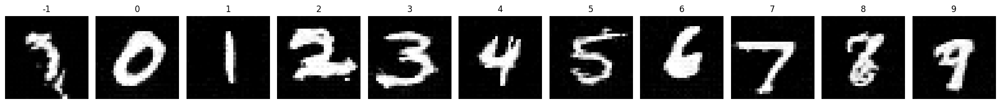

Epoch 15/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0419 - noise_loss: 0.0288 - classifier_loss: 1.5326 - classifier_accuracy: 0.4535 - val_loss: 0.0609 - val_noise_loss: 0.0503 - val_image_loss: 0.2456 - val_classifier_loss: 1.2309 - val_classifier_accuracy: 0.5727 - learning_rate: 0.0050


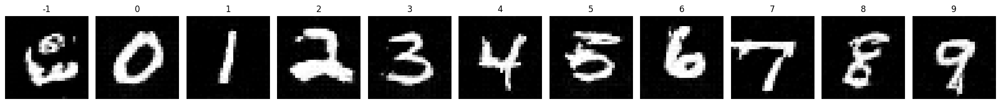

Epoch 16/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0418 - noise_loss: 0.0288 - classifier_loss: 1.5153 - classifier_accuracy: 0.4717 - val_loss: 0.0606 - val_noise_loss: 0.0513 - val_image_loss: 0.2445 - val_classifier_loss: 1.0866 - val_classifier_accuracy: 0.6434 - learning_rate: 0.0050


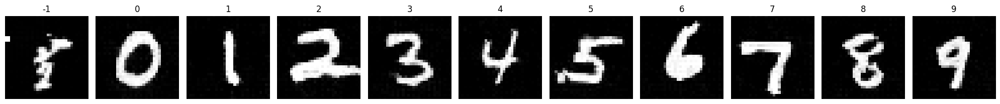

Epoch 17/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0481 - noise_loss: 0.0303 - classifier_loss: 2.0738 - classifier_accuracy: 0.2738 - val_loss: 0.0646 - val_noise_loss: 0.0535 - val_image_loss: 0.2782 - val_classifier_loss: 1.2838 - val_classifier_accuracy: 0.5808 - learning_rate: 0.0050


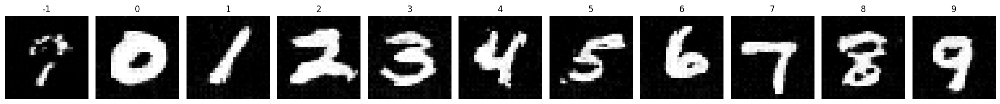

Epoch 18/400
468/468 [==============================] - 56s 120ms/step - loss: 0.0493 - noise_loss: 0.0294 - classifier_loss: 2.3132 - classifier_accuracy: 0.1355 - val_loss: 0.0795 - val_noise_loss: 0.0636 - val_image_loss: 0.4036 - val_classifier_loss: 1.8409 - val_classifier_accuracy: 0.3054 - learning_rate: 0.0050


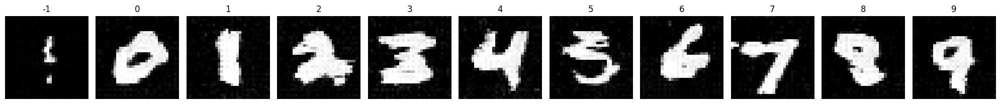

Epoch 19/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0472 - noise_loss: 0.0289 - classifier_loss: 2.1368 - classifier_accuracy: 0.2086 - val_loss: 0.0855 - val_noise_loss: 0.0660 - val_image_loss: 0.3869 - val_classifier_loss: 2.2665 - val_classifier_accuracy: 0.2433 - learning_rate: 0.0050


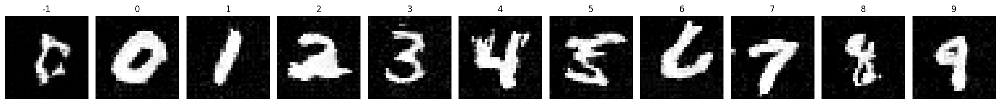

Epoch 20/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0446 - noise_loss: 0.0286 - classifier_loss: 1.8541 - classifier_accuracy: 0.3307 - val_loss: 0.0797 - val_noise_loss: 0.0620 - val_image_loss: 0.3173 - val_classifier_loss: 2.0625 - val_classifier_accuracy: 0.2964 - learning_rate: 0.0050


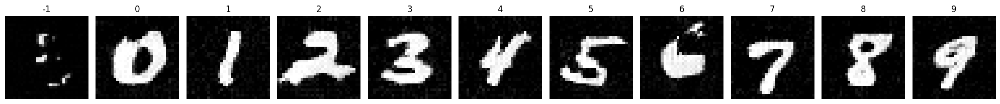

Epoch 21/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0428 - noise_loss: 0.0283 - classifier_loss: 1.6854 - classifier_accuracy: 0.3984 - val_loss: 0.0722 - val_noise_loss: 0.0596 - val_image_loss: 0.3069 - val_classifier_loss: 1.4642 - val_classifier_accuracy: 0.4473 - learning_rate: 0.0050


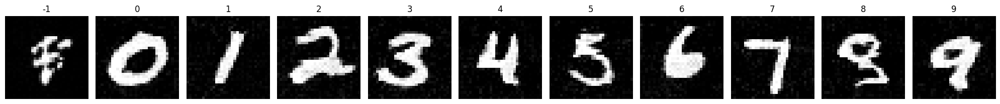

Epoch 22/400
468/468 [==============================] - 56s 119ms/step - loss: 0.0409 - noise_loss: 0.0278 - classifier_loss: 1.5289 - classifier_accuracy: 0.4584 - val_loss: 0.0691 - val_noise_loss: 0.0581 - val_image_loss: 0.2964 - val_classifier_loss: 1.2759 - val_classifier_accuracy: 0.5644 - learning_rate: 0.0050


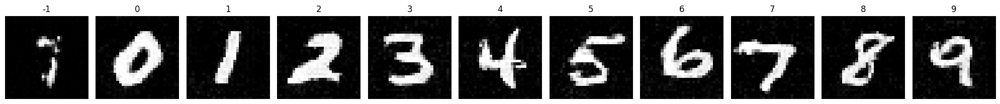

Epoch 23/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0406 - noise_loss: 0.0278 - classifier_loss: 1.4945 - classifier_accuracy: 0.4722 - val_loss: 0.0661 - val_noise_loss: 0.0564 - val_image_loss: 0.2854 - val_classifier_loss: 1.1289 - val_classifier_accuracy: 0.6157 - learning_rate: 0.0050


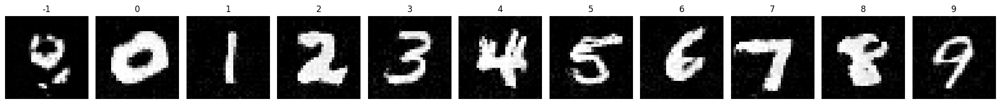

Epoch 24/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0397 - noise_loss: 0.0273 - classifier_loss: 1.4419 - classifier_accuracy: 0.4905 - val_loss: 0.0640 - val_noise_loss: 0.0557 - val_image_loss: 0.2623 - val_classifier_loss: 0.9658 - val_classifier_accuracy: 0.6787 - learning_rate: 0.0050


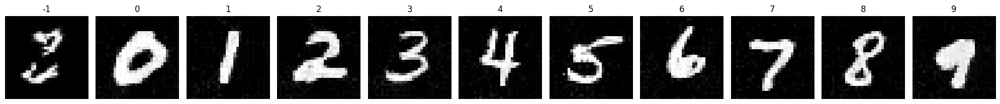

Epoch 25/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0416 - noise_loss: 0.0278 - classifier_loss: 1.6048 - classifier_accuracy: 0.4691 - val_loss: 0.0632 - val_noise_loss: 0.0554 - val_image_loss: 0.2599 - val_classifier_loss: 0.9019 - val_classifier_accuracy: 0.6981 - learning_rate: 0.0050


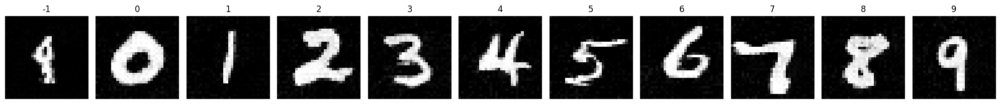

Epoch 26/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0423 - noise_loss: 0.0279 - classifier_loss: 1.6808 - classifier_accuracy: 0.3982 - val_loss: 0.0671 - val_noise_loss: 0.0574 - val_image_loss: 0.3349 - val_classifier_loss: 1.1237 - val_classifier_accuracy: 0.5970 - learning_rate: 0.0049


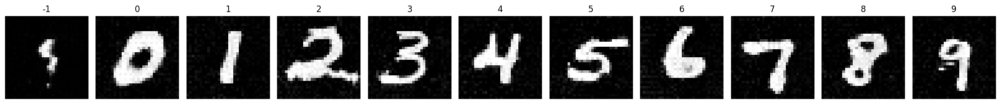

Epoch 27/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0400 - noise_loss: 0.0275 - classifier_loss: 1.4503 - classifier_accuracy: 0.4808 - val_loss: 0.0650 - val_noise_loss: 0.0568 - val_image_loss: 0.2791 - val_classifier_loss: 0.9644 - val_classifier_accuracy: 0.6497 - learning_rate: 0.0049


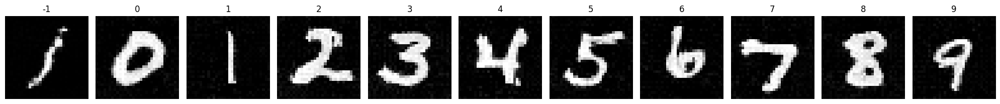

Epoch 28/400
468/468 [==============================] - 55s 118ms/step - loss: 0.0387 - noise_loss: 0.0271 - classifier_loss: 1.3422 - classifier_accuracy: 0.5270 - val_loss: 0.0623 - val_noise_loss: 0.0555 - val_image_loss: 0.2655 - val_classifier_loss: 0.7993 - val_classifier_accuracy: 0.7295 - learning_rate: 0.0049


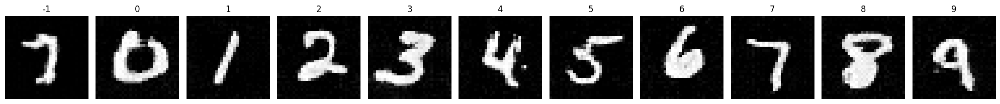

Epoch 29/400
468/468 [==============================] - 56s 120ms/step - loss: 0.0381 - noise_loss: 0.0270 - classifier_loss: 1.2843 - classifier_accuracy: 0.5397 - val_loss: 0.0600 - val_noise_loss: 0.0540 - val_image_loss: 0.2703 - val_classifier_loss: 0.7050 - val_classifier_accuracy: 0.7692 - learning_rate: 0.0049


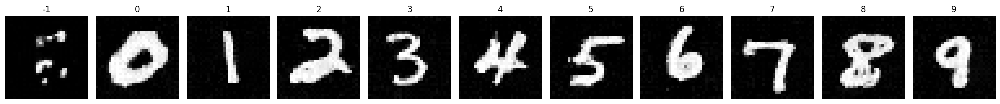

Epoch 30/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0383 - noise_loss: 0.0272 - classifier_loss: 1.2928 - classifier_accuracy: 0.5464 - val_loss: 0.0589 - val_noise_loss: 0.0533 - val_image_loss: 0.2468 - val_classifier_loss: 0.6448 - val_classifier_accuracy: 0.7945 - learning_rate: 0.0049


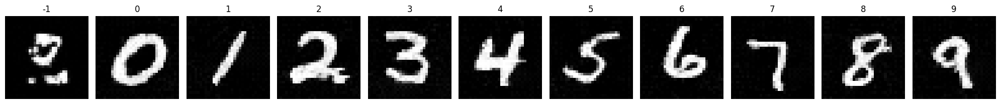

Epoch 31/400
468/468 [==============================] - 55s 117ms/step - loss: 0.0379 - noise_loss: 0.0268 - classifier_loss: 1.2838 - classifier_accuracy: 0.5413 - val_loss: 0.0577 - val_noise_loss: 0.0527 - val_image_loss: 0.2417 - val_classifier_loss: 0.5841 - val_classifier_accuracy: 0.8166 - learning_rate: 0.0049


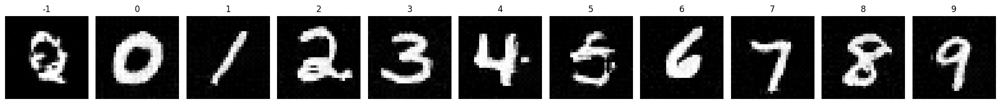

Epoch 32/400
468/468 [==============================] - 56s 119ms/step - loss: 0.0375 - noise_loss: 0.0269 - classifier_loss: 1.2384 - classifier_accuracy: 0.5713 - val_loss: 0.0568 - val_noise_loss: 0.0521 - val_image_loss: 0.2412 - val_classifier_loss: 0.5383 - val_classifier_accuracy: 0.8366 - learning_rate: 0.0049


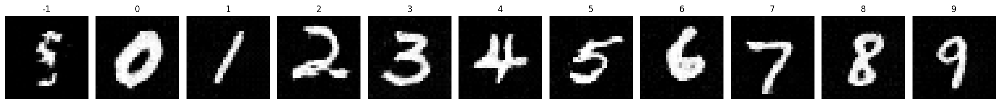

Epoch 33/400
468/468 [==============================] - 56s 119ms/step - loss: 0.0370 - noise_loss: 0.0267 - classifier_loss: 1.1931 - classifier_accuracy: 0.5774 - val_loss: 0.0560 - val_noise_loss: 0.0515 - val_image_loss: 0.2435 - val_classifier_loss: 0.5145 - val_classifier_accuracy: 0.8471 - learning_rate: 0.0049


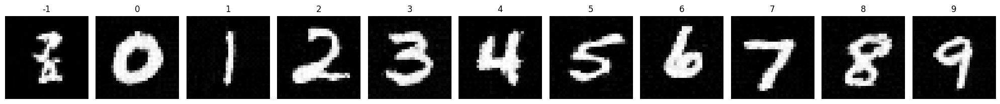

Epoch 34/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0371 - noise_loss: 0.0266 - classifier_loss: 1.2243 - classifier_accuracy: 0.5657 - val_loss: 0.0555 - val_noise_loss: 0.0513 - val_image_loss: 0.2556 - val_classifier_loss: 0.4846 - val_classifier_accuracy: 0.8494 - learning_rate: 0.0049


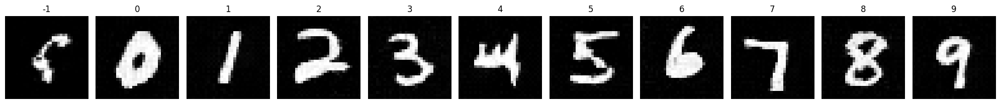

Epoch 35/400
468/468 [==============================] - 59s 125ms/step - loss: 0.0376 - noise_loss: 0.0269 - classifier_loss: 1.2434 - classifier_accuracy: 0.5597 - val_loss: 0.0548 - val_noise_loss: 0.0506 - val_image_loss: 0.2340 - val_classifier_loss: 0.4823 - val_classifier_accuracy: 0.8519 - learning_rate: 0.0049


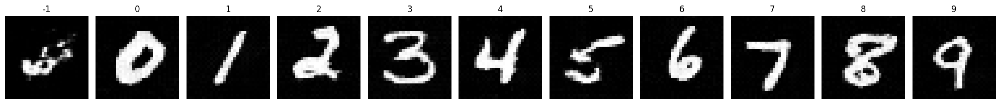

Epoch 36/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0410 - noise_loss: 0.0279 - classifier_loss: 1.5215 - classifier_accuracy: 0.4654 - val_loss: 0.0571 - val_noise_loss: 0.0520 - val_image_loss: 0.2745 - val_classifier_loss: 0.5962 - val_classifier_accuracy: 0.8196 - learning_rate: 0.0049


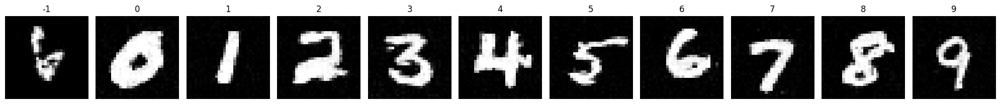

Epoch 37/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0377 - noise_loss: 0.0267 - classifier_loss: 1.2759 - classifier_accuracy: 0.5545 - val_loss: 0.0570 - val_noise_loss: 0.0521 - val_image_loss: 0.2491 - val_classifier_loss: 0.5727 - val_classifier_accuracy: 0.8283 - learning_rate: 0.0049


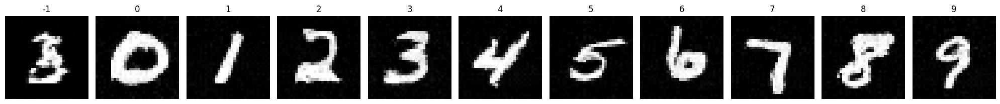

Epoch 38/400
468/468 [==============================] - 66s 140ms/step - loss: 0.0368 - noise_loss: 0.0266 - classifier_loss: 1.1867 - classifier_accuracy: 0.5815 - val_loss: 0.0553 - val_noise_loss: 0.0509 - val_image_loss: 0.2563 - val_classifier_loss: 0.5166 - val_classifier_accuracy: 0.8471 - learning_rate: 0.0049


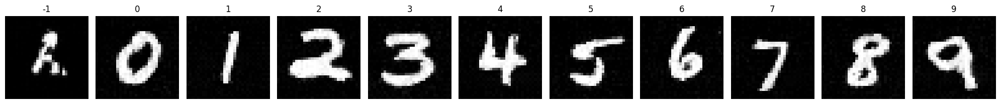

Epoch 39/400
468/468 [==============================] - 67s 143ms/step - loss: 0.0367 - noise_loss: 0.0264 - classifier_loss: 1.1912 - classifier_accuracy: 0.5869 - val_loss: 0.0553 - val_noise_loss: 0.0510 - val_image_loss: 0.2400 - val_classifier_loss: 0.4919 - val_classifier_accuracy: 0.8548 - learning_rate: 0.0049


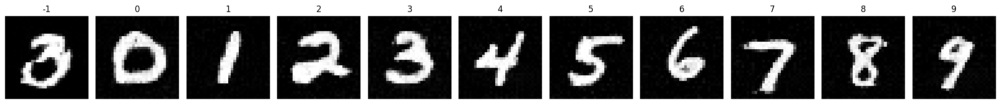

Epoch 40/400
468/468 [==============================] - 72s 154ms/step - loss: 0.0371 - noise_loss: 0.0265 - classifier_loss: 1.2370 - classifier_accuracy: 0.5701 - val_loss: 0.0542 - val_noise_loss: 0.0500 - val_image_loss: 0.2343 - val_classifier_loss: 0.4808 - val_classifier_accuracy: 0.8568 - learning_rate: 0.0049


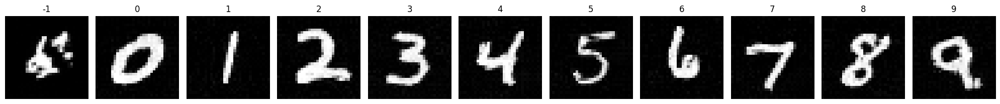

Epoch 41/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0369 - noise_loss: 0.0266 - classifier_loss: 1.1982 - classifier_accuracy: 0.5793 - val_loss: 0.0541 - val_noise_loss: 0.0499 - val_image_loss: 0.2371 - val_classifier_loss: 0.4811 - val_classifier_accuracy: 0.8549 - learning_rate: 0.0049


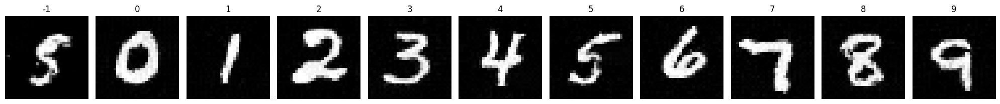

Epoch 42/400
468/468 [==============================] - 72s 152ms/step - loss: 0.0508 - noise_loss: 0.0295 - classifier_loss: 2.4900 - classifier_accuracy: 0.2044 - val_loss: 0.0628 - val_noise_loss: 0.0563 - val_image_loss: 0.3436 - val_classifier_loss: 0.7644 - val_classifier_accuracy: 0.7841 - learning_rate: 0.0049


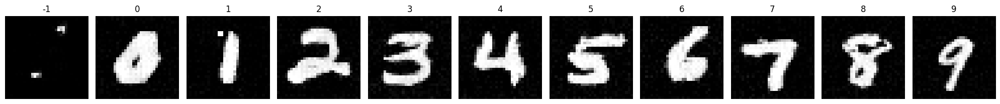

Epoch 43/400
468/468 [==============================] - 70s 149ms/step - loss: 0.0409 - noise_loss: 0.0271 - classifier_loss: 1.6081 - classifier_accuracy: 0.4215 - val_loss: 0.0676 - val_noise_loss: 0.0596 - val_image_loss: 0.4164 - val_classifier_loss: 0.9265 - val_classifier_accuracy: 0.7276 - learning_rate: 0.0049


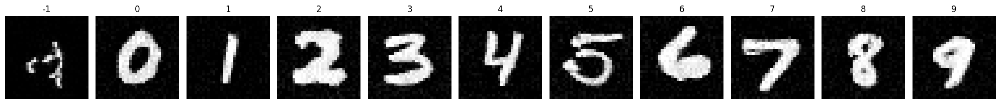

Epoch 44/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0401 - noise_loss: 0.0273 - classifier_loss: 1.4876 - classifier_accuracy: 0.4752 - val_loss: 0.0650 - val_noise_loss: 0.0581 - val_image_loss: 0.3784 - val_classifier_loss: 0.8053 - val_classifier_accuracy: 0.7549 - learning_rate: 0.0049


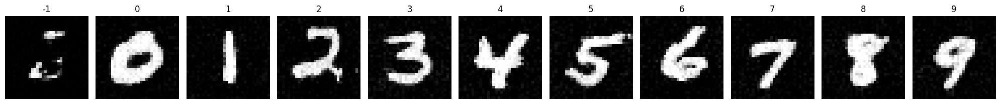

Epoch 45/400
468/468 [==============================] - 70s 149ms/step - loss: 0.0380 - noise_loss: 0.0264 - classifier_loss: 1.3471 - classifier_accuracy: 0.5258 - val_loss: 0.0644 - val_noise_loss: 0.0575 - val_image_loss: 0.3537 - val_classifier_loss: 0.7986 - val_classifier_accuracy: 0.7469 - learning_rate: 0.0048


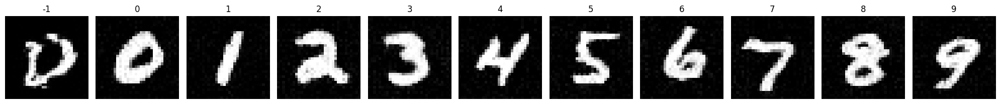

Epoch 46/400
468/468 [==============================] - 64s 136ms/step - loss: 0.0401 - noise_loss: 0.0268 - classifier_loss: 1.5515 - classifier_accuracy: 0.4597 - val_loss: 0.0614 - val_noise_loss: 0.0547 - val_image_loss: 0.2896 - val_classifier_loss: 0.7771 - val_classifier_accuracy: 0.7497 - learning_rate: 0.0048


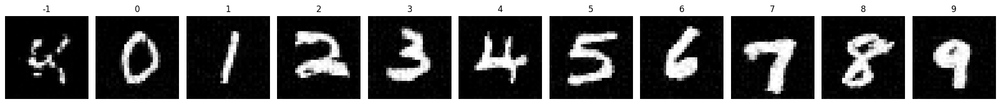

Epoch 47/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0415 - noise_loss: 0.0269 - classifier_loss: 1.7023 - classifier_accuracy: 0.4239 - val_loss: 0.0616 - val_noise_loss: 0.0553 - val_image_loss: 0.2955 - val_classifier_loss: 0.7331 - val_classifier_accuracy: 0.7644 - learning_rate: 0.0048


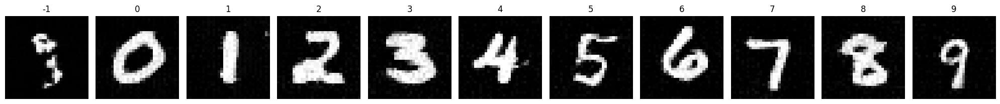

Epoch 48/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0398 - noise_loss: 0.0275 - classifier_loss: 1.4315 - classifier_accuracy: 0.4882 - val_loss: 0.0609 - val_noise_loss: 0.0550 - val_image_loss: 0.2834 - val_classifier_loss: 0.6894 - val_classifier_accuracy: 0.7722 - learning_rate: 0.0048


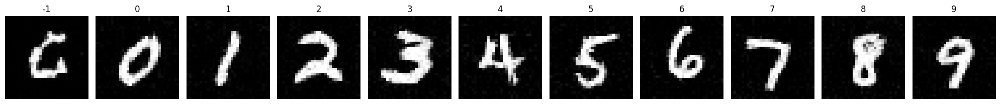

Epoch 49/400
468/468 [==============================] - 64s 136ms/step - loss: 0.0425 - noise_loss: 0.0269 - classifier_loss: 1.7982 - classifier_accuracy: 0.3766 - val_loss: 0.0731 - val_noise_loss: 0.0546 - val_image_loss: 0.2889 - val_classifier_loss: 2.1524 - val_classifier_accuracy: 0.3510 - learning_rate: 0.0048


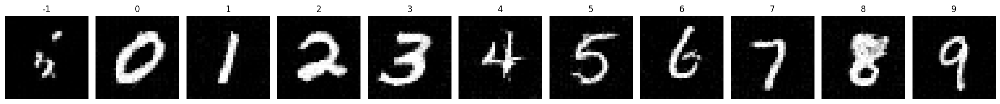

Epoch 50/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0398 - noise_loss: 0.0264 - classifier_loss: 1.5520 - classifier_accuracy: 0.4381 - val_loss: 0.0691 - val_noise_loss: 0.0544 - val_image_loss: 0.2626 - val_classifier_loss: 1.7150 - val_classifier_accuracy: 0.4328 - learning_rate: 0.0048


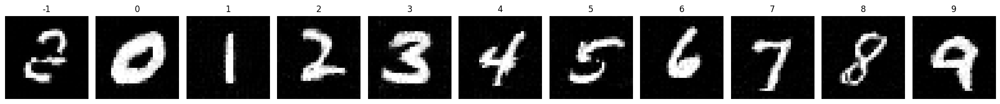

Epoch 51/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0392 - noise_loss: 0.0264 - classifier_loss: 1.4942 - classifier_accuracy: 0.4630 - val_loss: 0.0652 - val_noise_loss: 0.0544 - val_image_loss: 0.2515 - val_classifier_loss: 1.2512 - val_classifier_accuracy: 0.5602 - learning_rate: 0.0048


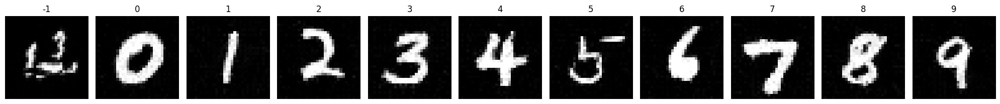

Epoch 52/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0396 - noise_loss: 0.0264 - classifier_loss: 1.5306 - classifier_accuracy: 0.4634 - val_loss: 0.0634 - val_noise_loss: 0.0543 - val_image_loss: 0.2529 - val_classifier_loss: 1.0555 - val_classifier_accuracy: 0.6312 - learning_rate: 0.0048


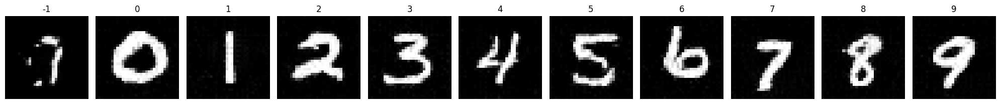

Epoch 53/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0397 - noise_loss: 0.0269 - classifier_loss: 1.4850 - classifier_accuracy: 0.4700 - val_loss: 0.0622 - val_noise_loss: 0.0543 - val_image_loss: 0.2579 - val_classifier_loss: 0.9153 - val_classifier_accuracy: 0.6757 - learning_rate: 0.0048


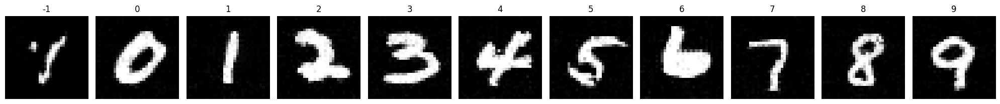

Epoch 54/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0406 - noise_loss: 0.0271 - classifier_loss: 1.5759 - classifier_accuracy: 0.4420 - val_loss: 0.0619 - val_noise_loss: 0.0544 - val_image_loss: 0.2618 - val_classifier_loss: 0.8722 - val_classifier_accuracy: 0.6853 - learning_rate: 0.0048


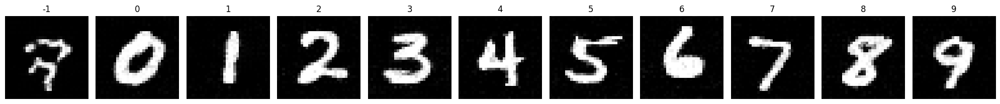

Epoch 55/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0387 - noise_loss: 0.0262 - classifier_loss: 1.4558 - classifier_accuracy: 0.4857 - val_loss: 0.0601 - val_noise_loss: 0.0533 - val_image_loss: 0.2534 - val_classifier_loss: 0.7852 - val_classifier_accuracy: 0.7220 - learning_rate: 0.0048


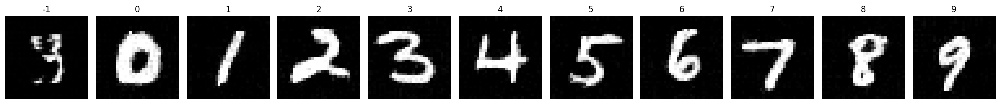

Epoch 56/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0376 - noise_loss: 0.0261 - classifier_loss: 1.3315 - classifier_accuracy: 0.5303 - val_loss: 0.0593 - val_noise_loss: 0.0532 - val_image_loss: 0.2505 - val_classifier_loss: 0.7005 - val_classifier_accuracy: 0.7653 - learning_rate: 0.0048


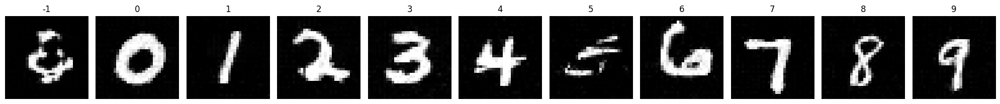

Epoch 57/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0372 - noise_loss: 0.0262 - classifier_loss: 1.2807 - classifier_accuracy: 0.5480 - val_loss: 0.0579 - val_noise_loss: 0.0523 - val_image_loss: 0.2455 - val_classifier_loss: 0.6414 - val_classifier_accuracy: 0.7867 - learning_rate: 0.0048


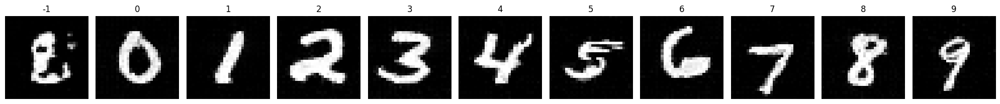

Epoch 58/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0380 - noise_loss: 0.0262 - classifier_loss: 1.3570 - classifier_accuracy: 0.5326 - val_loss: 0.0569 - val_noise_loss: 0.0517 - val_image_loss: 0.2476 - val_classifier_loss: 0.6028 - val_classifier_accuracy: 0.8029 - learning_rate: 0.0047


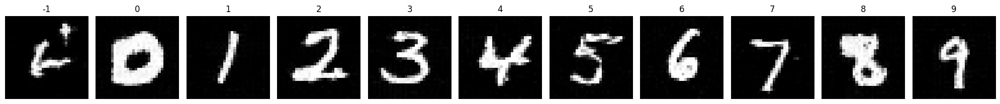

Epoch 59/400
468/468 [==============================] - 65s 137ms/step - loss: 0.0453 - noise_loss: 0.0274 - classifier_loss: 2.0870 - classifier_accuracy: 0.2929 - val_loss: 0.0636 - val_noise_loss: 0.0554 - val_image_loss: 0.2896 - val_classifier_loss: 0.9480 - val_classifier_accuracy: 0.6711 - learning_rate: 0.0047


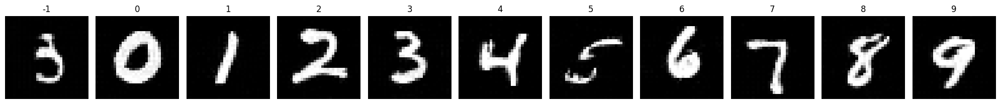

Epoch 60/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0385 - noise_loss: 0.0263 - classifier_loss: 1.4240 - classifier_accuracy: 0.4890 - val_loss: 0.0663 - val_noise_loss: 0.0547 - val_image_loss: 0.2722 - val_classifier_loss: 1.3484 - val_classifier_accuracy: 0.5405 - learning_rate: 0.0047


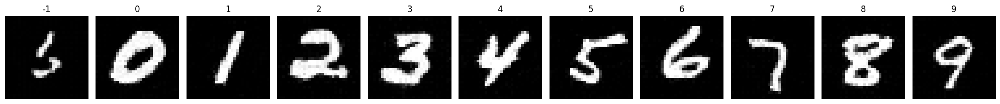

Epoch 61/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0366 - noise_loss: 0.0259 - classifier_loss: 1.2468 - classifier_accuracy: 0.5581 - val_loss: 0.0600 - val_noise_loss: 0.0529 - val_image_loss: 0.2582 - val_classifier_loss: 0.8233 - val_classifier_accuracy: 0.7172 - learning_rate: 0.0047


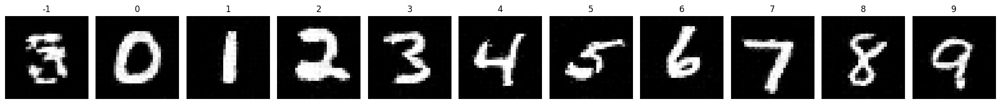

Epoch 62/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0371 - noise_loss: 0.0260 - classifier_loss: 1.2739 - classifier_accuracy: 0.5568 - val_loss: 0.0574 - val_noise_loss: 0.0518 - val_image_loss: 0.2583 - val_classifier_loss: 0.6563 - val_classifier_accuracy: 0.7859 - learning_rate: 0.0047


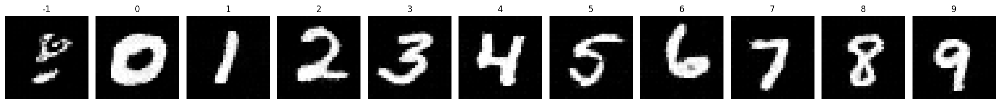

Epoch 63/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0369 - noise_loss: 0.0258 - classifier_loss: 1.2759 - classifier_accuracy: 0.5589 - val_loss: 0.0570 - val_noise_loss: 0.0521 - val_image_loss: 0.2420 - val_classifier_loss: 0.5607 - val_classifier_accuracy: 0.8192 - learning_rate: 0.0047


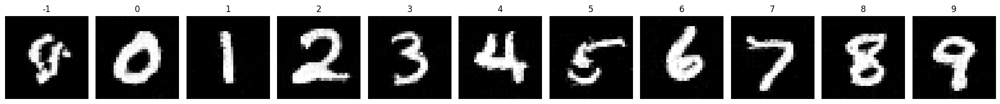

Epoch 64/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0378 - noise_loss: 0.0263 - classifier_loss: 1.3376 - classifier_accuracy: 0.5269 - val_loss: 0.0571 - val_noise_loss: 0.0522 - val_image_loss: 0.2462 - val_classifier_loss: 0.5708 - val_classifier_accuracy: 0.8134 - learning_rate: 0.0047


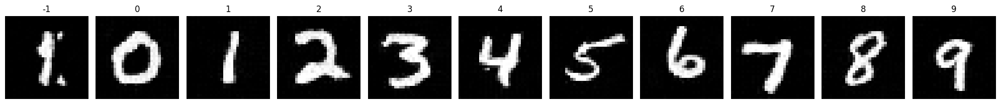

Epoch 65/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0359 - noise_loss: 0.0257 - classifier_loss: 1.1916 - classifier_accuracy: 0.5804 - val_loss: 0.0561 - val_noise_loss: 0.0515 - val_image_loss: 0.2422 - val_classifier_loss: 0.5307 - val_classifier_accuracy: 0.8297 - learning_rate: 0.0047


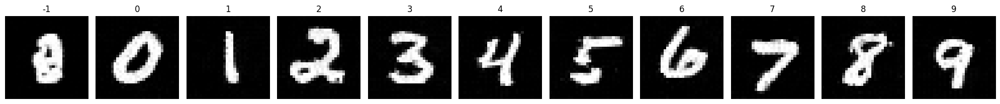

Epoch 66/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0357 - noise_loss: 0.0256 - classifier_loss: 1.1716 - classifier_accuracy: 0.5940 - val_loss: 0.0546 - val_noise_loss: 0.0505 - val_image_loss: 0.2367 - val_classifier_loss: 0.4735 - val_classifier_accuracy: 0.8493 - learning_rate: 0.0047


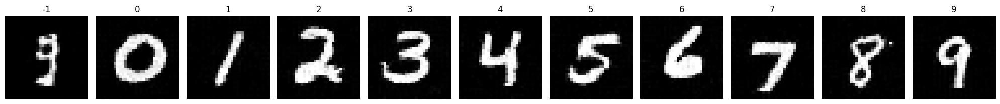

Epoch 67/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0356 - noise_loss: 0.0257 - classifier_loss: 1.1416 - classifier_accuracy: 0.6092 - val_loss: 0.0534 - val_noise_loss: 0.0496 - val_image_loss: 0.2371 - val_classifier_loss: 0.4424 - val_classifier_accuracy: 0.8594 - learning_rate: 0.0047


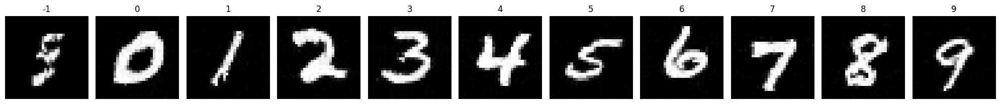

Epoch 68/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0356 - noise_loss: 0.0258 - classifier_loss: 1.1397 - classifier_accuracy: 0.5997 - val_loss: 0.0531 - val_noise_loss: 0.0495 - val_image_loss: 0.2322 - val_classifier_loss: 0.4161 - val_classifier_accuracy: 0.8719 - learning_rate: 0.0047


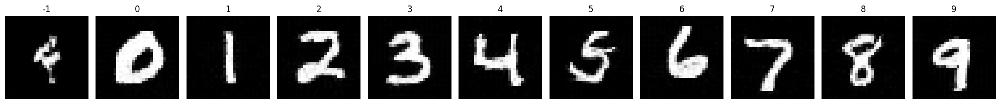

Epoch 69/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0356 - noise_loss: 0.0258 - classifier_loss: 1.1537 - classifier_accuracy: 0.5989 - val_loss: 0.0529 - val_noise_loss: 0.0495 - val_image_loss: 0.2225 - val_classifier_loss: 0.4016 - val_classifier_accuracy: 0.8775 - learning_rate: 0.0046


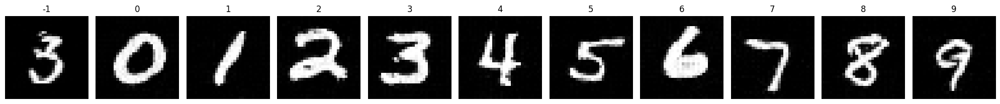

Epoch 70/400
468/468 [==============================] - 62s 132ms/step - loss: 0.0350 - noise_loss: 0.0255 - classifier_loss: 1.1088 - classifier_accuracy: 0.6197 - val_loss: 0.0526 - val_noise_loss: 0.0493 - val_image_loss: 0.2203 - val_classifier_loss: 0.3917 - val_classifier_accuracy: 0.8810 - learning_rate: 0.0046


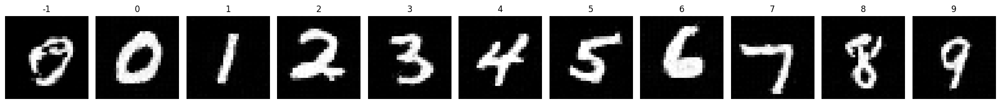

Epoch 71/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0404 - noise_loss: 0.0262 - classifier_loss: 1.6253 - classifier_accuracy: 0.5048 - val_loss: 0.0529 - val_noise_loss: 0.0494 - val_image_loss: 0.2461 - val_classifier_loss: 0.4020 - val_classifier_accuracy: 0.8756 - learning_rate: 0.0046


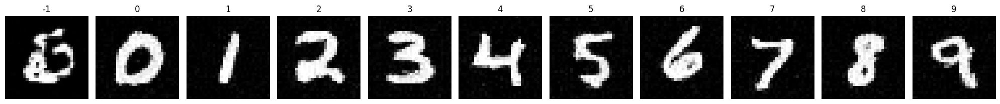

Epoch 72/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0356 - noise_loss: 0.0256 - classifier_loss: 1.1623 - classifier_accuracy: 0.5943 - val_loss: 0.0530 - val_noise_loss: 0.0495 - val_image_loss: 0.2412 - val_classifier_loss: 0.4107 - val_classifier_accuracy: 0.8684 - learning_rate: 0.0046


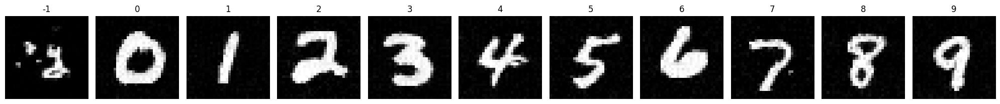

Epoch 73/400
468/468 [==============================] - 63s 133ms/step - loss: 0.0383 - noise_loss: 0.0259 - classifier_loss: 1.4515 - classifier_accuracy: 0.5023 - val_loss: 0.0525 - val_noise_loss: 0.0489 - val_image_loss: 0.2336 - val_classifier_loss: 0.4172 - val_classifier_accuracy: 0.8689 - learning_rate: 0.0046


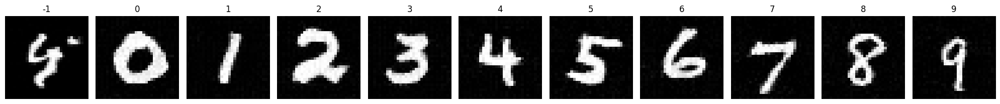

Epoch 74/400
468/468 [==============================] - 63s 133ms/step - loss: 0.0490 - noise_loss: 0.0277 - classifier_loss: 2.4762 - classifier_accuracy: 0.2370 - val_loss: 0.0630 - val_noise_loss: 0.0532 - val_image_loss: 0.2773 - val_classifier_loss: 1.1440 - val_classifier_accuracy: 0.6210 - learning_rate: 0.0046


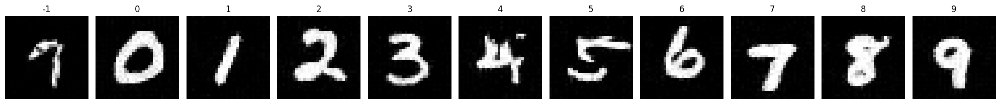

Epoch 75/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0408 - noise_loss: 0.0260 - classifier_loss: 1.7282 - classifier_accuracy: 0.3852 - val_loss: 0.0675 - val_noise_loss: 0.0584 - val_image_loss: 0.3503 - val_classifier_loss: 1.0563 - val_classifier_accuracy: 0.5903 - learning_rate: 0.0046


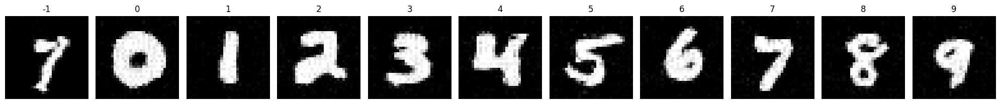

Epoch 76/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0372 - noise_loss: 0.0259 - classifier_loss: 1.3077 - classifier_accuracy: 0.5385 - val_loss: 0.0643 - val_noise_loss: 0.0575 - val_image_loss: 0.3376 - val_classifier_loss: 0.7929 - val_classifier_accuracy: 0.7214 - learning_rate: 0.0046


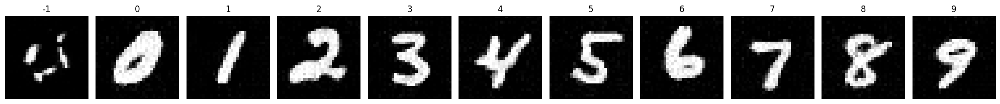

Epoch 77/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0395 - noise_loss: 0.0266 - classifier_loss: 1.4942 - classifier_accuracy: 0.4853 - val_loss: 0.0611 - val_noise_loss: 0.0550 - val_image_loss: 0.3127 - val_classifier_loss: 0.7094 - val_classifier_accuracy: 0.7742 - learning_rate: 0.0046


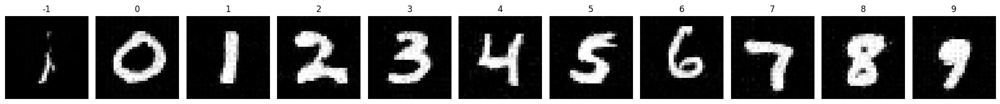

Epoch 78/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0357 - noise_loss: 0.0255 - classifier_loss: 1.1880 - classifier_accuracy: 0.5865 - val_loss: 0.0591 - val_noise_loss: 0.0541 - val_image_loss: 0.2831 - val_classifier_loss: 0.5834 - val_classifier_accuracy: 0.8176 - learning_rate: 0.0045


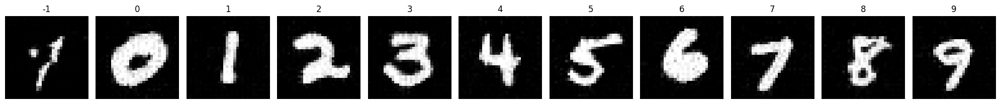

Epoch 79/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0357 - noise_loss: 0.0254 - classifier_loss: 1.1819 - classifier_accuracy: 0.5867 - val_loss: 0.0568 - val_noise_loss: 0.0523 - val_image_loss: 0.2833 - val_classifier_loss: 0.5272 - val_classifier_accuracy: 0.8426 - learning_rate: 0.0045


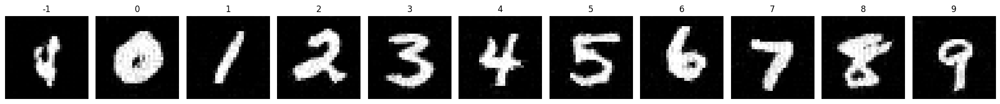

Epoch 80/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0350 - noise_loss: 0.0253 - classifier_loss: 1.1325 - classifier_accuracy: 0.6091 - val_loss: 0.0546 - val_noise_loss: 0.0504 - val_image_loss: 0.2748 - val_classifier_loss: 0.4845 - val_classifier_accuracy: 0.8574 - learning_rate: 0.0045


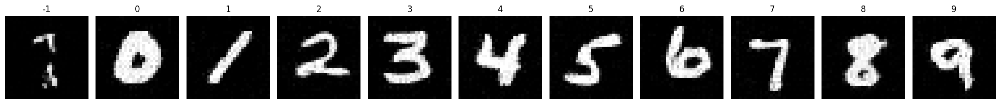

Epoch 81/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0354 - noise_loss: 0.0255 - classifier_loss: 1.1484 - classifier_accuracy: 0.6026 - val_loss: 0.0547 - val_noise_loss: 0.0508 - val_image_loss: 0.2412 - val_classifier_loss: 0.4615 - val_classifier_accuracy: 0.8625 - learning_rate: 0.0045


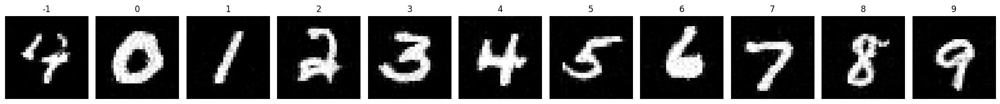

Epoch 82/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0358 - noise_loss: 0.0255 - classifier_loss: 1.1865 - classifier_accuracy: 0.5936 - val_loss: 0.0531 - val_noise_loss: 0.0494 - val_image_loss: 0.2355 - val_classifier_loss: 0.4309 - val_classifier_accuracy: 0.8696 - learning_rate: 0.0045


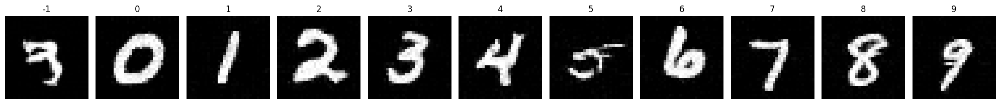

Epoch 83/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0401 - noise_loss: 0.0265 - classifier_loss: 1.5941 - classifier_accuracy: 0.4684 - val_loss: 0.0568 - val_noise_loss: 0.0518 - val_image_loss: 0.2447 - val_classifier_loss: 0.5784 - val_classifier_accuracy: 0.8292 - learning_rate: 0.0045


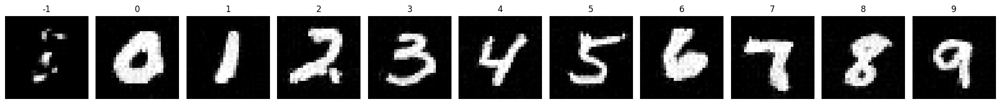

Epoch 84/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0362 - noise_loss: 0.0254 - classifier_loss: 1.2501 - classifier_accuracy: 0.5685 - val_loss: 0.0674 - val_noise_loss: 0.0613 - val_image_loss: 0.2717 - val_classifier_loss: 0.7071 - val_classifier_accuracy: 0.8340 - learning_rate: 0.0045


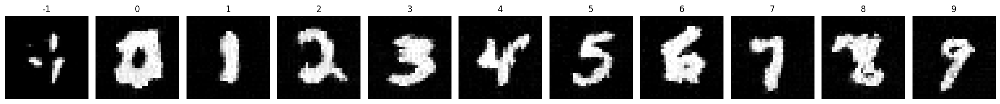

Epoch 85/400
468/468 [==============================] - 63s 133ms/step - loss: 0.0355 - noise_loss: 0.0254 - classifier_loss: 1.1792 - classifier_accuracy: 0.5896 - val_loss: 0.0569 - val_noise_loss: 0.0524 - val_image_loss: 0.2583 - val_classifier_loss: 0.5252 - val_classifier_accuracy: 0.8539 - learning_rate: 0.0045


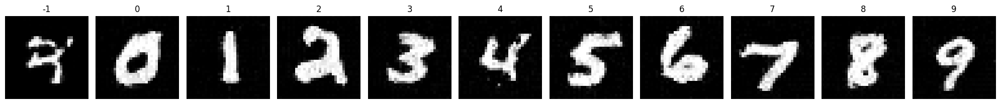

Epoch 86/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0400 - noise_loss: 0.0259 - classifier_loss: 1.6434 - classifier_accuracy: 0.4232 - val_loss: 0.0654 - val_noise_loss: 0.0505 - val_image_loss: 0.2581 - val_classifier_loss: 1.7331 - val_classifier_accuracy: 0.4385 - learning_rate: 0.0045


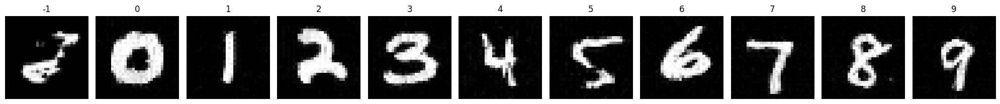

Epoch 87/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0386 - noise_loss: 0.0260 - classifier_loss: 1.4701 - classifier_accuracy: 0.4734 - val_loss: 0.0598 - val_noise_loss: 0.0504 - val_image_loss: 0.2351 - val_classifier_loss: 1.0897 - val_classifier_accuracy: 0.6148 - learning_rate: 0.0044


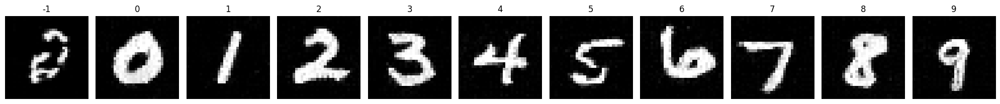

Epoch 88/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0463 - noise_loss: 0.0281 - classifier_loss: 2.1127 - classifier_accuracy: 0.2431 - val_loss: 0.0691 - val_noise_loss: 0.0576 - val_image_loss: 0.2566 - val_classifier_loss: 1.3467 - val_classifier_accuracy: 0.6053 - learning_rate: 0.0044


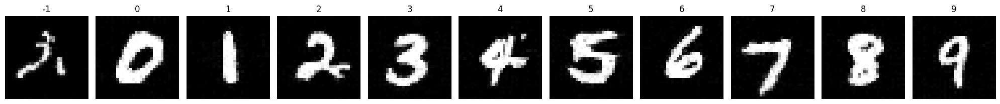

Epoch 89/400
468/468 [==============================] - 65s 140ms/step - loss: 0.0431 - noise_loss: 0.0270 - classifier_loss: 1.8713 - classifier_accuracy: 0.3217 - val_loss: 0.0804 - val_noise_loss: 0.0680 - val_image_loss: 0.2964 - val_classifier_loss: 1.4523 - val_classifier_accuracy: 0.4983 - learning_rate: 0.0044


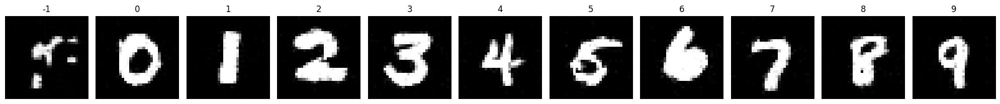

Epoch 90/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0421 - noise_loss: 0.0262 - classifier_loss: 1.8442 - classifier_accuracy: 0.3319 - val_loss: 0.0777 - val_noise_loss: 0.0664 - val_image_loss: 0.3139 - val_classifier_loss: 1.3226 - val_classifier_accuracy: 0.5009 - learning_rate: 0.0044


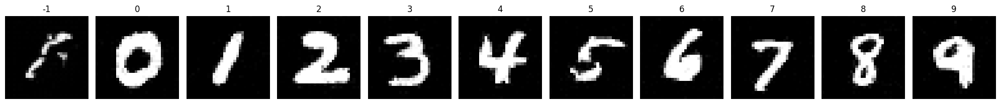

Epoch 91/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0401 - noise_loss: 0.0262 - classifier_loss: 1.6200 - classifier_accuracy: 0.3990 - val_loss: 0.0723 - val_noise_loss: 0.0621 - val_image_loss: 0.3092 - val_classifier_loss: 1.1821 - val_classifier_accuracy: 0.5492 - learning_rate: 0.0044


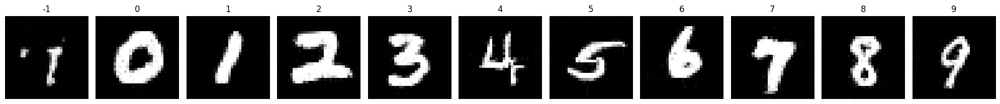

Epoch 92/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0382 - noise_loss: 0.0258 - classifier_loss: 1.4517 - classifier_accuracy: 0.4947 - val_loss: 0.0682 - val_noise_loss: 0.0588 - val_image_loss: 0.2544 - val_classifier_loss: 1.1018 - val_classifier_accuracy: 0.6094 - learning_rate: 0.0044


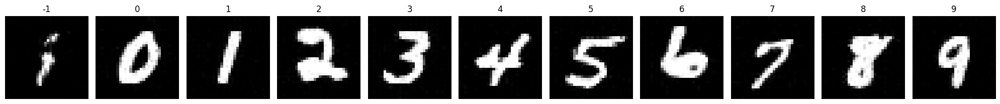

Epoch 93/400
468/468 [==============================] - 72s 154ms/step - loss: 0.0388 - noise_loss: 0.0262 - classifier_loss: 1.4655 - classifier_accuracy: 0.4799 - val_loss: 0.0652 - val_noise_loss: 0.0561 - val_image_loss: 0.2523 - val_classifier_loss: 1.0609 - val_classifier_accuracy: 0.6419 - learning_rate: 0.0044


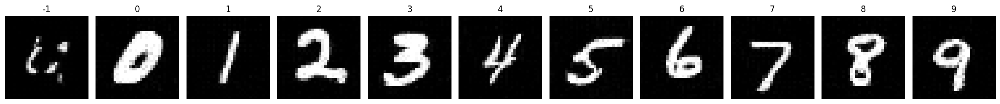

Epoch 94/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0375 - noise_loss: 0.0256 - classifier_loss: 1.3847 - classifier_accuracy: 0.5191 - val_loss: 0.0626 - val_noise_loss: 0.0541 - val_image_loss: 0.2408 - val_classifier_loss: 0.9837 - val_classifier_accuracy: 0.6738 - learning_rate: 0.0043


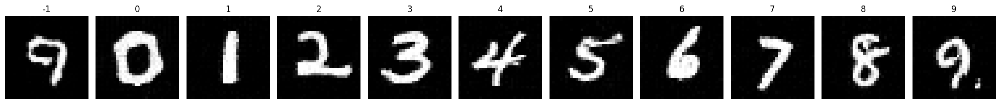

Epoch 95/400
468/468 [==============================] - 73s 156ms/step - loss: 0.0366 - noise_loss: 0.0254 - classifier_loss: 1.3049 - classifier_accuracy: 0.5434 - val_loss: 0.0601 - val_noise_loss: 0.0532 - val_image_loss: 0.2325 - val_classifier_loss: 0.7951 - val_classifier_accuracy: 0.7347 - learning_rate: 0.0043


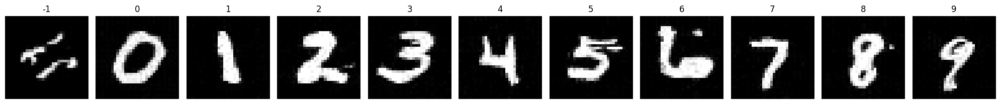

Epoch 96/400
468/468 [==============================] - 71s 151ms/step - loss: 0.0372 - noise_loss: 0.0259 - classifier_loss: 1.3099 - classifier_accuracy: 0.5426 - val_loss: 0.0577 - val_noise_loss: 0.0522 - val_image_loss: 0.2323 - val_classifier_loss: 0.6311 - val_classifier_accuracy: 0.7928 - learning_rate: 0.0043


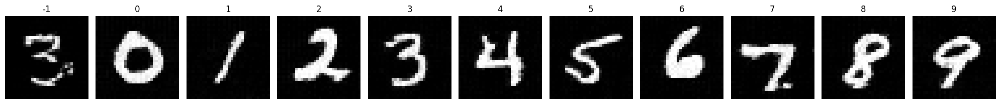

Epoch 97/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0362 - noise_loss: 0.0254 - classifier_loss: 1.2542 - classifier_accuracy: 0.5636 - val_loss: 0.0570 - val_noise_loss: 0.0521 - val_image_loss: 0.2246 - val_classifier_loss: 0.5757 - val_classifier_accuracy: 0.8171 - learning_rate: 0.0043


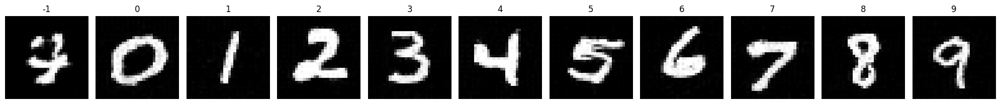

Epoch 98/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0364 - noise_loss: 0.0256 - classifier_loss: 1.2591 - classifier_accuracy: 0.5562 - val_loss: 0.0556 - val_noise_loss: 0.0510 - val_image_loss: 0.2178 - val_classifier_loss: 0.5436 - val_classifier_accuracy: 0.8260 - learning_rate: 0.0043


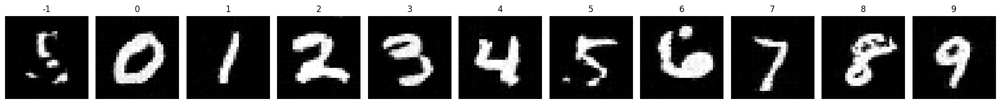

Epoch 99/400
468/468 [==============================] - 67s 142ms/step - loss: 0.0359 - noise_loss: 0.0253 - classifier_loss: 1.2290 - classifier_accuracy: 0.5696 - val_loss: 0.0549 - val_noise_loss: 0.0505 - val_image_loss: 0.2172 - val_classifier_loss: 0.5160 - val_classifier_accuracy: 0.8394 - learning_rate: 0.0043


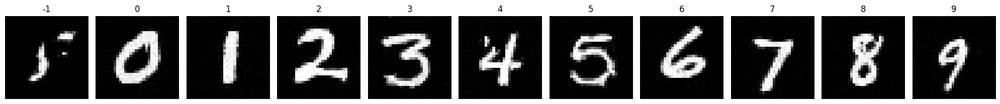

Epoch 100/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0360 - noise_loss: 0.0255 - classifier_loss: 1.2209 - classifier_accuracy: 0.5754 - val_loss: 0.0545 - val_noise_loss: 0.0502 - val_image_loss: 0.2141 - val_classifier_loss: 0.4994 - val_classifier_accuracy: 0.8459 - learning_rate: 0.0043


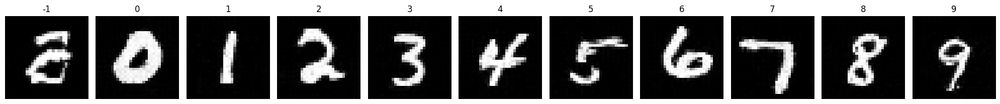

Epoch 101/400
468/468 [==============================] - 67s 142ms/step - loss: 0.0392 - noise_loss: 0.0261 - classifier_loss: 1.5012 - classifier_accuracy: 0.5051 - val_loss: 0.0541 - val_noise_loss: 0.0497 - val_image_loss: 0.2125 - val_classifier_loss: 0.5035 - val_classifier_accuracy: 0.8479 - learning_rate: 0.0043


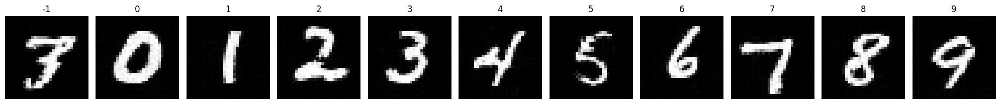

Epoch 102/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0460 - noise_loss: 0.0272 - classifier_loss: 2.1897 - classifier_accuracy: 0.2591 - val_loss: 0.0667 - val_noise_loss: 0.0575 - val_image_loss: 0.2446 - val_classifier_loss: 1.0616 - val_classifier_accuracy: 0.6127 - learning_rate: 0.0042


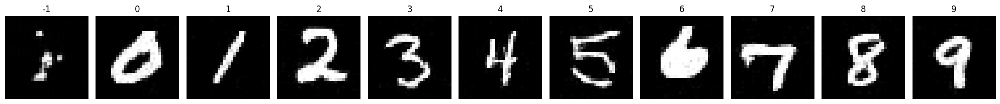

Epoch 103/400
468/468 [==============================] - 69s 146ms/step - loss: 0.0400 - noise_loss: 0.0260 - classifier_loss: 1.6206 - classifier_accuracy: 0.4181 - val_loss: 0.0684 - val_noise_loss: 0.0605 - val_image_loss: 0.2798 - val_classifier_loss: 0.9268 - val_classifier_accuracy: 0.6554 - learning_rate: 0.0042


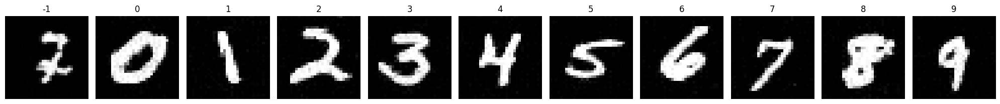

Epoch 104/400
468/468 [==============================] - 68s 145ms/step - loss: 0.0382 - noise_loss: 0.0257 - classifier_loss: 1.4525 - classifier_accuracy: 0.4836 - val_loss: 0.0658 - val_noise_loss: 0.0588 - val_image_loss: 0.2352 - val_classifier_loss: 0.8122 - val_classifier_accuracy: 0.7097 - learning_rate: 0.0042


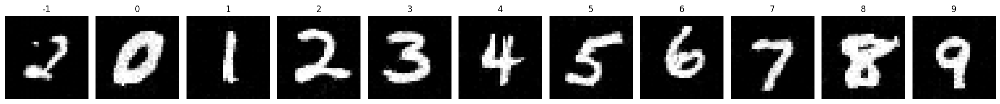

Epoch 105/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0388 - noise_loss: 0.0264 - classifier_loss: 1.4470 - classifier_accuracy: 0.4890 - val_loss: 0.0639 - val_noise_loss: 0.0577 - val_image_loss: 0.2406 - val_classifier_loss: 0.7160 - val_classifier_accuracy: 0.7645 - learning_rate: 0.0042


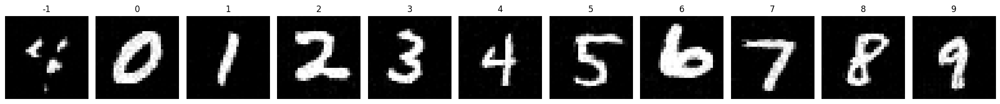

Epoch 106/400
468/468 [==============================] - 74s 157ms/step - loss: 0.0372 - noise_loss: 0.0255 - classifier_loss: 1.3738 - classifier_accuracy: 0.5197 - val_loss: 0.0621 - val_noise_loss: 0.0565 - val_image_loss: 0.2340 - val_classifier_loss: 0.6472 - val_classifier_accuracy: 0.7973 - learning_rate: 0.0042


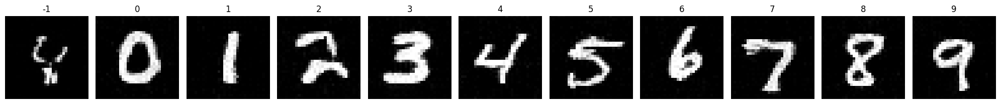

Epoch 107/400
468/468 [==============================] - 75s 159ms/step - loss: 0.0367 - noise_loss: 0.0256 - classifier_loss: 1.2895 - classifier_accuracy: 0.5441 - val_loss: 0.0612 - val_noise_loss: 0.0559 - val_image_loss: 0.2281 - val_classifier_loss: 0.6131 - val_classifier_accuracy: 0.8094 - learning_rate: 0.0042


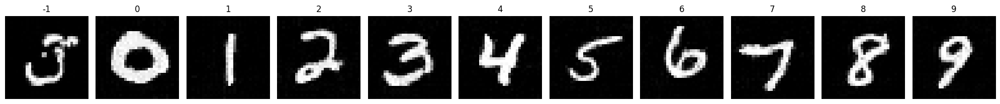

Epoch 108/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0356 - noise_loss: 0.0252 - classifier_loss: 1.2175 - classifier_accuracy: 0.5726 - val_loss: 0.0595 - val_noise_loss: 0.0547 - val_image_loss: 0.2305 - val_classifier_loss: 0.5625 - val_classifier_accuracy: 0.8257 - learning_rate: 0.0042


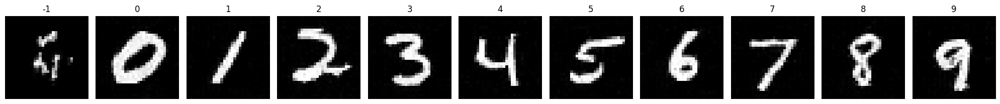

Epoch 109/400
468/468 [==============================] - 71s 151ms/step - loss: 0.0355 - noise_loss: 0.0252 - classifier_loss: 1.1945 - classifier_accuracy: 0.5747 - val_loss: 0.0575 - val_noise_loss: 0.0530 - val_image_loss: 0.2310 - val_classifier_loss: 0.5173 - val_classifier_accuracy: 0.8431 - learning_rate: 0.0041


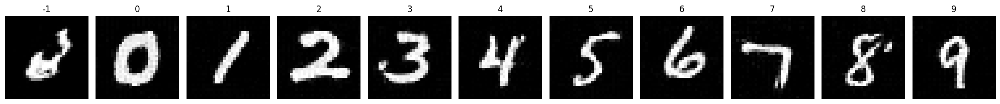

Epoch 110/400
468/468 [==============================] - 59s 125ms/step - loss: 0.0355 - noise_loss: 0.0253 - classifier_loss: 1.1906 - classifier_accuracy: 0.5860 - val_loss: 0.0564 - val_noise_loss: 0.0522 - val_image_loss: 0.2200 - val_classifier_loss: 0.4869 - val_classifier_accuracy: 0.8571 - learning_rate: 0.0041


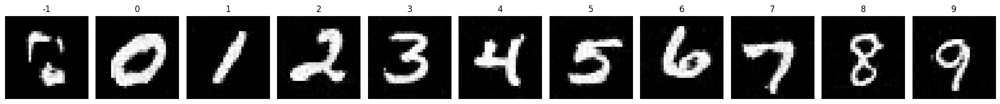

Epoch 111/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0356 - noise_loss: 0.0253 - classifier_loss: 1.1948 - classifier_accuracy: 0.5870 - val_loss: 0.0556 - val_noise_loss: 0.0517 - val_image_loss: 0.2192 - val_classifier_loss: 0.4624 - val_classifier_accuracy: 0.8613 - learning_rate: 0.0041


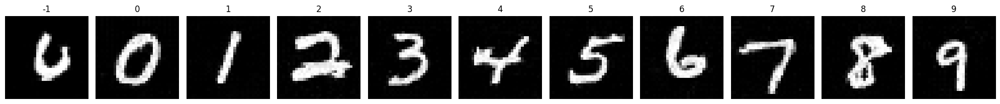

Epoch 112/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0356 - noise_loss: 0.0252 - classifier_loss: 1.2110 - classifier_accuracy: 0.5802 - val_loss: 0.0548 - val_noise_loss: 0.0506 - val_image_loss: 0.2209 - val_classifier_loss: 0.4788 - val_classifier_accuracy: 0.8535 - learning_rate: 0.0041


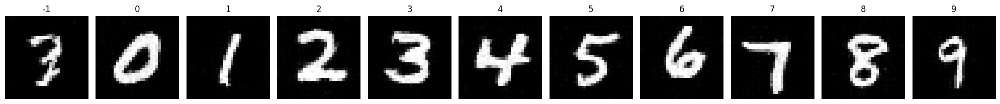

Epoch 113/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0362 - noise_loss: 0.0255 - classifier_loss: 1.2324 - classifier_accuracy: 0.5733 - val_loss: 0.0545 - val_noise_loss: 0.0505 - val_image_loss: 0.2177 - val_classifier_loss: 0.4700 - val_classifier_accuracy: 0.8586 - learning_rate: 0.0041


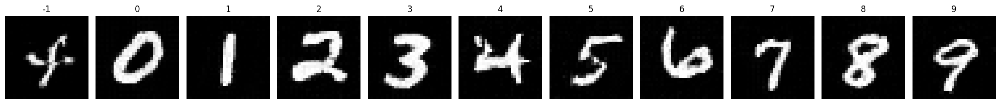

Epoch 114/400
468/468 [==============================] - 57s 123ms/step - loss: 0.0352 - noise_loss: 0.0253 - classifier_loss: 1.1511 - classifier_accuracy: 0.5970 - val_loss: 0.0536 - val_noise_loss: 0.0498 - val_image_loss: 0.2154 - val_classifier_loss: 0.4426 - val_classifier_accuracy: 0.8703 - learning_rate: 0.0041


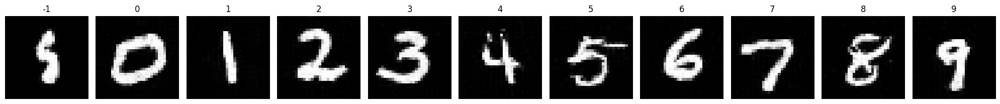

Epoch 115/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0351 - noise_loss: 0.0250 - classifier_loss: 1.1623 - classifier_accuracy: 0.6000 - val_loss: 0.0535 - val_noise_loss: 0.0499 - val_image_loss: 0.2179 - val_classifier_loss: 0.4205 - val_classifier_accuracy: 0.8758 - learning_rate: 0.0040


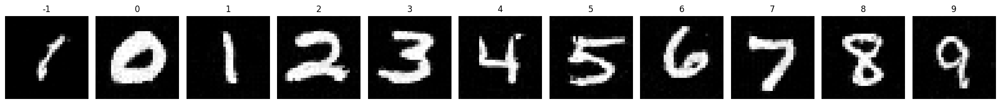

Epoch 116/400
468/468 [==============================] - 58s 124ms/step - loss: 0.0349 - noise_loss: 0.0251 - classifier_loss: 1.1393 - classifier_accuracy: 0.6104 - val_loss: 0.0536 - val_noise_loss: 0.0501 - val_image_loss: 0.2157 - val_classifier_loss: 0.4084 - val_classifier_accuracy: 0.8793 - learning_rate: 0.0040


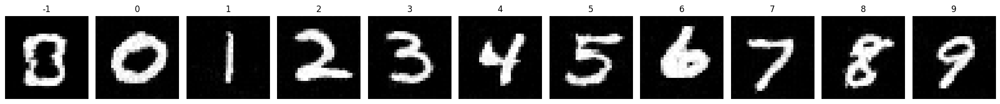

Epoch 117/400
468/468 [==============================] - 58s 123ms/step - loss: 0.0355 - noise_loss: 0.0253 - classifier_loss: 1.1822 - classifier_accuracy: 0.5879 - val_loss: 0.0527 - val_noise_loss: 0.0493 - val_image_loss: 0.2174 - val_classifier_loss: 0.4018 - val_classifier_accuracy: 0.8785 - learning_rate: 0.0040


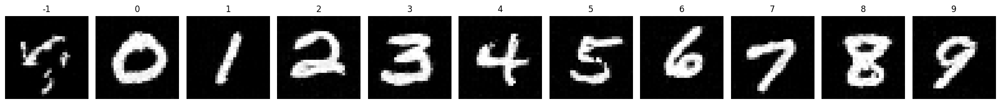

Epoch 118/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0355 - noise_loss: 0.0253 - classifier_loss: 1.1800 - classifier_accuracy: 0.5887 - val_loss: 0.0533 - val_noise_loss: 0.0498 - val_image_loss: 0.2144 - val_classifier_loss: 0.4081 - val_classifier_accuracy: 0.8776 - learning_rate: 0.0040


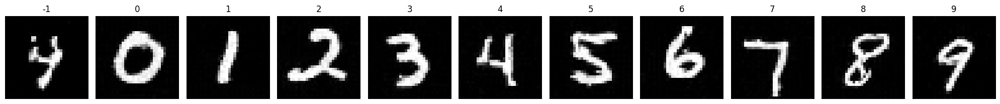

Epoch 119/400
468/468 [==============================] - 58s 123ms/step - loss: 0.0347 - noise_loss: 0.0250 - classifier_loss: 1.1160 - classifier_accuracy: 0.6144 - val_loss: 0.0525 - val_noise_loss: 0.0490 - val_image_loss: 0.2085 - val_classifier_loss: 0.4068 - val_classifier_accuracy: 0.8787 - learning_rate: 0.0040


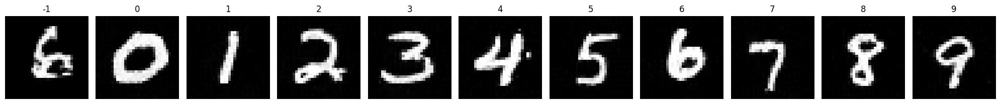

Epoch 120/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0346 - noise_loss: 0.0249 - classifier_loss: 1.1215 - classifier_accuracy: 0.6184 - val_loss: 0.0526 - val_noise_loss: 0.0491 - val_image_loss: 0.2073 - val_classifier_loss: 0.3997 - val_classifier_accuracy: 0.8830 - learning_rate: 0.0040


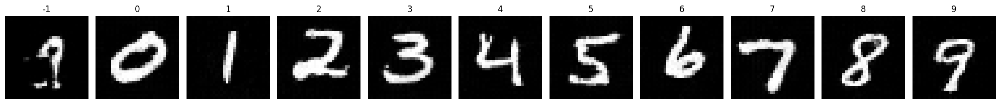

Epoch 121/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0381 - noise_loss: 0.0256 - classifier_loss: 1.4511 - classifier_accuracy: 0.5375 - val_loss: 0.0530 - val_noise_loss: 0.0494 - val_image_loss: 0.2154 - val_classifier_loss: 0.4094 - val_classifier_accuracy: 0.8753 - learning_rate: 0.0040


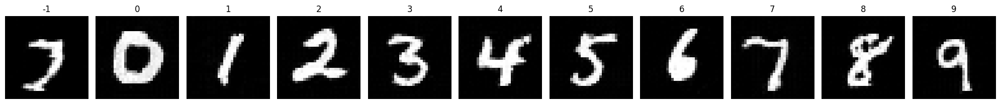

Epoch 122/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0376 - noise_loss: 0.0256 - classifier_loss: 1.3976 - classifier_accuracy: 0.5105 - val_loss: 0.0542 - val_noise_loss: 0.0503 - val_image_loss: 0.2227 - val_classifier_loss: 0.4553 - val_classifier_accuracy: 0.8578 - learning_rate: 0.0039


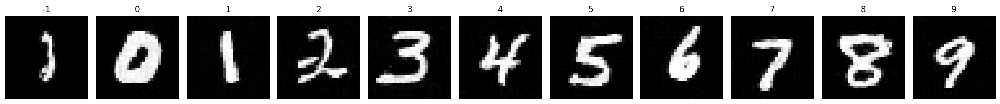

Epoch 123/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0351 - noise_loss: 0.0250 - classifier_loss: 1.1628 - classifier_accuracy: 0.5919 - val_loss: 0.0550 - val_noise_loss: 0.0512 - val_image_loss: 0.2275 - val_classifier_loss: 0.4404 - val_classifier_accuracy: 0.8644 - learning_rate: 0.0039


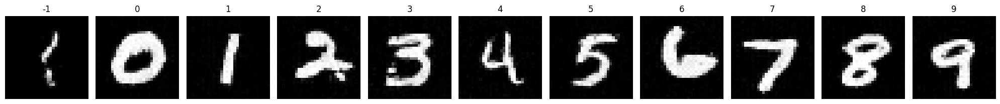

Epoch 124/400
468/468 [==============================] - 58s 122ms/step - loss: 0.0343 - noise_loss: 0.0248 - classifier_loss: 1.0970 - classifier_accuracy: 0.6230 - val_loss: 0.0542 - val_noise_loss: 0.0506 - val_image_loss: 0.2192 - val_classifier_loss: 0.4236 - val_classifier_accuracy: 0.8734 - learning_rate: 0.0039


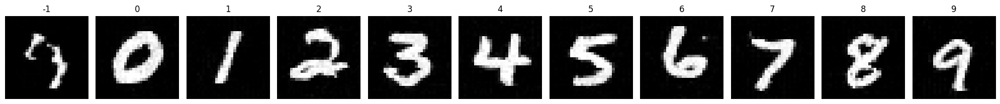

Epoch 125/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0395 - noise_loss: 0.0269 - classifier_loss: 1.4678 - classifier_accuracy: 0.4857 - val_loss: 0.0537 - val_noise_loss: 0.0497 - val_image_loss: 0.2131 - val_classifier_loss: 0.4574 - val_classifier_accuracy: 0.8634 - learning_rate: 0.0039


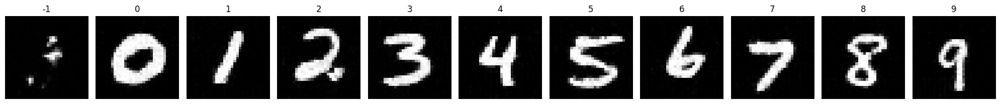

Epoch 126/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0390 - noise_loss: 0.0255 - classifier_loss: 1.5595 - classifier_accuracy: 0.4557 - val_loss: 0.0635 - val_noise_loss: 0.0575 - val_image_loss: 0.2423 - val_classifier_loss: 0.6990 - val_classifier_accuracy: 0.7925 - learning_rate: 0.0039


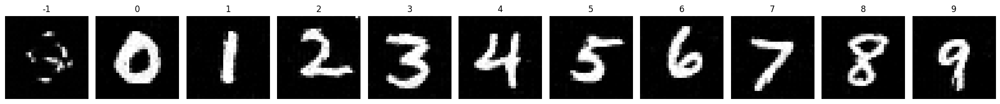

Epoch 127/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0373 - noise_loss: 0.0253 - classifier_loss: 1.3998 - classifier_accuracy: 0.5054 - val_loss: 0.0631 - val_noise_loss: 0.0568 - val_image_loss: 0.2555 - val_classifier_loss: 0.7320 - val_classifier_accuracy: 0.7710 - learning_rate: 0.0039


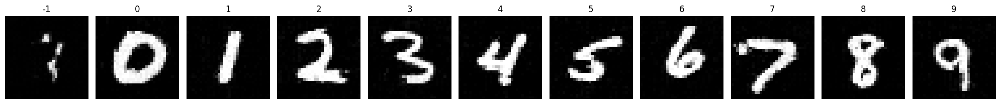

Epoch 128/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0359 - noise_loss: 0.0250 - classifier_loss: 1.2705 - classifier_accuracy: 0.5509 - val_loss: 0.0612 - val_noise_loss: 0.0554 - val_image_loss: 0.2539 - val_classifier_loss: 0.6755 - val_classifier_accuracy: 0.7904 - learning_rate: 0.0038


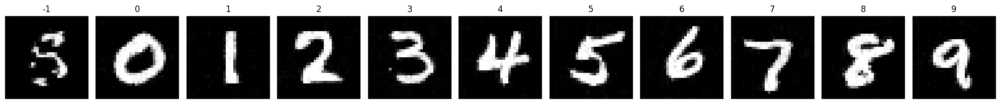

Epoch 129/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0382 - noise_loss: 0.0259 - classifier_loss: 1.4381 - classifier_accuracy: 0.4905 - val_loss: 0.0604 - val_noise_loss: 0.0549 - val_image_loss: 0.2542 - val_classifier_loss: 0.6378 - val_classifier_accuracy: 0.8061 - learning_rate: 0.0038


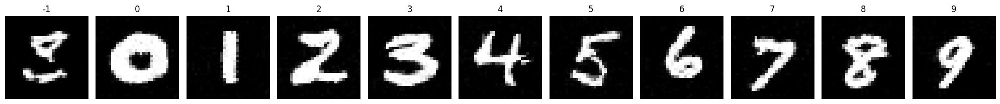

Epoch 130/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0373 - noise_loss: 0.0254 - classifier_loss: 1.3875 - classifier_accuracy: 0.5170 - val_loss: 0.0627 - val_noise_loss: 0.0571 - val_image_loss: 0.2841 - val_classifier_loss: 0.6407 - val_classifier_accuracy: 0.8091 - learning_rate: 0.0038


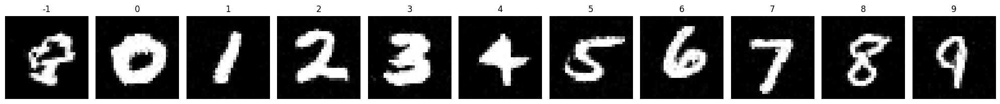

Epoch 131/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0358 - noise_loss: 0.0252 - classifier_loss: 1.2386 - classifier_accuracy: 0.5736 - val_loss: 0.0611 - val_noise_loss: 0.0559 - val_image_loss: 0.2513 - val_classifier_loss: 0.6094 - val_classifier_accuracy: 0.8130 - learning_rate: 0.0038


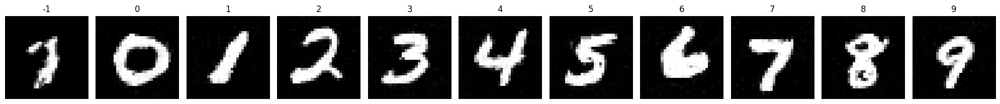

Epoch 132/400
468/468 [==============================] - 63s 135ms/step - loss: 0.0357 - noise_loss: 0.0252 - classifier_loss: 1.2222 - classifier_accuracy: 0.5779 - val_loss: 0.0590 - val_noise_loss: 0.0541 - val_image_loss: 0.2403 - val_classifier_loss: 0.5705 - val_classifier_accuracy: 0.8280 - learning_rate: 0.0038


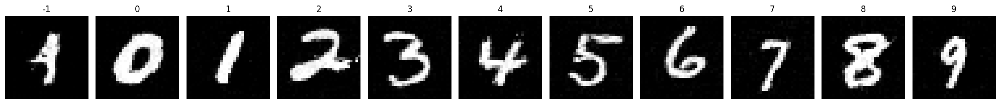

Epoch 133/400
468/468 [==============================] - 66s 140ms/step - loss: 0.0351 - noise_loss: 0.0250 - classifier_loss: 1.1880 - classifier_accuracy: 0.5849 - val_loss: 0.0572 - val_noise_loss: 0.0525 - val_image_loss: 0.2264 - val_classifier_loss: 0.5423 - val_classifier_accuracy: 0.8374 - learning_rate: 0.0038


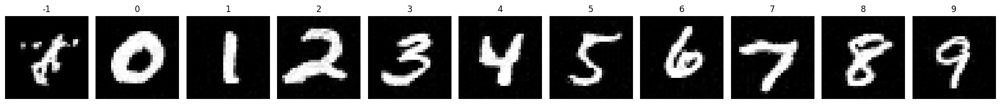

Epoch 134/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0348 - noise_loss: 0.0249 - classifier_loss: 1.1427 - classifier_accuracy: 0.5983 - val_loss: 0.0562 - val_noise_loss: 0.0518 - val_image_loss: 0.2199 - val_classifier_loss: 0.5148 - val_classifier_accuracy: 0.8431 - learning_rate: 0.0037


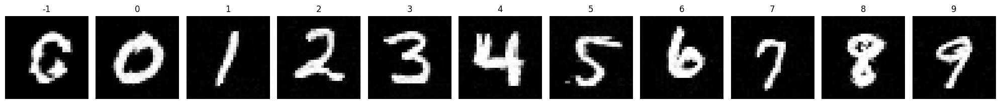

Epoch 135/400
468/468 [==============================] - 58s 122ms/step - loss: 0.0342 - noise_loss: 0.0247 - classifier_loss: 1.1042 - classifier_accuracy: 0.6158 - val_loss: 0.0550 - val_noise_loss: 0.0509 - val_image_loss: 0.2177 - val_classifier_loss: 0.4818 - val_classifier_accuracy: 0.8534 - learning_rate: 0.0037


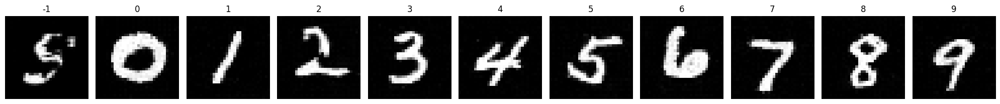

Epoch 136/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0344 - noise_loss: 0.0247 - classifier_loss: 1.1235 - classifier_accuracy: 0.6054 - val_loss: 0.0545 - val_noise_loss: 0.0506 - val_image_loss: 0.2123 - val_classifier_loss: 0.4568 - val_classifier_accuracy: 0.8640 - learning_rate: 0.0037


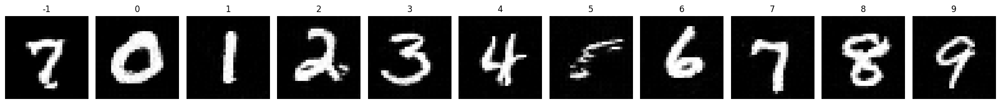

Epoch 137/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0342 - noise_loss: 0.0247 - classifier_loss: 1.1121 - classifier_accuracy: 0.6181 - val_loss: 0.0536 - val_noise_loss: 0.0499 - val_image_loss: 0.2132 - val_classifier_loss: 0.4290 - val_classifier_accuracy: 0.8713 - learning_rate: 0.0037


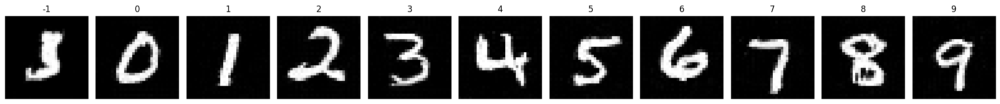

Epoch 138/400
468/468 [==============================] - 57s 120ms/step - loss: 0.0344 - noise_loss: 0.0248 - classifier_loss: 1.1188 - classifier_accuracy: 0.6064 - val_loss: 0.0532 - val_noise_loss: 0.0497 - val_image_loss: 0.2118 - val_classifier_loss: 0.4136 - val_classifier_accuracy: 0.8751 - learning_rate: 0.0037


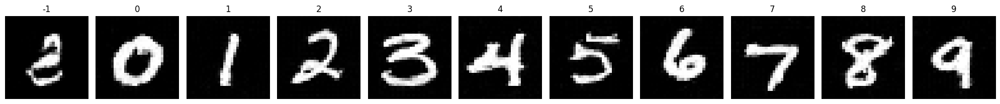

Epoch 139/400
468/468 [==============================] - 58s 123ms/step - loss: 0.0340 - noise_loss: 0.0247 - classifier_loss: 1.0905 - classifier_accuracy: 0.6242 - val_loss: 0.0529 - val_noise_loss: 0.0495 - val_image_loss: 0.2109 - val_classifier_loss: 0.3991 - val_classifier_accuracy: 0.8778 - learning_rate: 0.0037


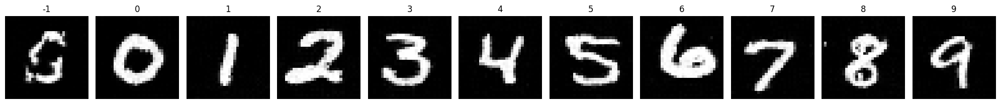

Epoch 140/400
468/468 [==============================] - 58s 123ms/step - loss: 0.0346 - noise_loss: 0.0251 - classifier_loss: 1.1108 - classifier_accuracy: 0.6163 - val_loss: 0.0523 - val_noise_loss: 0.0490 - val_image_loss: 0.2129 - val_classifier_loss: 0.3816 - val_classifier_accuracy: 0.8835 - learning_rate: 0.0036


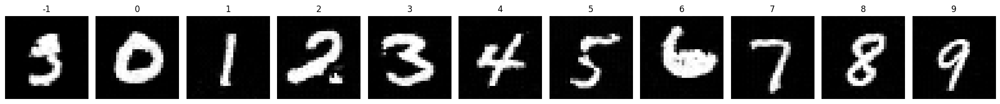

Epoch 141/400
468/468 [==============================] - 57s 121ms/step - loss: 0.0347 - noise_loss: 0.0246 - classifier_loss: 1.1794 - classifier_accuracy: 0.5901 - val_loss: 0.0527 - val_noise_loss: 0.0494 - val_image_loss: 0.2196 - val_classifier_loss: 0.3853 - val_classifier_accuracy: 0.8826 - learning_rate: 0.0036


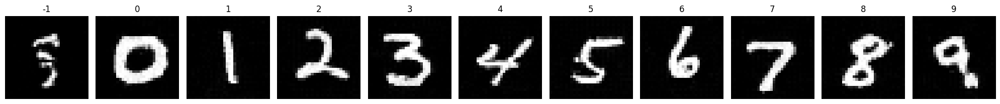

Epoch 142/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0342 - noise_loss: 0.0247 - classifier_loss: 1.1085 - classifier_accuracy: 0.6151 - val_loss: 0.0527 - val_noise_loss: 0.0495 - val_image_loss: 0.2191 - val_classifier_loss: 0.3806 - val_classifier_accuracy: 0.8852 - learning_rate: 0.0036


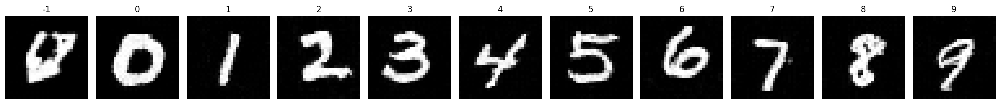

Epoch 143/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0339 - noise_loss: 0.0245 - classifier_loss: 1.0854 - classifier_accuracy: 0.6172 - val_loss: 0.0524 - val_noise_loss: 0.0492 - val_image_loss: 0.2096 - val_classifier_loss: 0.3665 - val_classifier_accuracy: 0.8895 - learning_rate: 0.0036


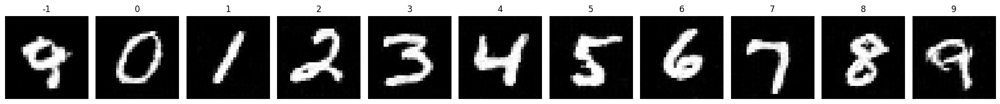

Epoch 144/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0341 - noise_loss: 0.0247 - classifier_loss: 1.0980 - classifier_accuracy: 0.6228 - val_loss: 0.0516 - val_noise_loss: 0.0485 - val_image_loss: 0.2126 - val_classifier_loss: 0.3614 - val_classifier_accuracy: 0.8900 - learning_rate: 0.0036


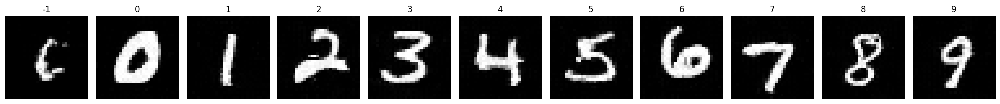

Epoch 145/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0346 - noise_loss: 0.0248 - classifier_loss: 1.1400 - classifier_accuracy: 0.6030 - val_loss: 0.0510 - val_noise_loss: 0.0479 - val_image_loss: 0.2137 - val_classifier_loss: 0.3611 - val_classifier_accuracy: 0.8905 - learning_rate: 0.0035


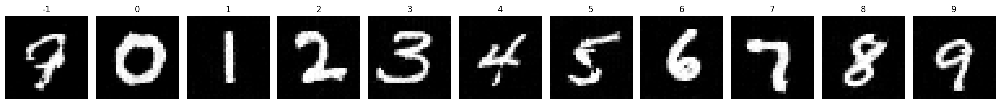

Epoch 146/400
468/468 [==============================] - 79s 168ms/step - loss: 0.0339 - noise_loss: 0.0246 - classifier_loss: 1.0848 - classifier_accuracy: 0.6179 - val_loss: 0.0514 - val_noise_loss: 0.0484 - val_image_loss: 0.2077 - val_classifier_loss: 0.3527 - val_classifier_accuracy: 0.8939 - learning_rate: 0.0035


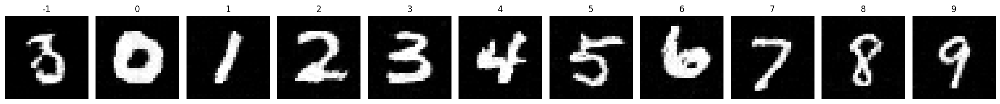

Epoch 147/400
468/468 [==============================] - 82s 174ms/step - loss: 0.0343 - noise_loss: 0.0248 - classifier_loss: 1.0993 - classifier_accuracy: 0.6208 - val_loss: 0.0513 - val_noise_loss: 0.0483 - val_image_loss: 0.2053 - val_classifier_loss: 0.3515 - val_classifier_accuracy: 0.8927 - learning_rate: 0.0035


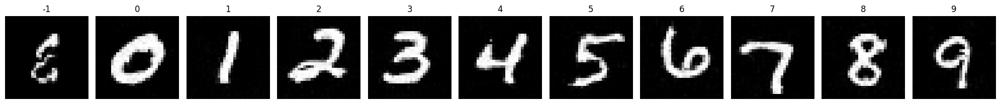

Epoch 148/400
468/468 [==============================] - 74s 158ms/step - loss: 0.0339 - noise_loss: 0.0247 - classifier_loss: 1.0641 - classifier_accuracy: 0.6271 - val_loss: 0.0514 - val_noise_loss: 0.0484 - val_image_loss: 0.1944 - val_classifier_loss: 0.3518 - val_classifier_accuracy: 0.8934 - learning_rate: 0.0035


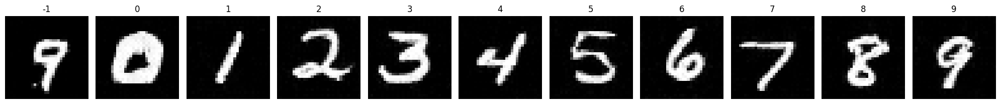

Epoch 149/400
468/468 [==============================] - 73s 155ms/step - loss: 0.0340 - noise_loss: 0.0247 - classifier_loss: 1.0773 - classifier_accuracy: 0.6240 - val_loss: 0.0515 - val_noise_loss: 0.0485 - val_image_loss: 0.1982 - val_classifier_loss: 0.3447 - val_classifier_accuracy: 0.8935 - learning_rate: 0.0035


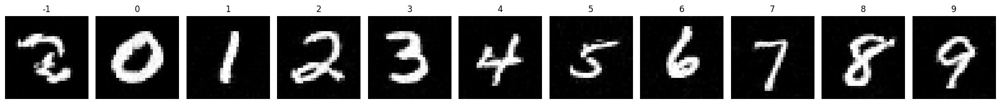

Epoch 150/400
468/468 [==============================] - 88s 188ms/step - loss: 0.0344 - noise_loss: 0.0248 - classifier_loss: 1.1118 - classifier_accuracy: 0.6137 - val_loss: 0.0526 - val_noise_loss: 0.0494 - val_image_loss: 0.2023 - val_classifier_loss: 0.3711 - val_classifier_accuracy: 0.8831 - learning_rate: 0.0035


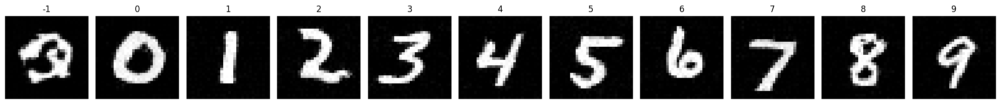

Epoch 151/400
468/468 [==============================] - 88s 188ms/step - loss: 0.0351 - noise_loss: 0.0250 - classifier_loss: 1.1563 - classifier_accuracy: 0.6004 - val_loss: 0.0518 - val_noise_loss: 0.0487 - val_image_loss: 0.2032 - val_classifier_loss: 0.3673 - val_classifier_accuracy: 0.8870 - learning_rate: 0.0034


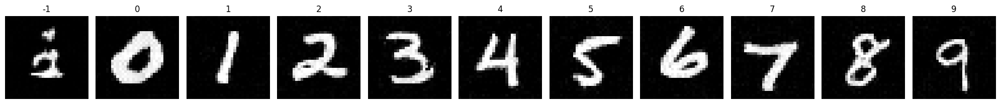

Epoch 152/400
468/468 [==============================] - 90s 193ms/step - loss: 0.0353 - noise_loss: 0.0248 - classifier_loss: 1.2166 - classifier_accuracy: 0.5796 - val_loss: 0.0525 - val_noise_loss: 0.0492 - val_image_loss: 0.2140 - val_classifier_loss: 0.3829 - val_classifier_accuracy: 0.8821 - learning_rate: 0.0034


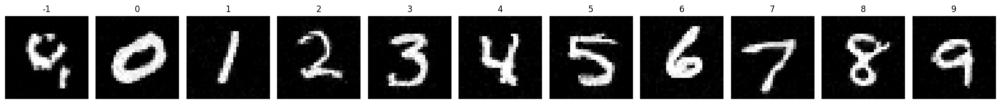

Epoch 153/400
468/468 [==============================] - 87s 186ms/step - loss: 0.0342 - noise_loss: 0.0246 - classifier_loss: 1.1170 - classifier_accuracy: 0.6046 - val_loss: 0.0530 - val_noise_loss: 0.0496 - val_image_loss: 0.2188 - val_classifier_loss: 0.3913 - val_classifier_accuracy: 0.8793 - learning_rate: 0.0034


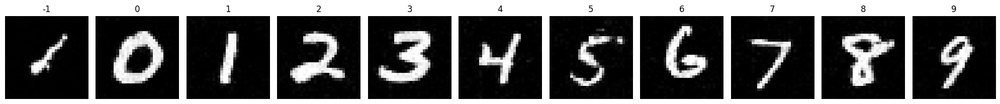

Epoch 154/400
468/468 [==============================] - 86s 183ms/step - loss: 0.0348 - noise_loss: 0.0249 - classifier_loss: 1.1519 - classifier_accuracy: 0.6006 - val_loss: 0.0529 - val_noise_loss: 0.0496 - val_image_loss: 0.2312 - val_classifier_loss: 0.3820 - val_classifier_accuracy: 0.8842 - learning_rate: 0.0034


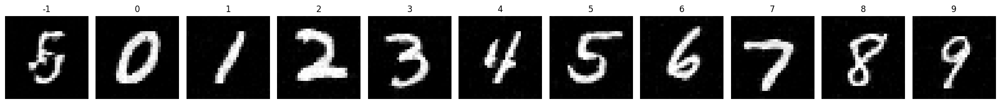

Epoch 155/400
468/468 [==============================] - 86s 183ms/step - loss: 0.0339 - noise_loss: 0.0245 - classifier_loss: 1.0890 - classifier_accuracy: 0.6223 - val_loss: 0.0532 - val_noise_loss: 0.0501 - val_image_loss: 0.2263 - val_classifier_loss: 0.3636 - val_classifier_accuracy: 0.8914 - learning_rate: 0.0034


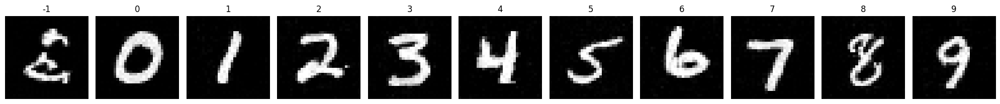

Epoch 156/400
468/468 [==============================] - 86s 184ms/step - loss: 0.0338 - noise_loss: 0.0245 - classifier_loss: 1.0900 - classifier_accuracy: 0.6242 - val_loss: 0.0519 - val_noise_loss: 0.0490 - val_image_loss: 0.2237 - val_classifier_loss: 0.3458 - val_classifier_accuracy: 0.8964 - learning_rate: 0.0033


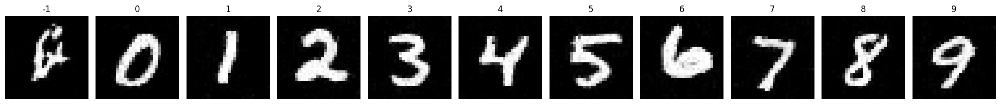

Epoch 157/400
468/468 [==============================] - 87s 186ms/step - loss: 0.0338 - noise_loss: 0.0247 - classifier_loss: 1.0580 - classifier_accuracy: 0.6381 - val_loss: 0.0518 - val_noise_loss: 0.0489 - val_image_loss: 0.2111 - val_classifier_loss: 0.3369 - val_classifier_accuracy: 0.8987 - learning_rate: 0.0033


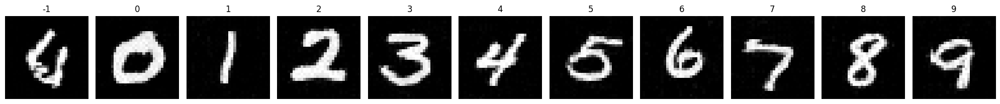

Epoch 158/400
468/468 [==============================] - 85s 183ms/step - loss: 0.0334 - noise_loss: 0.0245 - classifier_loss: 1.0404 - classifier_accuracy: 0.6399 - val_loss: 0.0520 - val_noise_loss: 0.0491 - val_image_loss: 0.2168 - val_classifier_loss: 0.3324 - val_classifier_accuracy: 0.9013 - learning_rate: 0.0033


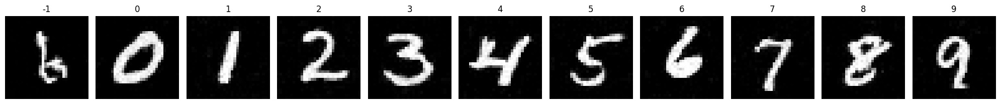

Epoch 159/400
468/468 [==============================] - 85s 182ms/step - loss: 0.0339 - noise_loss: 0.0245 - classifier_loss: 1.0880 - classifier_accuracy: 0.6213 - val_loss: 0.0519 - val_noise_loss: 0.0491 - val_image_loss: 0.2050 - val_classifier_loss: 0.3235 - val_classifier_accuracy: 0.9046 - learning_rate: 0.0033


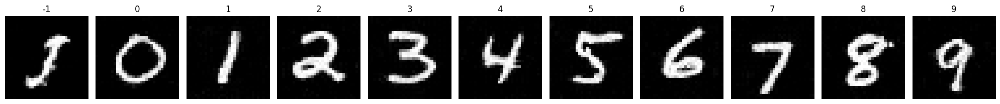

Epoch 160/400
468/468 [==============================] - 85s 183ms/step - loss: 0.0335 - noise_loss: 0.0243 - classifier_loss: 1.0729 - classifier_accuracy: 0.6281 - val_loss: 0.0519 - val_noise_loss: 0.0492 - val_image_loss: 0.2005 - val_classifier_loss: 0.3143 - val_classifier_accuracy: 0.9068 - learning_rate: 0.0033


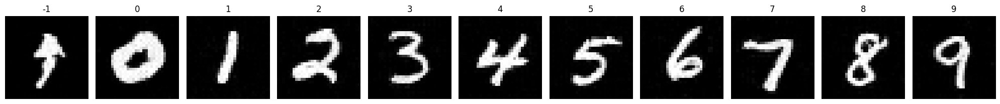

Epoch 161/400
468/468 [==============================] - 89s 190ms/step - loss: 0.0333 - noise_loss: 0.0244 - classifier_loss: 1.0417 - classifier_accuracy: 0.6380 - val_loss: 0.0514 - val_noise_loss: 0.0488 - val_image_loss: 0.2050 - val_classifier_loss: 0.3002 - val_classifier_accuracy: 0.9095 - learning_rate: 0.0033


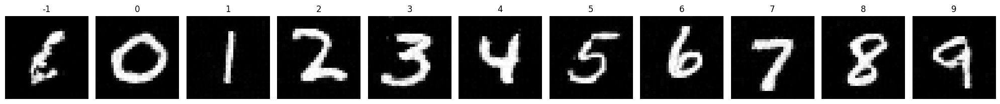

Epoch 162/400
468/468 [==============================] - 87s 185ms/step - loss: 0.0334 - noise_loss: 0.0245 - classifier_loss: 1.0392 - classifier_accuracy: 0.6411 - val_loss: 0.0512 - val_noise_loss: 0.0486 - val_image_loss: 0.2105 - val_classifier_loss: 0.2946 - val_classifier_accuracy: 0.9121 - learning_rate: 0.0032


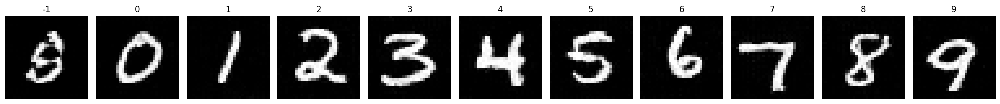

Epoch 163/400
468/468 [==============================] - 88s 189ms/step - loss: 0.0354 - noise_loss: 0.0253 - classifier_loss: 1.1768 - classifier_accuracy: 0.5918 - val_loss: 0.0516 - val_noise_loss: 0.0490 - val_image_loss: 0.2046 - val_classifier_loss: 0.3086 - val_classifier_accuracy: 0.9109 - learning_rate: 0.0032


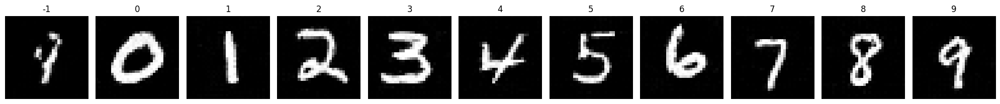

Epoch 164/400
468/468 [==============================] - 89s 190ms/step - loss: 0.0351 - noise_loss: 0.0250 - classifier_loss: 1.1727 - classifier_accuracy: 0.5944 - val_loss: 0.0516 - val_noise_loss: 0.0489 - val_image_loss: 0.2126 - val_classifier_loss: 0.3152 - val_classifier_accuracy: 0.9073 - learning_rate: 0.0032


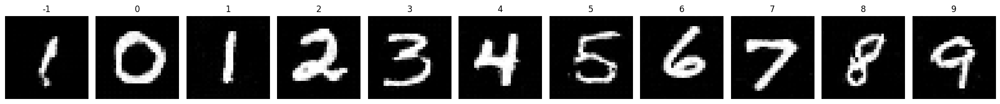

Epoch 165/400
468/468 [==============================] - 89s 190ms/step - loss: 0.0343 - noise_loss: 0.0247 - classifier_loss: 1.1214 - classifier_accuracy: 0.6156 - val_loss: 0.0530 - val_noise_loss: 0.0503 - val_image_loss: 0.2139 - val_classifier_loss: 0.3161 - val_classifier_accuracy: 0.9058 - learning_rate: 0.0032


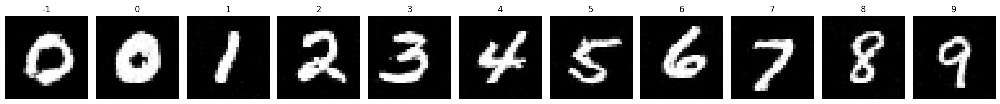

Epoch 166/400
468/468 [==============================] - 92s 196ms/step - loss: 0.0333 - noise_loss: 0.0243 - classifier_loss: 1.0495 - classifier_accuracy: 0.6398 - val_loss: 0.0526 - val_noise_loss: 0.0499 - val_image_loss: 0.2073 - val_classifier_loss: 0.3094 - val_classifier_accuracy: 0.9085 - learning_rate: 0.0032


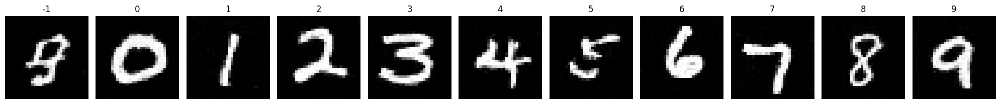

Epoch 167/400
468/468 [==============================] - 85s 182ms/step - loss: 0.0334 - noise_loss: 0.0244 - classifier_loss: 1.0513 - classifier_accuracy: 0.6412 - val_loss: 0.0517 - val_noise_loss: 0.0491 - val_image_loss: 0.2163 - val_classifier_loss: 0.2999 - val_classifier_accuracy: 0.9111 - learning_rate: 0.0031


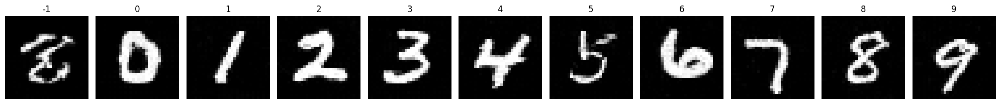

Epoch 168/400
468/468 [==============================] - 88s 187ms/step - loss: 0.0332 - noise_loss: 0.0243 - classifier_loss: 1.0353 - classifier_accuracy: 0.6393 - val_loss: 0.0517 - val_noise_loss: 0.0492 - val_image_loss: 0.2078 - val_classifier_loss: 0.2957 - val_classifier_accuracy: 0.9108 - learning_rate: 0.0031


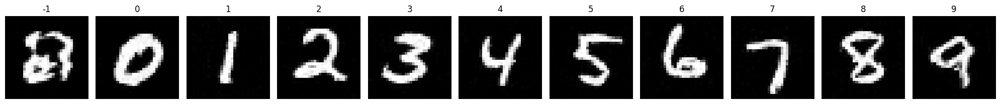

Epoch 169/400
468/468 [==============================] - 82s 176ms/step - loss: 0.0328 - noise_loss: 0.0243 - classifier_loss: 0.9940 - classifier_accuracy: 0.6586 - val_loss: 0.0511 - val_noise_loss: 0.0487 - val_image_loss: 0.2120 - val_classifier_loss: 0.2847 - val_classifier_accuracy: 0.9129 - learning_rate: 0.0031


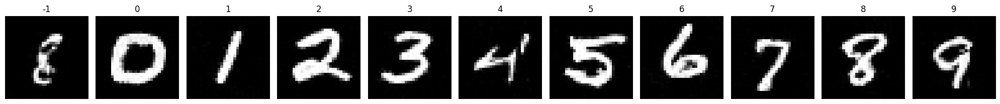

Epoch 170/400
468/468 [==============================] - 88s 187ms/step - loss: 0.0332 - noise_loss: 0.0244 - classifier_loss: 1.0359 - classifier_accuracy: 0.6473 - val_loss: 0.0517 - val_noise_loss: 0.0493 - val_image_loss: 0.2040 - val_classifier_loss: 0.2764 - val_classifier_accuracy: 0.9158 - learning_rate: 0.0031


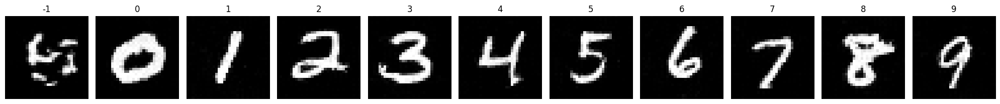

Epoch 171/400
468/468 [==============================] - 92s 197ms/step - loss: 0.0332 - noise_loss: 0.0245 - classifier_loss: 1.0060 - classifier_accuracy: 0.6532 - val_loss: 0.0511 - val_noise_loss: 0.0488 - val_image_loss: 0.2029 - val_classifier_loss: 0.2719 - val_classifier_accuracy: 0.9163 - learning_rate: 0.0031


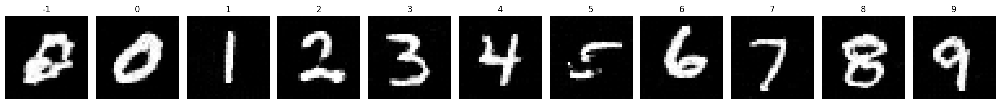

Epoch 172/400
468/468 [==============================] - 88s 189ms/step - loss: 0.0324 - noise_loss: 0.0242 - classifier_loss: 0.9523 - classifier_accuracy: 0.6686 - val_loss: 0.0514 - val_noise_loss: 0.0491 - val_image_loss: 0.2013 - val_classifier_loss: 0.2644 - val_classifier_accuracy: 0.9180 - learning_rate: 0.0030


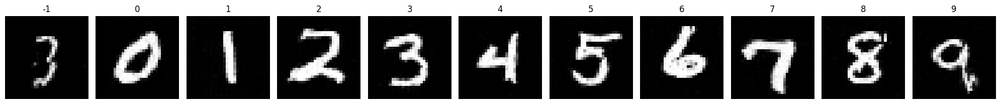

Epoch 173/400
468/468 [==============================] - 89s 190ms/step - loss: 0.0330 - noise_loss: 0.0243 - classifier_loss: 1.0014 - classifier_accuracy: 0.6556 - val_loss: 0.0511 - val_noise_loss: 0.0488 - val_image_loss: 0.2045 - val_classifier_loss: 0.2695 - val_classifier_accuracy: 0.9159 - learning_rate: 0.0030


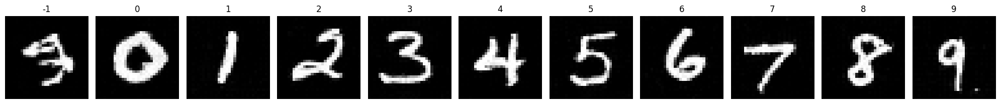

Epoch 174/400
468/468 [==============================] - 70s 150ms/step - loss: 0.0329 - noise_loss: 0.0242 - classifier_loss: 1.0091 - classifier_accuracy: 0.6559 - val_loss: 0.0507 - val_noise_loss: 0.0483 - val_image_loss: 0.2089 - val_classifier_loss: 0.2784 - val_classifier_accuracy: 0.9136 - learning_rate: 0.0030


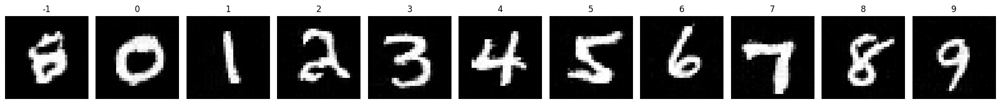

Epoch 175/400
468/468 [==============================] - 71s 151ms/step - loss: 0.0328 - noise_loss: 0.0243 - classifier_loss: 0.9924 - classifier_accuracy: 0.6594 - val_loss: 0.0512 - val_noise_loss: 0.0488 - val_image_loss: 0.2002 - val_classifier_loss: 0.2731 - val_classifier_accuracy: 0.9143 - learning_rate: 0.0030


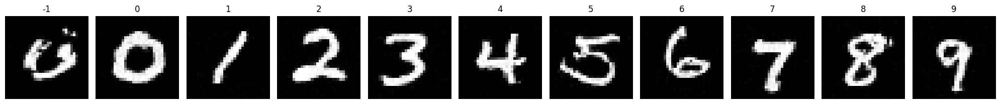

Epoch 176/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0323 - noise_loss: 0.0241 - classifier_loss: 0.9589 - classifier_accuracy: 0.6704 - val_loss: 0.0505 - val_noise_loss: 0.0482 - val_image_loss: 0.2066 - val_classifier_loss: 0.2625 - val_classifier_accuracy: 0.9183 - learning_rate: 0.0030


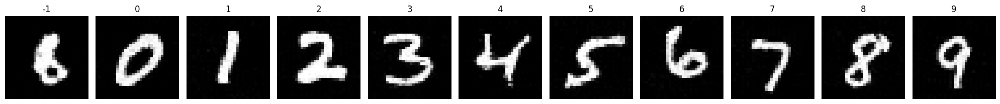

Epoch 177/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0322 - noise_loss: 0.0239 - classifier_loss: 0.9577 - classifier_accuracy: 0.6744 - val_loss: 0.0501 - val_noise_loss: 0.0479 - val_image_loss: 0.2038 - val_classifier_loss: 0.2554 - val_classifier_accuracy: 0.9199 - learning_rate: 0.0029


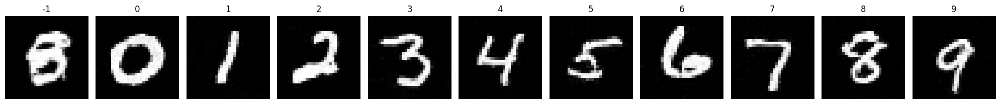

Epoch 178/400
468/468 [==============================] - 71s 151ms/step - loss: 0.0322 - noise_loss: 0.0241 - classifier_loss: 0.9506 - classifier_accuracy: 0.6716 - val_loss: 0.0500 - val_noise_loss: 0.0479 - val_image_loss: 0.2059 - val_classifier_loss: 0.2510 - val_classifier_accuracy: 0.9225 - learning_rate: 0.0029


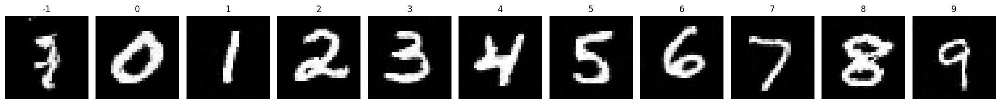

Epoch 179/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0325 - noise_loss: 0.0242 - classifier_loss: 0.9644 - classifier_accuracy: 0.6629 - val_loss: 0.0500 - val_noise_loss: 0.0478 - val_image_loss: 0.2048 - val_classifier_loss: 0.2464 - val_classifier_accuracy: 0.9236 - learning_rate: 0.0029


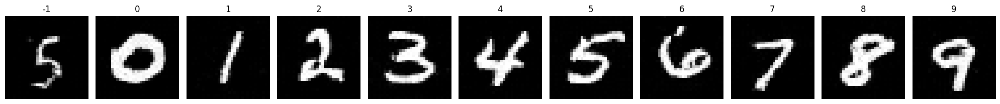

Epoch 180/400
468/468 [==============================] - 71s 152ms/step - loss: 0.0325 - noise_loss: 0.0240 - classifier_loss: 0.9800 - classifier_accuracy: 0.6629 - val_loss: 0.0502 - val_noise_loss: 0.0481 - val_image_loss: 0.2013 - val_classifier_loss: 0.2429 - val_classifier_accuracy: 0.9253 - learning_rate: 0.0029


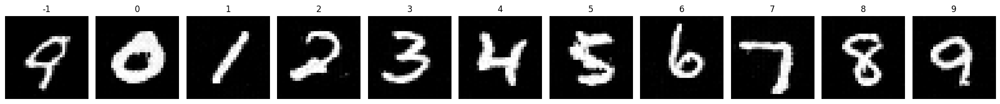

Epoch 181/400
468/468 [==============================] - 69s 147ms/step - loss: 0.0324 - noise_loss: 0.0242 - classifier_loss: 0.9510 - classifier_accuracy: 0.6711 - val_loss: 0.0501 - val_noise_loss: 0.0481 - val_image_loss: 0.1991 - val_classifier_loss: 0.2364 - val_classifier_accuracy: 0.9267 - learning_rate: 0.0029


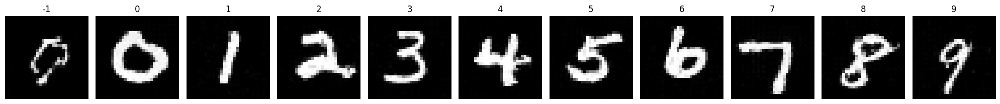

Epoch 182/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0324 - noise_loss: 0.0242 - classifier_loss: 0.9581 - classifier_accuracy: 0.6752 - val_loss: 0.0499 - val_noise_loss: 0.0479 - val_image_loss: 0.2054 - val_classifier_loss: 0.2319 - val_classifier_accuracy: 0.9282 - learning_rate: 0.0029


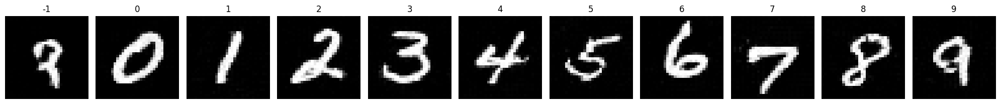

Epoch 183/400
468/468 [==============================] - 63s 134ms/step - loss: 0.0322 - noise_loss: 0.0239 - classifier_loss: 0.9700 - classifier_accuracy: 0.6689 - val_loss: 0.0499 - val_noise_loss: 0.0479 - val_image_loss: 0.1999 - val_classifier_loss: 0.2275 - val_classifier_accuracy: 0.9281 - learning_rate: 0.0028


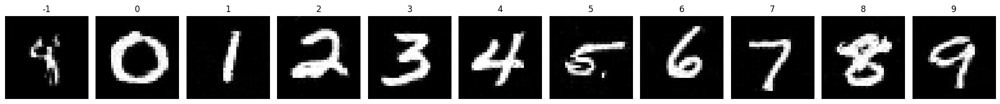

Epoch 184/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0324 - noise_loss: 0.0242 - classifier_loss: 0.9634 - classifier_accuracy: 0.6676 - val_loss: 0.0495 - val_noise_loss: 0.0475 - val_image_loss: 0.1996 - val_classifier_loss: 0.2222 - val_classifier_accuracy: 0.9316 - learning_rate: 0.0028


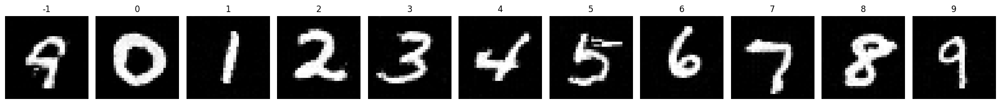

Epoch 185/400
468/468 [==============================] - 74s 158ms/step - loss: 0.0327 - noise_loss: 0.0243 - classifier_loss: 0.9829 - classifier_accuracy: 0.6579 - val_loss: 0.0489 - val_noise_loss: 0.0470 - val_image_loss: 0.2016 - val_classifier_loss: 0.2226 - val_classifier_accuracy: 0.9305 - learning_rate: 0.0028


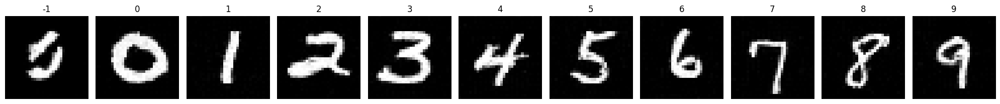

Epoch 186/400
468/468 [==============================] - 72s 154ms/step - loss: 0.0325 - noise_loss: 0.0241 - classifier_loss: 0.9845 - classifier_accuracy: 0.6578 - val_loss: 0.0500 - val_noise_loss: 0.0481 - val_image_loss: 0.1944 - val_classifier_loss: 0.2221 - val_classifier_accuracy: 0.9314 - learning_rate: 0.0028


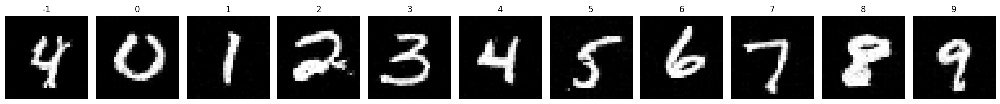

Epoch 187/400
468/468 [==============================] - 80s 170ms/step - loss: 0.0320 - noise_loss: 0.0240 - classifier_loss: 0.9262 - classifier_accuracy: 0.6814 - val_loss: 0.0496 - val_noise_loss: 0.0477 - val_image_loss: 0.1944 - val_classifier_loss: 0.2198 - val_classifier_accuracy: 0.9319 - learning_rate: 0.0028


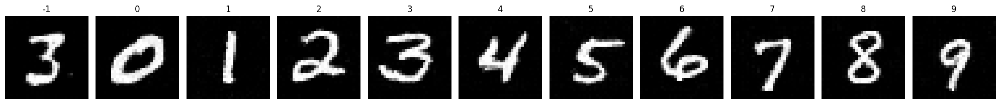

Epoch 188/400
468/468 [==============================] - 73s 156ms/step - loss: 0.0319 - noise_loss: 0.0240 - classifier_loss: 0.9156 - classifier_accuracy: 0.6802 - val_loss: 0.0495 - val_noise_loss: 0.0476 - val_image_loss: 0.2021 - val_classifier_loss: 0.2163 - val_classifier_accuracy: 0.9342 - learning_rate: 0.0027


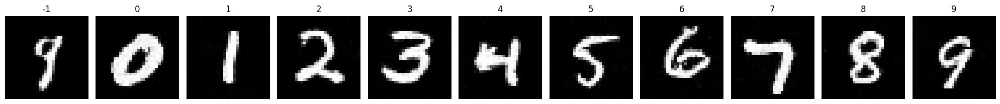

Epoch 189/400
468/468 [==============================] - 85s 182ms/step - loss: 0.0319 - noise_loss: 0.0239 - classifier_loss: 0.9349 - classifier_accuracy: 0.6824 - val_loss: 0.0494 - val_noise_loss: 0.0475 - val_image_loss: 0.2036 - val_classifier_loss: 0.2139 - val_classifier_accuracy: 0.9335 - learning_rate: 0.0027


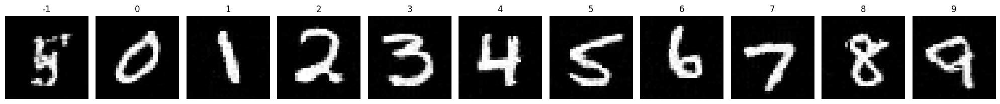

Epoch 190/400
468/468 [==============================] - 76s 163ms/step - loss: 0.0318 - noise_loss: 0.0239 - classifier_loss: 0.9129 - classifier_accuracy: 0.6830 - val_loss: 0.0494 - val_noise_loss: 0.0476 - val_image_loss: 0.2026 - val_classifier_loss: 0.2107 - val_classifier_accuracy: 0.9349 - learning_rate: 0.0027


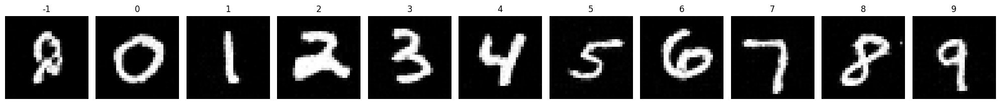

Epoch 191/400
468/468 [==============================] - 75s 159ms/step - loss: 0.0322 - noise_loss: 0.0238 - classifier_loss: 0.9711 - classifier_accuracy: 0.6676 - val_loss: 0.0496 - val_noise_loss: 0.0477 - val_image_loss: 0.1975 - val_classifier_loss: 0.2133 - val_classifier_accuracy: 0.9332 - learning_rate: 0.0027


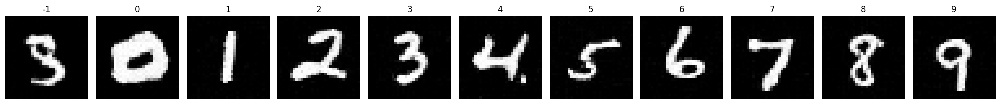

Epoch 192/400
468/468 [==============================] - 65s 138ms/step - loss: 0.0319 - noise_loss: 0.0238 - classifier_loss: 0.9297 - classifier_accuracy: 0.6847 - val_loss: 0.0493 - val_noise_loss: 0.0474 - val_image_loss: 0.2043 - val_classifier_loss: 0.2162 - val_classifier_accuracy: 0.9317 - learning_rate: 0.0027


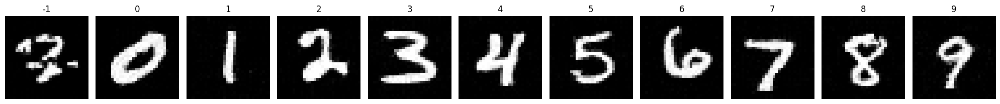

Epoch 193/400
468/468 [==============================] - 64s 136ms/step - loss: 0.0319 - noise_loss: 0.0240 - classifier_loss: 0.9223 - classifier_accuracy: 0.6836 - val_loss: 0.0494 - val_noise_loss: 0.0475 - val_image_loss: 0.2025 - val_classifier_loss: 0.2150 - val_classifier_accuracy: 0.9336 - learning_rate: 0.0026


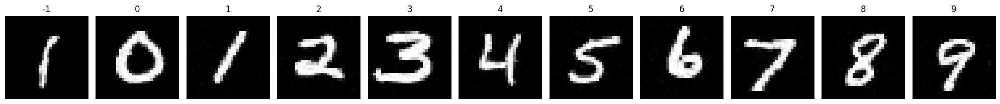

Epoch 194/400
468/468 [==============================] - 65s 139ms/step - loss: 0.0317 - noise_loss: 0.0239 - classifier_loss: 0.9119 - classifier_accuracy: 0.6835 - val_loss: 0.0486 - val_noise_loss: 0.0468 - val_image_loss: 0.2033 - val_classifier_loss: 0.2110 - val_classifier_accuracy: 0.9344 - learning_rate: 0.0026


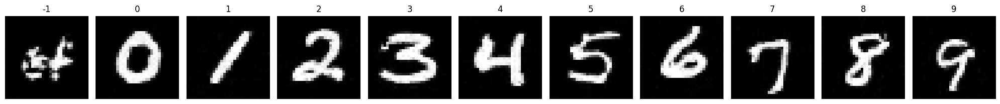

Epoch 195/400
468/468 [==============================] - 67s 142ms/step - loss: 0.0316 - noise_loss: 0.0239 - classifier_loss: 0.8991 - classifier_accuracy: 0.6879 - val_loss: 0.0492 - val_noise_loss: 0.0474 - val_image_loss: 0.1997 - val_classifier_loss: 0.2091 - val_classifier_accuracy: 0.9354 - learning_rate: 0.0026


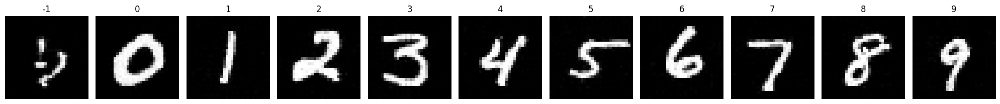

Epoch 196/400
468/468 [==============================] - 66s 141ms/step - loss: 0.0326 - noise_loss: 0.0242 - classifier_loss: 0.9706 - classifier_accuracy: 0.6668 - val_loss: 0.0492 - val_noise_loss: 0.0474 - val_image_loss: 0.2017 - val_classifier_loss: 0.2059 - val_classifier_accuracy: 0.9379 - learning_rate: 0.0026


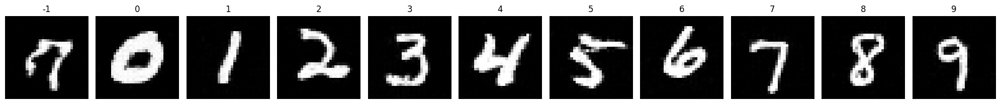

Epoch 197/400
468/468 [==============================] - 62s 132ms/step - loss: 0.0320 - noise_loss: 0.0240 - classifier_loss: 0.9330 - classifier_accuracy: 0.6785 - val_loss: 0.0491 - val_noise_loss: 0.0473 - val_image_loss: 0.2004 - val_classifier_loss: 0.2057 - val_classifier_accuracy: 0.9368 - learning_rate: 0.0026


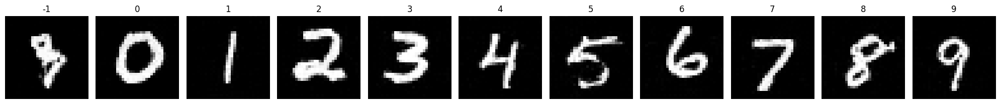

Epoch 198/400
468/468 [==============================] - 58s 124ms/step - loss: 0.0316 - noise_loss: 0.0238 - classifier_loss: 0.9095 - classifier_accuracy: 0.6793 - val_loss: 0.0493 - val_noise_loss: 0.0476 - val_image_loss: 0.2021 - val_classifier_loss: 0.2049 - val_classifier_accuracy: 0.9372 - learning_rate: 0.0025


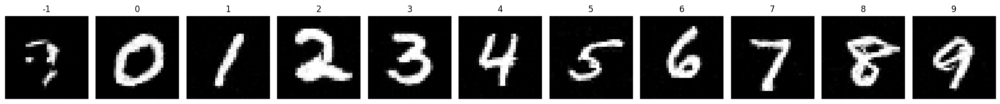

Epoch 199/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0313 - noise_loss: 0.0238 - classifier_loss: 0.8627 - classifier_accuracy: 0.7031 - val_loss: 0.0489 - val_noise_loss: 0.0471 - val_image_loss: 0.2055 - val_classifier_loss: 0.2024 - val_classifier_accuracy: 0.9386 - learning_rate: 0.0025


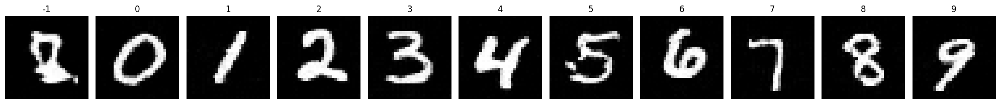

Epoch 200/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0316 - noise_loss: 0.0237 - classifier_loss: 0.9167 - classifier_accuracy: 0.6862 - val_loss: 0.0489 - val_noise_loss: 0.0472 - val_image_loss: 0.2056 - val_classifier_loss: 0.1998 - val_classifier_accuracy: 0.9397 - learning_rate: 0.0025


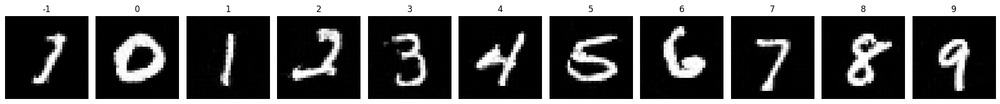

Epoch 201/400
468/468 [==============================] - 58s 122ms/step - loss: 0.0315 - noise_loss: 0.0237 - classifier_loss: 0.9088 - classifier_accuracy: 0.6854 - val_loss: 0.0491 - val_noise_loss: 0.0474 - val_image_loss: 0.1992 - val_classifier_loss: 0.1976 - val_classifier_accuracy: 0.9391 - learning_rate: 0.0025


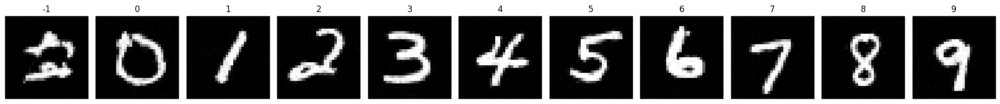

Epoch 202/400
468/468 [==============================] - 57s 122ms/step - loss: 0.0316 - noise_loss: 0.0238 - classifier_loss: 0.9098 - classifier_accuracy: 0.6851 - val_loss: 0.0489 - val_noise_loss: 0.0473 - val_image_loss: 0.2023 - val_classifier_loss: 0.1942 - val_classifier_accuracy: 0.9394 - learning_rate: 0.0025


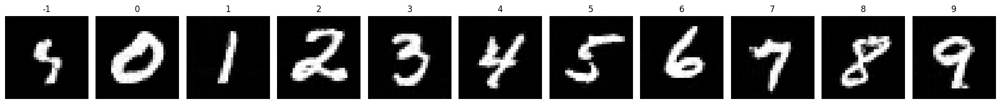

Epoch 203/400
468/468 [==============================] - 64s 137ms/step - loss: 0.0314 - noise_loss: 0.0238 - classifier_loss: 0.8823 - classifier_accuracy: 0.6927 - val_loss: 0.0493 - val_noise_loss: 0.0476 - val_image_loss: 0.1986 - val_classifier_loss: 0.1925 - val_classifier_accuracy: 0.9418 - learning_rate: 0.0024


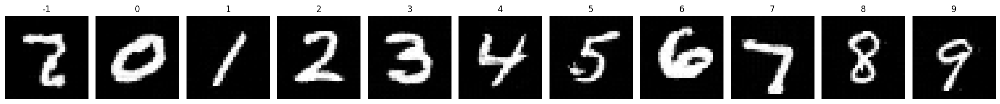

Epoch 204/400
468/468 [==============================] - 72s 152ms/step - loss: 0.0320 - noise_loss: 0.0239 - classifier_loss: 0.9323 - classifier_accuracy: 0.6788 - val_loss: 0.0494 - val_noise_loss: 0.0477 - val_image_loss: 0.1978 - val_classifier_loss: 0.1973 - val_classifier_accuracy: 0.9399 - learning_rate: 0.0024


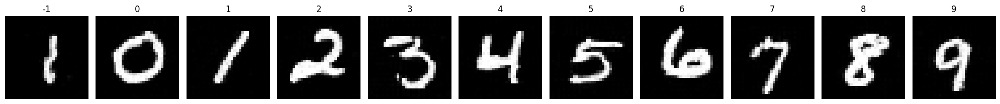

Epoch 205/400
468/468 [==============================] - 70s 150ms/step - loss: 0.0317 - noise_loss: 0.0237 - classifier_loss: 0.9203 - classifier_accuracy: 0.6767 - val_loss: 0.0491 - val_noise_loss: 0.0474 - val_image_loss: 0.2023 - val_classifier_loss: 0.1981 - val_classifier_accuracy: 0.9391 - learning_rate: 0.0024


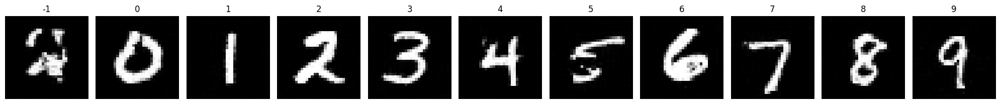

Epoch 206/400
468/468 [==============================] - 68s 146ms/step - loss: 0.0314 - noise_loss: 0.0237 - classifier_loss: 0.8904 - classifier_accuracy: 0.6975 - val_loss: 0.0493 - val_noise_loss: 0.0476 - val_image_loss: 0.1991 - val_classifier_loss: 0.1973 - val_classifier_accuracy: 0.9380 - learning_rate: 0.0024


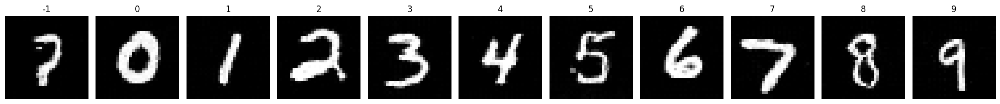

Epoch 207/400
468/468 [==============================] - 72s 154ms/step - loss: 0.0314 - noise_loss: 0.0237 - classifier_loss: 0.8981 - classifier_accuracy: 0.6926 - val_loss: 0.0485 - val_noise_loss: 0.0468 - val_image_loss: 0.2002 - val_classifier_loss: 0.1922 - val_classifier_accuracy: 0.9406 - learning_rate: 0.0024


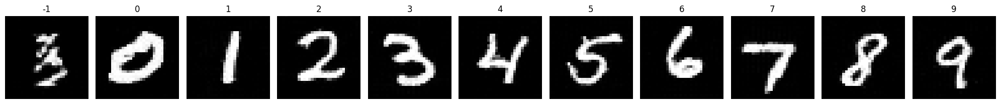

Epoch 208/400
468/468 [==============================] - 88s 189ms/step - loss: 0.0318 - noise_loss: 0.0240 - classifier_loss: 0.9145 - classifier_accuracy: 0.6844 - val_loss: 0.0488 - val_noise_loss: 0.0471 - val_image_loss: 0.1982 - val_classifier_loss: 0.1912 - val_classifier_accuracy: 0.9412 - learning_rate: 0.0023


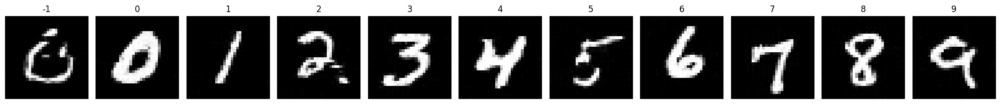

Epoch 209/400
468/468 [==============================] - 84s 178ms/step - loss: 0.0313 - noise_loss: 0.0238 - classifier_loss: 0.8803 - classifier_accuracy: 0.7004 - val_loss: 0.0482 - val_noise_loss: 0.0466 - val_image_loss: 0.1985 - val_classifier_loss: 0.1920 - val_classifier_accuracy: 0.9409 - learning_rate: 0.0023


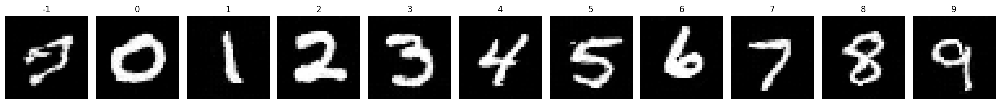

Epoch 210/400
468/468 [==============================] - 82s 174ms/step - loss: 0.0320 - noise_loss: 0.0239 - classifier_loss: 0.9288 - classifier_accuracy: 0.6816 - val_loss: 0.0489 - val_noise_loss: 0.0472 - val_image_loss: 0.1956 - val_classifier_loss: 0.1965 - val_classifier_accuracy: 0.9395 - learning_rate: 0.0023


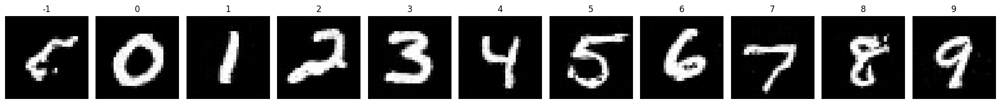

Epoch 211/400
468/468 [==============================] - 80s 171ms/step - loss: 0.0335 - noise_loss: 0.0244 - classifier_loss: 1.0590 - classifier_accuracy: 0.6377 - val_loss: 0.0494 - val_noise_loss: 0.0475 - val_image_loss: 0.2016 - val_classifier_loss: 0.2157 - val_classifier_accuracy: 0.9341 - learning_rate: 0.0023


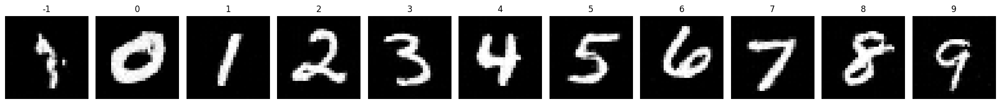

Epoch 212/400
468/468 [==============================] - 67s 143ms/step - loss: 0.0329 - noise_loss: 0.0243 - classifier_loss: 0.9878 - classifier_accuracy: 0.6652 - val_loss: 0.0503 - val_noise_loss: 0.0484 - val_image_loss: 0.1965 - val_classifier_loss: 0.2302 - val_classifier_accuracy: 0.9293 - learning_rate: 0.0023


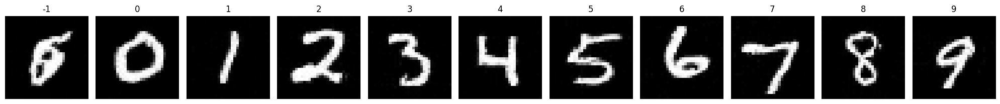

Epoch 213/400
468/468 [==============================] - 62s 132ms/step - loss: 0.0317 - noise_loss: 0.0238 - classifier_loss: 0.9238 - classifier_accuracy: 0.6820 - val_loss: 0.0506 - val_noise_loss: 0.0486 - val_image_loss: 0.2051 - val_classifier_loss: 0.2338 - val_classifier_accuracy: 0.9298 - learning_rate: 0.0022


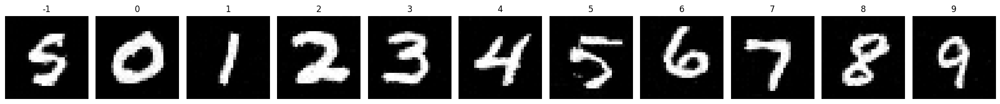

Epoch 214/400
468/468 [==============================] - 62s 132ms/step - loss: 0.0314 - noise_loss: 0.0237 - classifier_loss: 0.8950 - classifier_accuracy: 0.6880 - val_loss: 0.0501 - val_noise_loss: 0.0481 - val_image_loss: 0.2045 - val_classifier_loss: 0.2263 - val_classifier_accuracy: 0.9332 - learning_rate: 0.0022


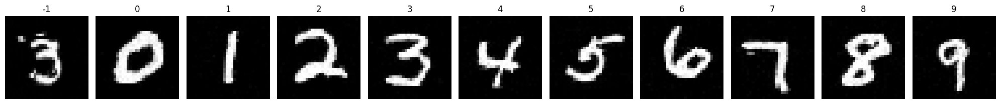

Epoch 215/400
468/468 [==============================] - 62s 133ms/step - loss: 0.0311 - noise_loss: 0.0235 - classifier_loss: 0.8850 - classifier_accuracy: 0.6907 - val_loss: 0.0500 - val_noise_loss: 0.0482 - val_image_loss: 0.2024 - val_classifier_loss: 0.2142 - val_classifier_accuracy: 0.9359 - learning_rate: 0.0022


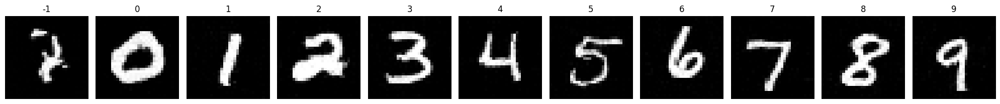

Epoch 216/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0310 - noise_loss: 0.0235 - classifier_loss: 0.8753 - classifier_accuracy: 0.6930 - val_loss: 0.0496 - val_noise_loss: 0.0479 - val_image_loss: 0.2038 - val_classifier_loss: 0.2034 - val_classifier_accuracy: 0.9383 - learning_rate: 0.0022


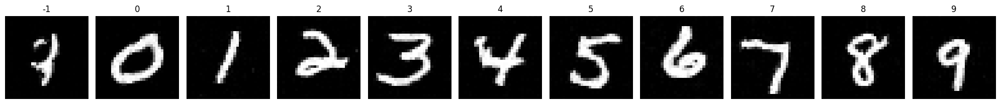

Epoch 217/400
468/468 [==============================] - 62s 132ms/step - loss: 0.0311 - noise_loss: 0.0235 - classifier_loss: 0.8792 - classifier_accuracy: 0.6993 - val_loss: 0.0496 - val_noise_loss: 0.0479 - val_image_loss: 0.1962 - val_classifier_loss: 0.1980 - val_classifier_accuracy: 0.9387 - learning_rate: 0.0022


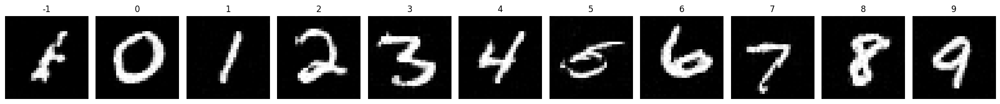

Epoch 218/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0312 - noise_loss: 0.0236 - classifier_loss: 0.8815 - classifier_accuracy: 0.6987 - val_loss: 0.0490 - val_noise_loss: 0.0474 - val_image_loss: 0.2032 - val_classifier_loss: 0.1931 - val_classifier_accuracy: 0.9390 - learning_rate: 0.0021


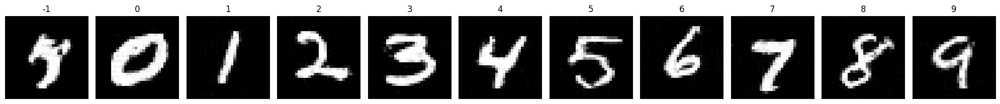

Epoch 219/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0325 - noise_loss: 0.0240 - classifier_loss: 0.9869 - classifier_accuracy: 0.6604 - val_loss: 0.0488 - val_noise_loss: 0.0471 - val_image_loss: 0.1981 - val_classifier_loss: 0.1918 - val_classifier_accuracy: 0.9416 - learning_rate: 0.0021


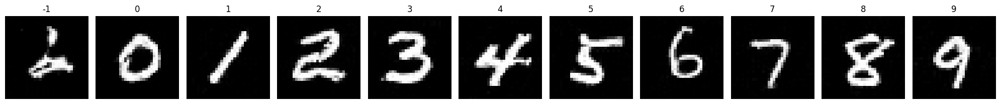

Epoch 220/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0319 - noise_loss: 0.0239 - classifier_loss: 0.9379 - classifier_accuracy: 0.6774 - val_loss: 0.0500 - val_noise_loss: 0.0483 - val_image_loss: 0.2017 - val_classifier_loss: 0.1965 - val_classifier_accuracy: 0.9399 - learning_rate: 0.0021


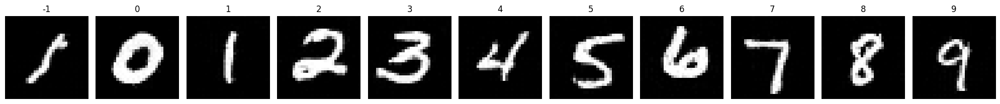

Epoch 221/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0315 - noise_loss: 0.0237 - classifier_loss: 0.8991 - classifier_accuracy: 0.6966 - val_loss: 0.0492 - val_noise_loss: 0.0476 - val_image_loss: 0.1957 - val_classifier_loss: 0.1917 - val_classifier_accuracy: 0.9402 - learning_rate: 0.0021


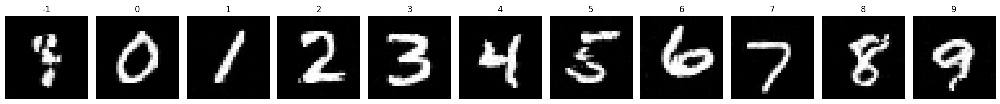

Epoch 222/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0316 - noise_loss: 0.0238 - classifier_loss: 0.9044 - classifier_accuracy: 0.6902 - val_loss: 0.0490 - val_noise_loss: 0.0474 - val_image_loss: 0.1968 - val_classifier_loss: 0.1886 - val_classifier_accuracy: 0.9407 - learning_rate: 0.0021


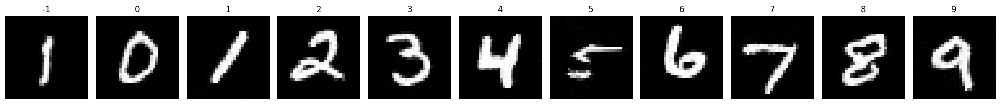

Epoch 223/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0319 - noise_loss: 0.0239 - classifier_loss: 0.9294 - classifier_accuracy: 0.6817 - val_loss: 0.0486 - val_noise_loss: 0.0469 - val_image_loss: 0.1947 - val_classifier_loss: 0.1943 - val_classifier_accuracy: 0.9398 - learning_rate: 0.0021


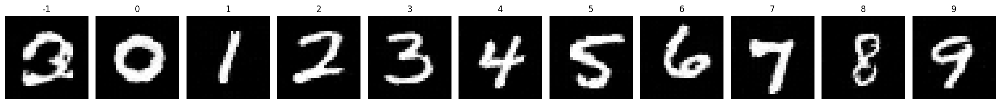

Epoch 224/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0317 - noise_loss: 0.0237 - classifier_loss: 0.9313 - classifier_accuracy: 0.6794 - val_loss: 0.0487 - val_noise_loss: 0.0471 - val_image_loss: 0.1930 - val_classifier_loss: 0.1891 - val_classifier_accuracy: 0.9416 - learning_rate: 0.0020


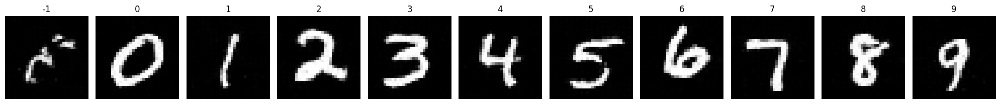

Epoch 225/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0308 - noise_loss: 0.0235 - classifier_loss: 0.8393 - classifier_accuracy: 0.7065 - val_loss: 0.0490 - val_noise_loss: 0.0474 - val_image_loss: 0.1966 - val_classifier_loss: 0.1869 - val_classifier_accuracy: 0.9423 - learning_rate: 0.0020


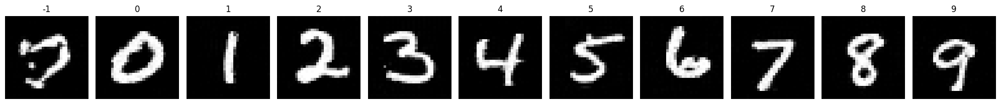

Epoch 226/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0309 - noise_loss: 0.0234 - classifier_loss: 0.8686 - classifier_accuracy: 0.7038 - val_loss: 0.0487 - val_noise_loss: 0.0471 - val_image_loss: 0.2027 - val_classifier_loss: 0.1858 - val_classifier_accuracy: 0.9431 - learning_rate: 0.0020


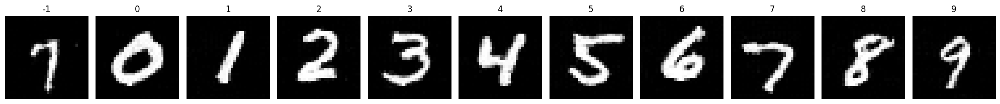

Epoch 227/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0315 - noise_loss: 0.0236 - classifier_loss: 0.9109 - classifier_accuracy: 0.6829 - val_loss: 0.0490 - val_noise_loss: 0.0474 - val_image_loss: 0.1991 - val_classifier_loss: 0.1869 - val_classifier_accuracy: 0.9418 - learning_rate: 0.0020


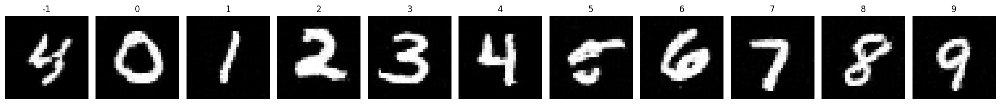

Epoch 228/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0322 - noise_loss: 0.0239 - classifier_loss: 0.9642 - classifier_accuracy: 0.6716 - val_loss: 0.0497 - val_noise_loss: 0.0480 - val_image_loss: 0.1973 - val_classifier_loss: 0.1904 - val_classifier_accuracy: 0.9407 - learning_rate: 0.0020


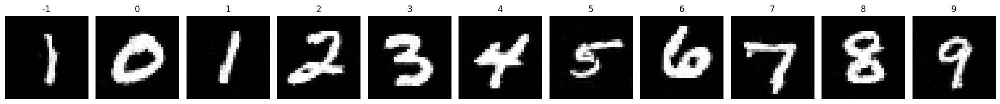

Epoch 229/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0318 - noise_loss: 0.0237 - classifier_loss: 0.9389 - classifier_accuracy: 0.6798 - val_loss: 0.0497 - val_noise_loss: 0.0480 - val_image_loss: 0.1989 - val_classifier_loss: 0.1953 - val_classifier_accuracy: 0.9398 - learning_rate: 0.0019


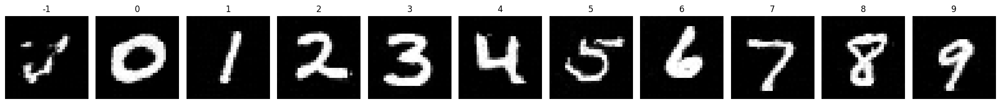

Epoch 230/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0309 - noise_loss: 0.0235 - classifier_loss: 0.8638 - classifier_accuracy: 0.7070 - val_loss: 0.0499 - val_noise_loss: 0.0482 - val_image_loss: 0.1962 - val_classifier_loss: 0.1955 - val_classifier_accuracy: 0.9388 - learning_rate: 0.0019


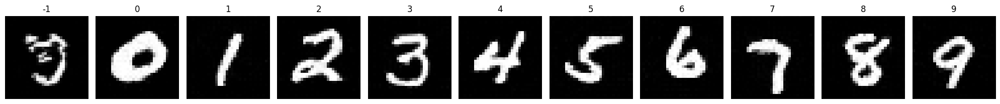

Epoch 231/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0309 - noise_loss: 0.0235 - classifier_loss: 0.8619 - classifier_accuracy: 0.6963 - val_loss: 0.0497 - val_noise_loss: 0.0481 - val_image_loss: 0.1971 - val_classifier_loss: 0.1942 - val_classifier_accuracy: 0.9407 - learning_rate: 0.0019


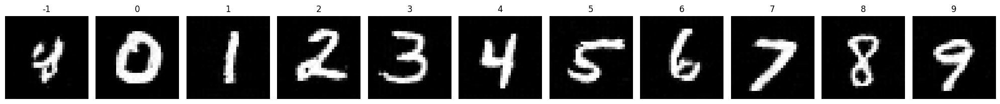

Epoch 232/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0314 - noise_loss: 0.0236 - classifier_loss: 0.9076 - classifier_accuracy: 0.6794 - val_loss: 0.0493 - val_noise_loss: 0.0477 - val_image_loss: 0.2033 - val_classifier_loss: 0.1930 - val_classifier_accuracy: 0.9421 - learning_rate: 0.0019


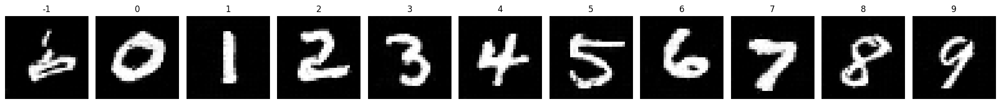

Epoch 233/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0314 - noise_loss: 0.0236 - classifier_loss: 0.9050 - classifier_accuracy: 0.6887 - val_loss: 0.0493 - val_noise_loss: 0.0477 - val_image_loss: 0.1961 - val_classifier_loss: 0.1885 - val_classifier_accuracy: 0.9433 - learning_rate: 0.0019


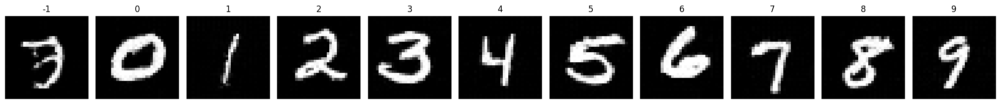

Epoch 234/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0311 - noise_loss: 0.0235 - classifier_loss: 0.8874 - classifier_accuracy: 0.6912 - val_loss: 0.0497 - val_noise_loss: 0.0481 - val_image_loss: 0.1960 - val_classifier_loss: 0.1827 - val_classifier_accuracy: 0.9433 - learning_rate: 0.0018


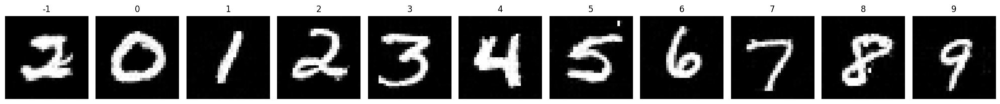

Epoch 235/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0309 - noise_loss: 0.0234 - classifier_loss: 0.8836 - classifier_accuracy: 0.6922 - val_loss: 0.0494 - val_noise_loss: 0.0479 - val_image_loss: 0.1997 - val_classifier_loss: 0.1759 - val_classifier_accuracy: 0.9465 - learning_rate: 0.0018


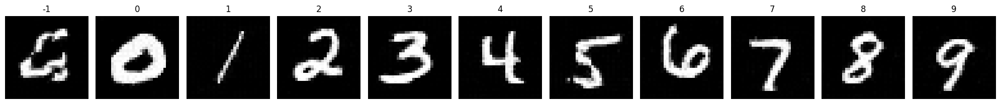

Epoch 236/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0307 - noise_loss: 0.0235 - classifier_loss: 0.8414 - classifier_accuracy: 0.7114 - val_loss: 0.0493 - val_noise_loss: 0.0478 - val_image_loss: 0.1968 - val_classifier_loss: 0.1738 - val_classifier_accuracy: 0.9470 - learning_rate: 0.0018


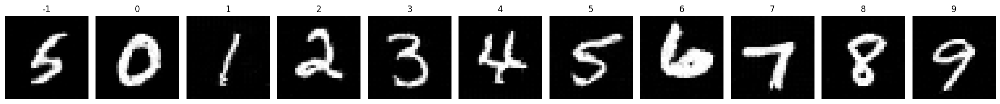

Epoch 237/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0307 - noise_loss: 0.0234 - classifier_loss: 0.8579 - classifier_accuracy: 0.7018 - val_loss: 0.0495 - val_noise_loss: 0.0480 - val_image_loss: 0.1894 - val_classifier_loss: 0.1700 - val_classifier_accuracy: 0.9485 - learning_rate: 0.0018


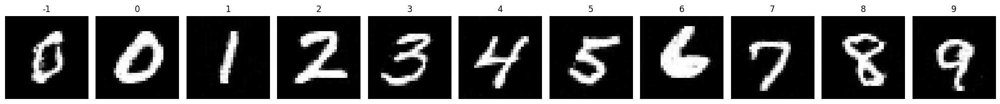

Epoch 238/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0307 - noise_loss: 0.0234 - classifier_loss: 0.8480 - classifier_accuracy: 0.7045 - val_loss: 0.0487 - val_noise_loss: 0.0473 - val_image_loss: 0.1973 - val_classifier_loss: 0.1671 - val_classifier_accuracy: 0.9486 - learning_rate: 0.0018


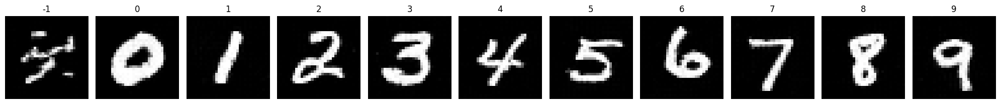

Epoch 239/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0311 - noise_loss: 0.0235 - classifier_loss: 0.8903 - classifier_accuracy: 0.6928 - val_loss: 0.0487 - val_noise_loss: 0.0473 - val_image_loss: 0.1978 - val_classifier_loss: 0.1661 - val_classifier_accuracy: 0.9492 - learning_rate: 0.0017


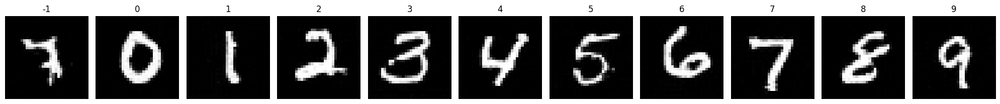

Epoch 240/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0312 - noise_loss: 0.0235 - classifier_loss: 0.8876 - classifier_accuracy: 0.6931 - val_loss: 0.0496 - val_noise_loss: 0.0481 - val_image_loss: 0.1918 - val_classifier_loss: 0.1717 - val_classifier_accuracy: 0.9497 - learning_rate: 0.0017


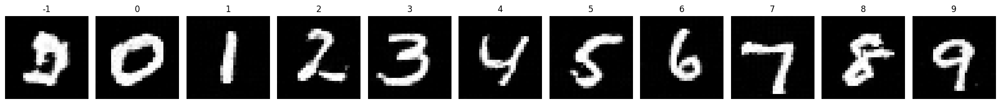

Epoch 241/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0318 - noise_loss: 0.0238 - classifier_loss: 0.9317 - classifier_accuracy: 0.6767 - val_loss: 0.0489 - val_noise_loss: 0.0473 - val_image_loss: 0.1920 - val_classifier_loss: 0.1798 - val_classifier_accuracy: 0.9464 - learning_rate: 0.0017


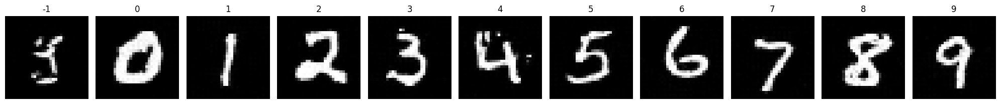

Epoch 242/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0309 - noise_loss: 0.0234 - classifier_loss: 0.8669 - classifier_accuracy: 0.6989 - val_loss: 0.0489 - val_noise_loss: 0.0473 - val_image_loss: 0.1968 - val_classifier_loss: 0.1813 - val_classifier_accuracy: 0.9461 - learning_rate: 0.0017


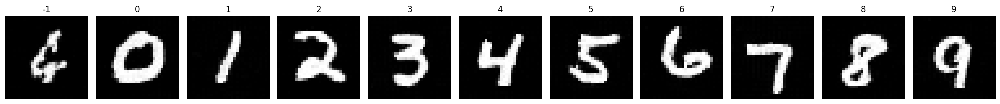

Epoch 243/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0308 - noise_loss: 0.0234 - classifier_loss: 0.8661 - classifier_accuracy: 0.6951 - val_loss: 0.0492 - val_noise_loss: 0.0477 - val_image_loss: 0.1952 - val_classifier_loss: 0.1783 - val_classifier_accuracy: 0.9468 - learning_rate: 0.0017


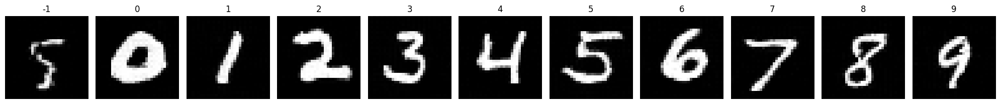

Epoch 244/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0303 - noise_loss: 0.0232 - classifier_loss: 0.8298 - classifier_accuracy: 0.7093 - val_loss: 0.0493 - val_noise_loss: 0.0478 - val_image_loss: 0.1987 - val_classifier_loss: 0.1739 - val_classifier_accuracy: 0.9480 - learning_rate: 0.0017


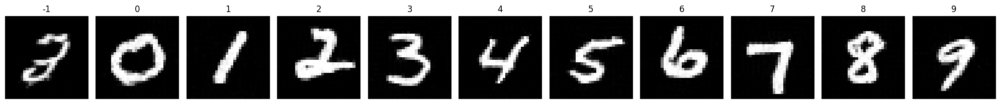

Epoch 245/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0304 - noise_loss: 0.0233 - classifier_loss: 0.8258 - classifier_accuracy: 0.7122 - val_loss: 0.0484 - val_noise_loss: 0.0470 - val_image_loss: 0.1970 - val_classifier_loss: 0.1689 - val_classifier_accuracy: 0.9498 - learning_rate: 0.0016


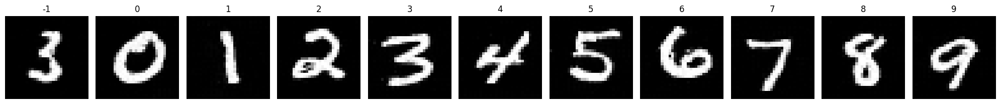

Epoch 246/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0306 - noise_loss: 0.0233 - classifier_loss: 0.8463 - classifier_accuracy: 0.7042 - val_loss: 0.0483 - val_noise_loss: 0.0469 - val_image_loss: 0.1980 - val_classifier_loss: 0.1640 - val_classifier_accuracy: 0.9498 - learning_rate: 0.0016


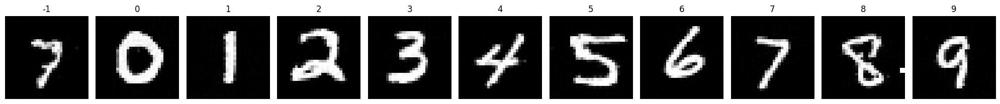

Epoch 247/400
468/468 [==============================] - 61s 131ms/step - loss: 0.0305 - noise_loss: 0.0233 - classifier_loss: 0.8478 - classifier_accuracy: 0.7083 - val_loss: 0.0487 - val_noise_loss: 0.0474 - val_image_loss: 0.1936 - val_classifier_loss: 0.1601 - val_classifier_accuracy: 0.9505 - learning_rate: 0.0016


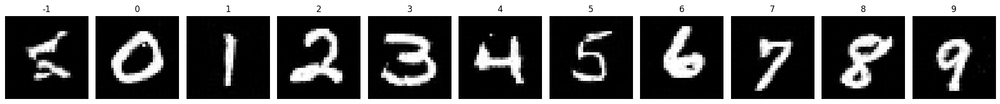

Epoch 248/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0304 - noise_loss: 0.0233 - classifier_loss: 0.8366 - classifier_accuracy: 0.7144 - val_loss: 0.0482 - val_noise_loss: 0.0468 - val_image_loss: 0.1952 - val_classifier_loss: 0.1573 - val_classifier_accuracy: 0.9514 - learning_rate: 0.0016


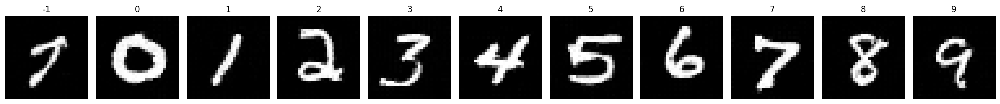

Epoch 249/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0306 - noise_loss: 0.0233 - classifier_loss: 0.8398 - classifier_accuracy: 0.7121 - val_loss: 0.0483 - val_noise_loss: 0.0470 - val_image_loss: 0.1953 - val_classifier_loss: 0.1562 - val_classifier_accuracy: 0.9521 - learning_rate: 0.0016


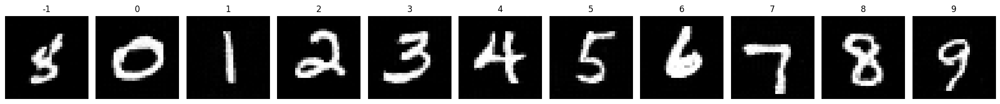

Epoch 250/400
468/468 [==============================] - 62s 131ms/step - loss: 0.0305 - noise_loss: 0.0232 - classifier_loss: 0.8429 - classifier_accuracy: 0.7101 - val_loss: 0.0486 - val_noise_loss: 0.0473 - val_image_loss: 0.1922 - val_classifier_loss: 0.1556 - val_classifier_accuracy: 0.9534 - learning_rate: 0.0015


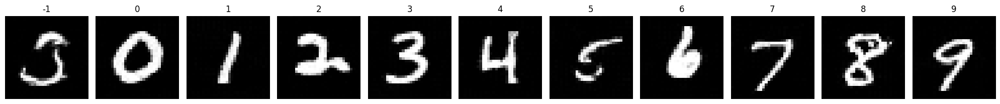

Epoch 251/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0305 - noise_loss: 0.0232 - classifier_loss: 0.8540 - classifier_accuracy: 0.7074 - val_loss: 0.0482 - val_noise_loss: 0.0469 - val_image_loss: 0.1914 - val_classifier_loss: 0.1559 - val_classifier_accuracy: 0.9524 - learning_rate: 0.0015


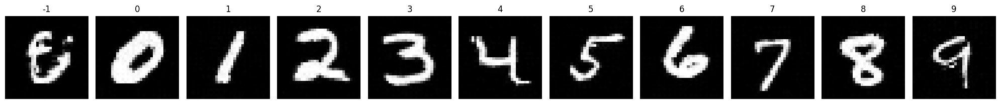

Epoch 252/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0308 - noise_loss: 0.0233 - classifier_loss: 0.8685 - classifier_accuracy: 0.6988 - val_loss: 0.0477 - val_noise_loss: 0.0464 - val_image_loss: 0.1921 - val_classifier_loss: 0.1587 - val_classifier_accuracy: 0.9508 - learning_rate: 0.0015


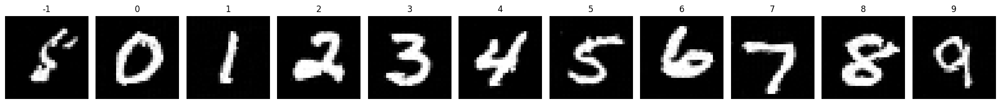

Epoch 253/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0306 - noise_loss: 0.0232 - classifier_loss: 0.8492 - classifier_accuracy: 0.7122 - val_loss: 0.0486 - val_noise_loss: 0.0472 - val_image_loss: 0.1909 - val_classifier_loss: 0.1574 - val_classifier_accuracy: 0.9507 - learning_rate: 0.0015


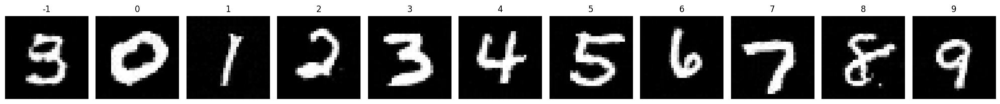

Epoch 254/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0303 - noise_loss: 0.0231 - classifier_loss: 0.8360 - classifier_accuracy: 0.7159 - val_loss: 0.0480 - val_noise_loss: 0.0466 - val_image_loss: 0.1932 - val_classifier_loss: 0.1585 - val_classifier_accuracy: 0.9507 - learning_rate: 0.0015


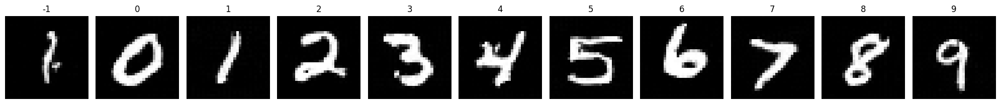

Epoch 255/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0302 - noise_loss: 0.0232 - classifier_loss: 0.8090 - classifier_accuracy: 0.7187 - val_loss: 0.0481 - val_noise_loss: 0.0468 - val_image_loss: 0.1966 - val_classifier_loss: 0.1556 - val_classifier_accuracy: 0.9509 - learning_rate: 0.0015


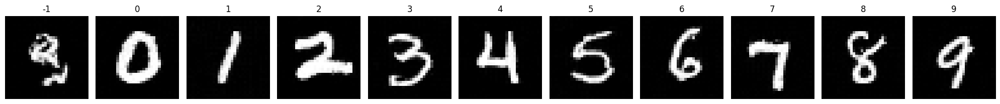

Epoch 256/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0302 - noise_loss: 0.0232 - classifier_loss: 0.8192 - classifier_accuracy: 0.7132 - val_loss: 0.0485 - val_noise_loss: 0.0472 - val_image_loss: 0.1924 - val_classifier_loss: 0.1529 - val_classifier_accuracy: 0.9532 - learning_rate: 0.0014


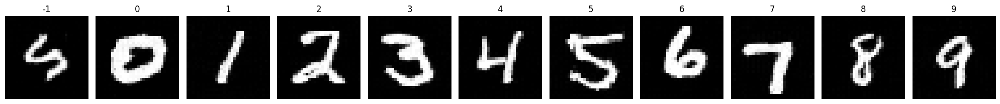

Epoch 257/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0301 - noise_loss: 0.0232 - classifier_loss: 0.8049 - classifier_accuracy: 0.7225 - val_loss: 0.0481 - val_noise_loss: 0.0468 - val_image_loss: 0.1983 - val_classifier_loss: 0.1514 - val_classifier_accuracy: 0.9530 - learning_rate: 0.0014


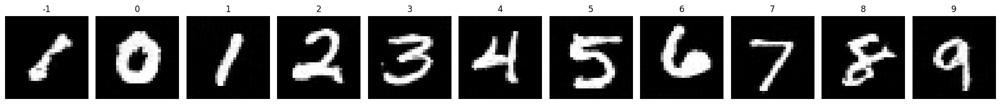

Epoch 258/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0302 - noise_loss: 0.0231 - classifier_loss: 0.8311 - classifier_accuracy: 0.7159 - val_loss: 0.0479 - val_noise_loss: 0.0466 - val_image_loss: 0.1949 - val_classifier_loss: 0.1510 - val_classifier_accuracy: 0.9528 - learning_rate: 0.0014


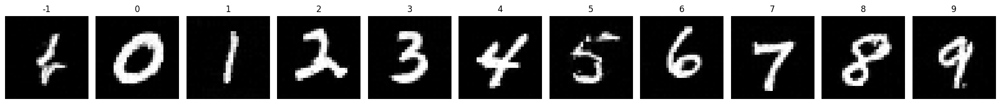

Epoch 259/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0301 - noise_loss: 0.0231 - classifier_loss: 0.8241 - classifier_accuracy: 0.7147 - val_loss: 0.0479 - val_noise_loss: 0.0466 - val_image_loss: 0.1960 - val_classifier_loss: 0.1504 - val_classifier_accuracy: 0.9526 - learning_rate: 0.0014


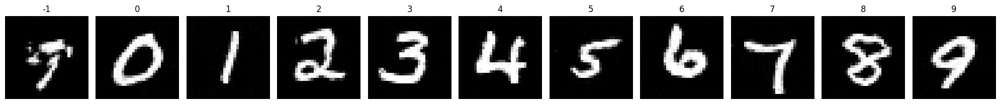

Epoch 260/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0303 - noise_loss: 0.0231 - classifier_loss: 0.8384 - classifier_accuracy: 0.7089 - val_loss: 0.0479 - val_noise_loss: 0.0466 - val_image_loss: 0.1948 - val_classifier_loss: 0.1511 - val_classifier_accuracy: 0.9542 - learning_rate: 0.0014


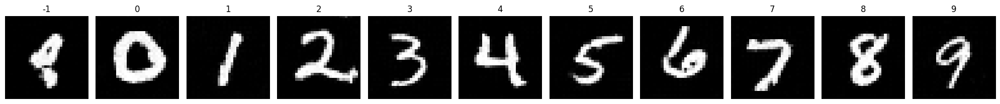

Epoch 261/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0304 - noise_loss: 0.0231 - classifier_loss: 0.8498 - classifier_accuracy: 0.7091 - val_loss: 0.0481 - val_noise_loss: 0.0468 - val_image_loss: 0.1931 - val_classifier_loss: 0.1525 - val_classifier_accuracy: 0.9525 - learning_rate: 0.0013


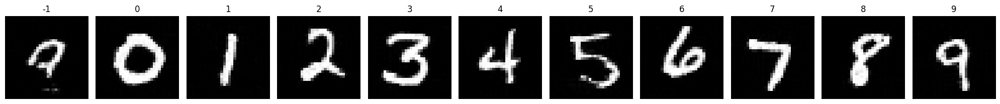

Epoch 262/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0231 - classifier_loss: 0.8073 - classifier_accuracy: 0.7288 - val_loss: 0.0483 - val_noise_loss: 0.0470 - val_image_loss: 0.1973 - val_classifier_loss: 0.1524 - val_classifier_accuracy: 0.9538 - learning_rate: 0.0013


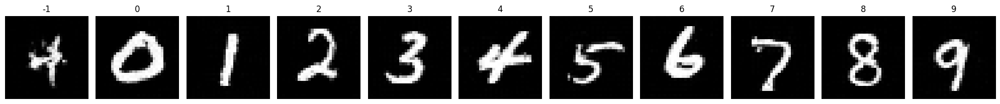

Epoch 263/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0300 - noise_loss: 0.0230 - classifier_loss: 0.8122 - classifier_accuracy: 0.7168 - val_loss: 0.0484 - val_noise_loss: 0.0471 - val_image_loss: 0.1943 - val_classifier_loss: 0.1476 - val_classifier_accuracy: 0.9540 - learning_rate: 0.0013


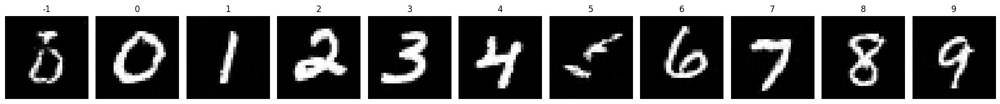

Epoch 264/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0302 - noise_loss: 0.0231 - classifier_loss: 0.8180 - classifier_accuracy: 0.7126 - val_loss: 0.0481 - val_noise_loss: 0.0469 - val_image_loss: 0.1940 - val_classifier_loss: 0.1437 - val_classifier_accuracy: 0.9558 - learning_rate: 0.0013


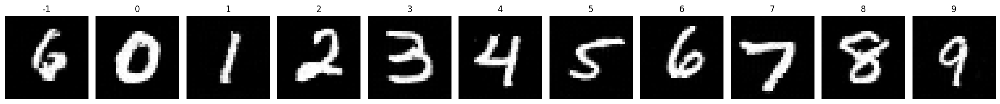

Epoch 265/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0229 - classifier_loss: 0.8284 - classifier_accuracy: 0.7269 - val_loss: 0.0481 - val_noise_loss: 0.0469 - val_image_loss: 0.1939 - val_classifier_loss: 0.1441 - val_classifier_accuracy: 0.9551 - learning_rate: 0.0013


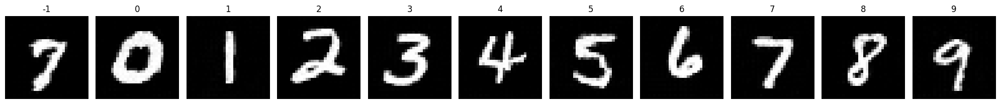

Epoch 266/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0231 - classifier_loss: 0.8079 - classifier_accuracy: 0.7188 - val_loss: 0.0481 - val_noise_loss: 0.0468 - val_image_loss: 0.1989 - val_classifier_loss: 0.1435 - val_classifier_accuracy: 0.9557 - learning_rate: 0.0013


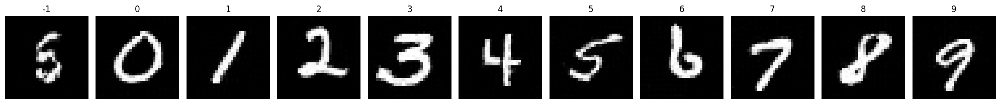

Epoch 267/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0299 - noise_loss: 0.0229 - classifier_loss: 0.8192 - classifier_accuracy: 0.7136 - val_loss: 0.0484 - val_noise_loss: 0.0471 - val_image_loss: 0.1965 - val_classifier_loss: 0.1446 - val_classifier_accuracy: 0.9550 - learning_rate: 0.0012


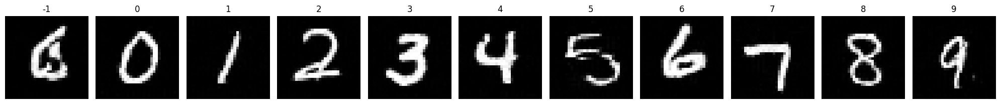

Epoch 268/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0297 - noise_loss: 0.0229 - classifier_loss: 0.7928 - classifier_accuracy: 0.7262 - val_loss: 0.0479 - val_noise_loss: 0.0466 - val_image_loss: 0.1883 - val_classifier_loss: 0.1463 - val_classifier_accuracy: 0.9546 - learning_rate: 0.0012


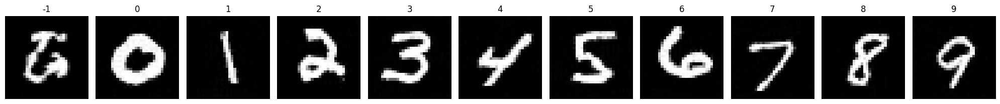

Epoch 269/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0307 - noise_loss: 0.0232 - classifier_loss: 0.8624 - classifier_accuracy: 0.6988 - val_loss: 0.0485 - val_noise_loss: 0.0473 - val_image_loss: 0.1889 - val_classifier_loss: 0.1467 - val_classifier_accuracy: 0.9547 - learning_rate: 0.0012


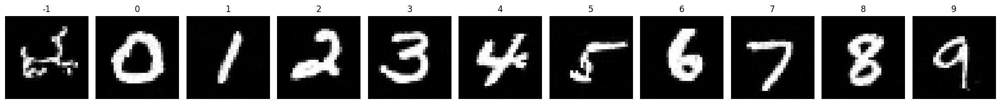

Epoch 270/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0301 - noise_loss: 0.0231 - classifier_loss: 0.8200 - classifier_accuracy: 0.7174 - val_loss: 0.0483 - val_noise_loss: 0.0470 - val_image_loss: 0.1917 - val_classifier_loss: 0.1495 - val_classifier_accuracy: 0.9529 - learning_rate: 0.0012


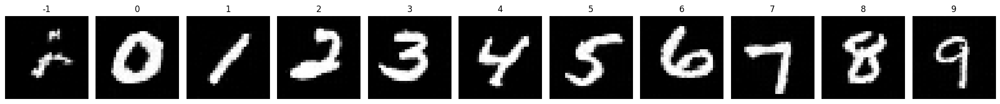

Epoch 271/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0301 - noise_loss: 0.0231 - classifier_loss: 0.8185 - classifier_accuracy: 0.7140 - val_loss: 0.0487 - val_noise_loss: 0.0475 - val_image_loss: 0.1912 - val_classifier_loss: 0.1498 - val_classifier_accuracy: 0.9525 - learning_rate: 0.0012


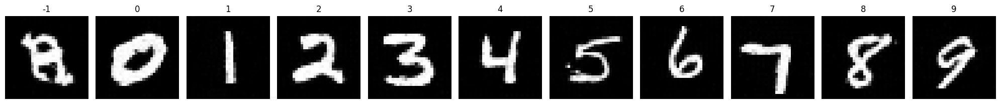

Epoch 272/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0230 - classifier_loss: 0.8135 - classifier_accuracy: 0.7210 - val_loss: 0.0492 - val_noise_loss: 0.0480 - val_image_loss: 0.1891 - val_classifier_loss: 0.1458 - val_classifier_accuracy: 0.9537 - learning_rate: 0.0012


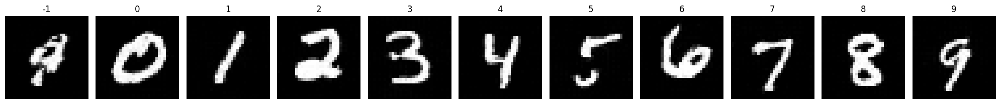

Epoch 273/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0301 - noise_loss: 0.0230 - classifier_loss: 0.8185 - classifier_accuracy: 0.7179 - val_loss: 0.0486 - val_noise_loss: 0.0474 - val_image_loss: 0.1969 - val_classifier_loss: 0.1440 - val_classifier_accuracy: 0.9556 - learning_rate: 0.0011


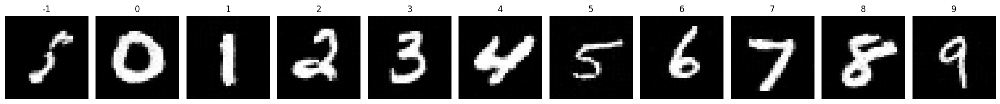

Epoch 274/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0299 - noise_loss: 0.0230 - classifier_loss: 0.7959 - classifier_accuracy: 0.7208 - val_loss: 0.0493 - val_noise_loss: 0.0481 - val_image_loss: 0.1937 - val_classifier_loss: 0.1424 - val_classifier_accuracy: 0.9555 - learning_rate: 0.0011


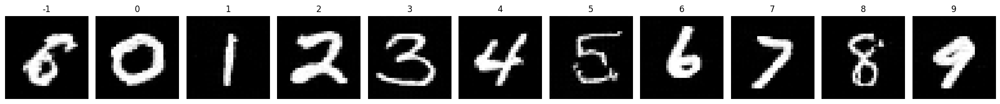

Epoch 275/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0302 - noise_loss: 0.0230 - classifier_loss: 0.8358 - classifier_accuracy: 0.7177 - val_loss: 0.0485 - val_noise_loss: 0.0473 - val_image_loss: 0.1949 - val_classifier_loss: 0.1422 - val_classifier_accuracy: 0.9560 - learning_rate: 0.0011


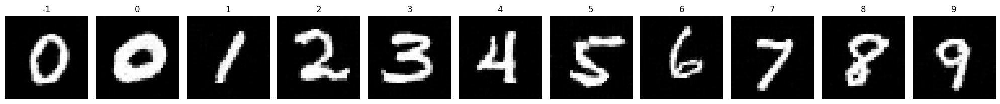

Epoch 276/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0297 - noise_loss: 0.0229 - classifier_loss: 0.7951 - classifier_accuracy: 0.7211 - val_loss: 0.0482 - val_noise_loss: 0.0470 - val_image_loss: 0.1957 - val_classifier_loss: 0.1398 - val_classifier_accuracy: 0.9563 - learning_rate: 0.0011


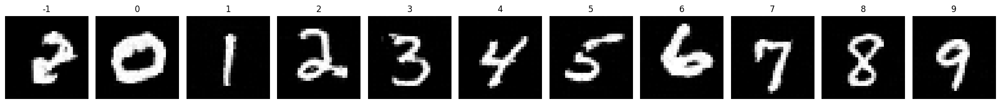

Epoch 277/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0298 - noise_loss: 0.0231 - classifier_loss: 0.7748 - classifier_accuracy: 0.7386 - val_loss: 0.0488 - val_noise_loss: 0.0476 - val_image_loss: 0.2002 - val_classifier_loss: 0.1393 - val_classifier_accuracy: 0.9571 - learning_rate: 0.0011


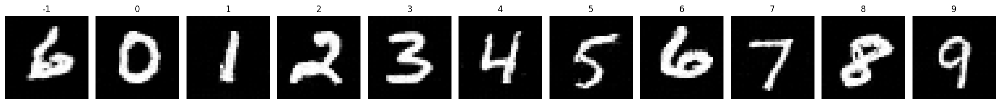

Epoch 278/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0303 - noise_loss: 0.0231 - classifier_loss: 0.8282 - classifier_accuracy: 0.7116 - val_loss: 0.0485 - val_noise_loss: 0.0472 - val_image_loss: 0.1963 - val_classifier_loss: 0.1441 - val_classifier_accuracy: 0.9550 - learning_rate: 0.0011


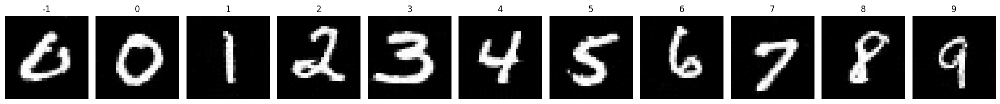

Epoch 279/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0229 - classifier_loss: 0.8246 - classifier_accuracy: 0.7188 - val_loss: 0.0479 - val_noise_loss: 0.0467 - val_image_loss: 0.1988 - val_classifier_loss: 0.1472 - val_classifier_accuracy: 0.9539 - learning_rate: 0.0010


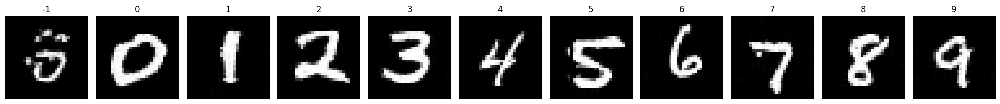

Epoch 280/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0297 - noise_loss: 0.0229 - classifier_loss: 0.7785 - classifier_accuracy: 0.7323 - val_loss: 0.0484 - val_noise_loss: 0.0471 - val_image_loss: 0.1959 - val_classifier_loss: 0.1442 - val_classifier_accuracy: 0.9554 - learning_rate: 0.0010


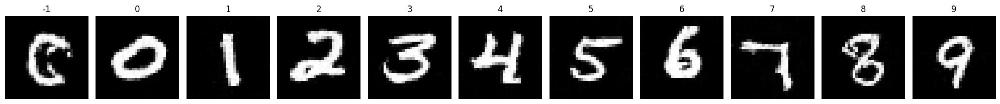

Epoch 281/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0295 - noise_loss: 0.0227 - classifier_loss: 0.7792 - classifier_accuracy: 0.7384 - val_loss: 0.0486 - val_noise_loss: 0.0473 - val_image_loss: 0.1995 - val_classifier_loss: 0.1418 - val_classifier_accuracy: 0.9570 - learning_rate: 0.0010


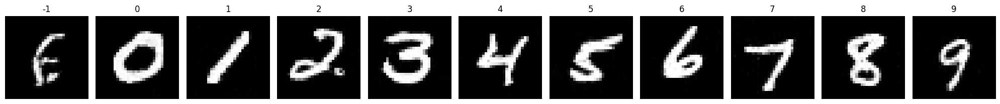

Epoch 282/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0301 - noise_loss: 0.0230 - classifier_loss: 0.8269 - classifier_accuracy: 0.7226 - val_loss: 0.0483 - val_noise_loss: 0.0471 - val_image_loss: 0.1988 - val_classifier_loss: 0.1378 - val_classifier_accuracy: 0.9574 - learning_rate: 9.9895e-04


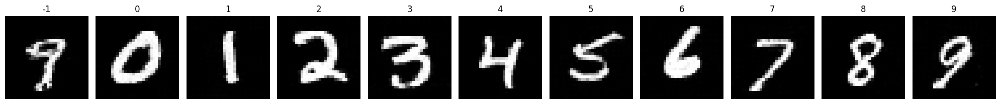

Epoch 283/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0296 - noise_loss: 0.0229 - classifier_loss: 0.7754 - classifier_accuracy: 0.7361 - val_loss: 0.0482 - val_noise_loss: 0.0470 - val_image_loss: 0.1973 - val_classifier_loss: 0.1356 - val_classifier_accuracy: 0.9581 - learning_rate: 9.8329e-04


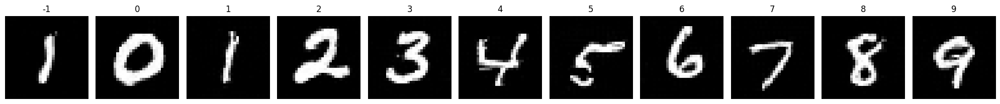

Epoch 284/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0298 - noise_loss: 0.0228 - classifier_loss: 0.8076 - classifier_accuracy: 0.7188 - val_loss: 0.0481 - val_noise_loss: 0.0469 - val_image_loss: 0.1971 - val_classifier_loss: 0.1336 - val_classifier_accuracy: 0.9584 - learning_rate: 9.6773e-04


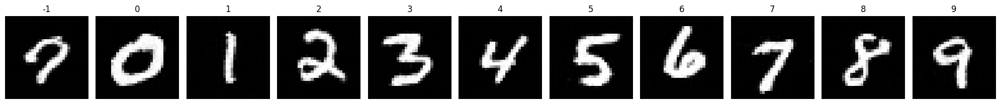

Epoch 285/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7772 - classifier_accuracy: 0.7328 - val_loss: 0.0480 - val_noise_loss: 0.0469 - val_image_loss: 0.1957 - val_classifier_loss: 0.1335 - val_classifier_accuracy: 0.9592 - learning_rate: 9.5227e-04


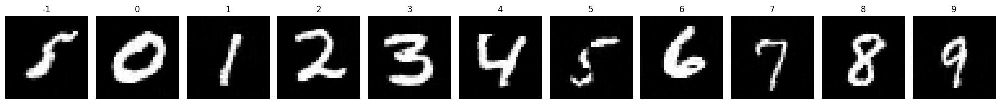

Epoch 286/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0296 - noise_loss: 0.0228 - classifier_loss: 0.7891 - classifier_accuracy: 0.7322 - val_loss: 0.0483 - val_noise_loss: 0.0471 - val_image_loss: 0.1946 - val_classifier_loss: 0.1304 - val_classifier_accuracy: 0.9597 - learning_rate: 9.3689e-04


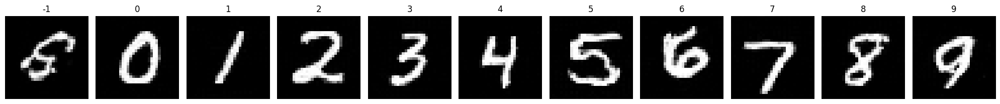

Epoch 287/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0296 - noise_loss: 0.0228 - classifier_loss: 0.7952 - classifier_accuracy: 0.7268 - val_loss: 0.0480 - val_noise_loss: 0.0469 - val_image_loss: 0.1979 - val_classifier_loss: 0.1279 - val_classifier_accuracy: 0.9610 - learning_rate: 9.2162e-04


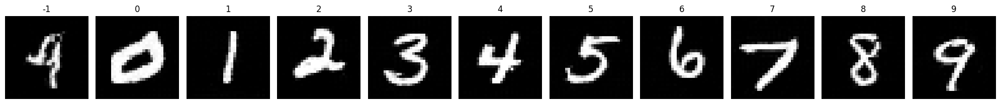

Epoch 288/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7828 - classifier_accuracy: 0.7309 - val_loss: 0.0491 - val_noise_loss: 0.0480 - val_image_loss: 0.1906 - val_classifier_loss: 0.1283 - val_classifier_accuracy: 0.9603 - learning_rate: 9.0644e-04


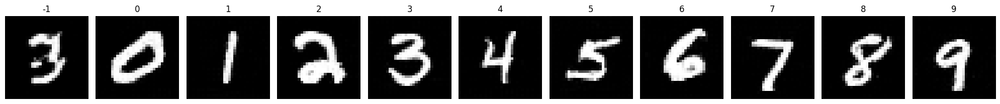

Epoch 289/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0298 - noise_loss: 0.0228 - classifier_loss: 0.8074 - classifier_accuracy: 0.7199 - val_loss: 0.0485 - val_noise_loss: 0.0474 - val_image_loss: 0.1886 - val_classifier_loss: 0.1289 - val_classifier_accuracy: 0.9602 - learning_rate: 8.9136e-04


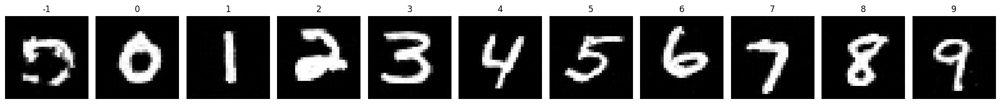

Epoch 290/400
468/468 [==============================] - 64s 136ms/step - loss: 0.0295 - noise_loss: 0.0229 - classifier_loss: 0.7669 - classifier_accuracy: 0.7379 - val_loss: 0.0484 - val_noise_loss: 0.0473 - val_image_loss: 0.1990 - val_classifier_loss: 0.1299 - val_classifier_accuracy: 0.9598 - learning_rate: 8.7638e-04


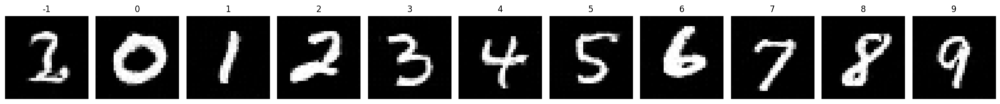

Epoch 291/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0299 - noise_loss: 0.0229 - classifier_loss: 0.8051 - classifier_accuracy: 0.7166 - val_loss: 0.0485 - val_noise_loss: 0.0474 - val_image_loss: 0.1946 - val_classifier_loss: 0.1278 - val_classifier_accuracy: 0.9595 - learning_rate: 8.6150e-04


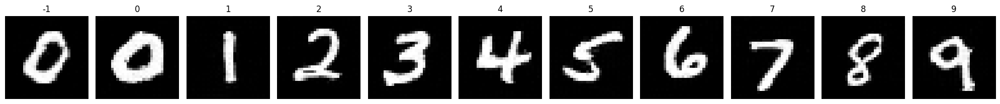

Epoch 292/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0297 - noise_loss: 0.0229 - classifier_loss: 0.7862 - classifier_accuracy: 0.7271 - val_loss: 0.0482 - val_noise_loss: 0.0471 - val_image_loss: 0.1945 - val_classifier_loss: 0.1276 - val_classifier_accuracy: 0.9607 - learning_rate: 8.4672e-04


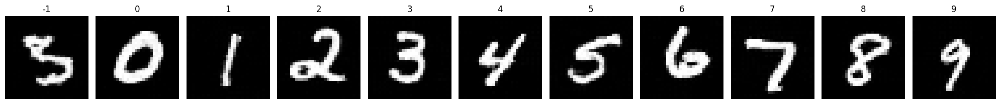

Epoch 293/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0293 - noise_loss: 0.0226 - classifier_loss: 0.7731 - classifier_accuracy: 0.7359 - val_loss: 0.0485 - val_noise_loss: 0.0474 - val_image_loss: 0.1863 - val_classifier_loss: 0.1287 - val_classifier_accuracy: 0.9601 - learning_rate: 8.3204e-04


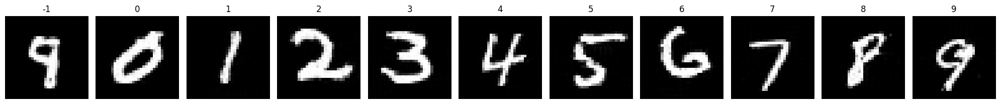

Epoch 294/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0228 - classifier_loss: 0.7390 - classifier_accuracy: 0.7450 - val_loss: 0.0481 - val_noise_loss: 0.0470 - val_image_loss: 0.1943 - val_classifier_loss: 0.1268 - val_classifier_accuracy: 0.9605 - learning_rate: 8.1747e-04


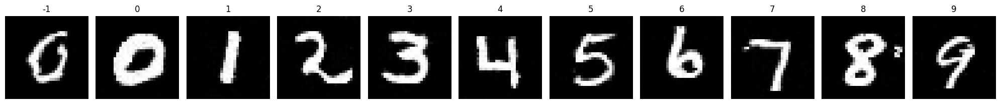

Epoch 295/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0227 - classifier_loss: 0.7612 - classifier_accuracy: 0.7382 - val_loss: 0.0486 - val_noise_loss: 0.0475 - val_image_loss: 0.1930 - val_classifier_loss: 0.1267 - val_classifier_accuracy: 0.9599 - learning_rate: 8.0300e-04


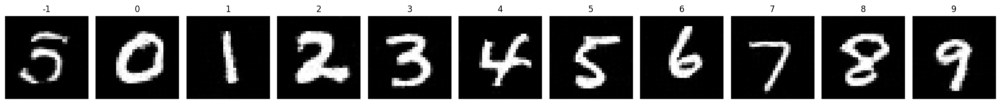

Epoch 296/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0301 - noise_loss: 0.0230 - classifier_loss: 0.8194 - classifier_accuracy: 0.7171 - val_loss: 0.0487 - val_noise_loss: 0.0476 - val_image_loss: 0.1925 - val_classifier_loss: 0.1284 - val_classifier_accuracy: 0.9586 - learning_rate: 7.8863e-04


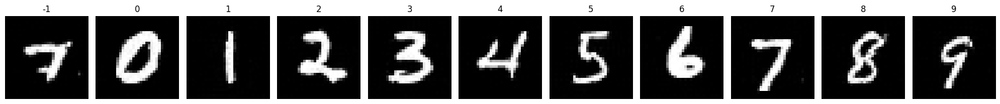

Epoch 297/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0300 - noise_loss: 0.0229 - classifier_loss: 0.8232 - classifier_accuracy: 0.7113 - val_loss: 0.0501 - val_noise_loss: 0.0490 - val_image_loss: 0.1944 - val_classifier_loss: 0.1359 - val_classifier_accuracy: 0.9572 - learning_rate: 7.7437e-04


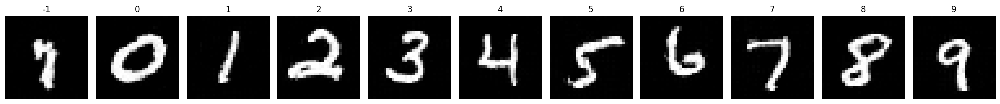

Epoch 298/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0297 - noise_loss: 0.0228 - classifier_loss: 0.7991 - classifier_accuracy: 0.7246 - val_loss: 0.0500 - val_noise_loss: 0.0489 - val_image_loss: 0.1952 - val_classifier_loss: 0.1358 - val_classifier_accuracy: 0.9569 - learning_rate: 7.6022e-04


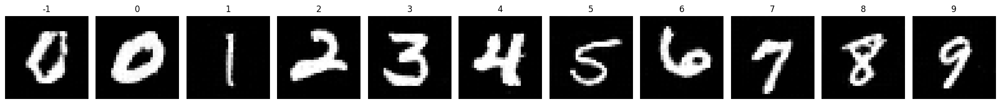

Epoch 299/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0294 - noise_loss: 0.0228 - classifier_loss: 0.7693 - classifier_accuracy: 0.7342 - val_loss: 0.0498 - val_noise_loss: 0.0487 - val_image_loss: 0.1939 - val_classifier_loss: 0.1327 - val_classifier_accuracy: 0.9570 - learning_rate: 7.4617e-04


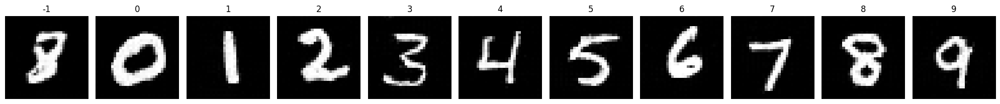

Epoch 300/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0293 - noise_loss: 0.0227 - classifier_loss: 0.7714 - classifier_accuracy: 0.7319 - val_loss: 0.0498 - val_noise_loss: 0.0486 - val_image_loss: 0.1899 - val_classifier_loss: 0.1311 - val_classifier_accuracy: 0.9590 - learning_rate: 7.3223e-04


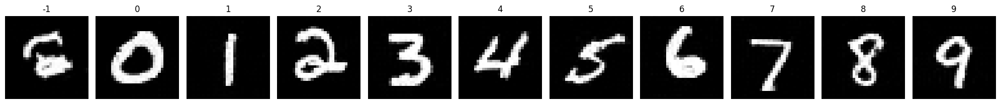

Epoch 301/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7941 - classifier_accuracy: 0.7237 - val_loss: 0.0495 - val_noise_loss: 0.0484 - val_image_loss: 0.1979 - val_classifier_loss: 0.1332 - val_classifier_accuracy: 0.9583 - learning_rate: 7.1840e-04


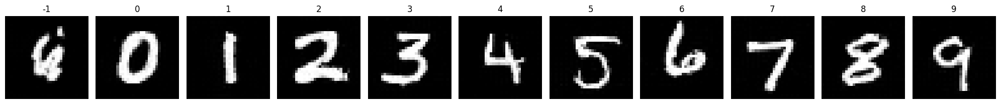

Epoch 302/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0297 - noise_loss: 0.0228 - classifier_loss: 0.8045 - classifier_accuracy: 0.7226 - val_loss: 0.0496 - val_noise_loss: 0.0484 - val_image_loss: 0.1982 - val_classifier_loss: 0.1352 - val_classifier_accuracy: 0.9581 - learning_rate: 7.0468e-04


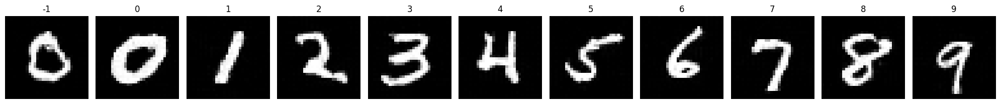

Epoch 303/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0295 - noise_loss: 0.0227 - classifier_loss: 0.7841 - classifier_accuracy: 0.7379 - val_loss: 0.0498 - val_noise_loss: 0.0487 - val_image_loss: 0.2029 - val_classifier_loss: 0.1347 - val_classifier_accuracy: 0.9593 - learning_rate: 6.9108e-04


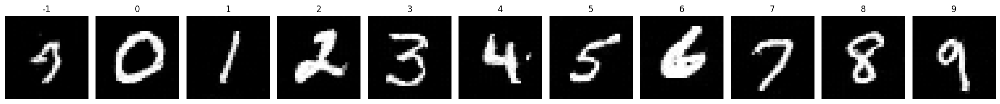

Epoch 304/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0294 - noise_loss: 0.0227 - classifier_loss: 0.7651 - classifier_accuracy: 0.7364 - val_loss: 0.0496 - val_noise_loss: 0.0485 - val_image_loss: 0.1992 - val_classifier_loss: 0.1341 - val_classifier_accuracy: 0.9589 - learning_rate: 6.7758e-04


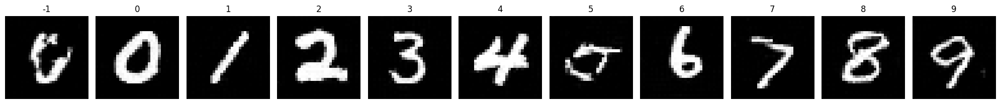

Epoch 305/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7913 - classifier_accuracy: 0.7322 - val_loss: 0.0497 - val_noise_loss: 0.0485 - val_image_loss: 0.2003 - val_classifier_loss: 0.1350 - val_classifier_accuracy: 0.9587 - learning_rate: 6.6419e-04


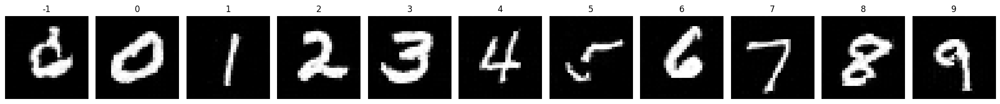

Epoch 306/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0294 - noise_loss: 0.0227 - classifier_loss: 0.7828 - classifier_accuracy: 0.7285 - val_loss: 0.0503 - val_noise_loss: 0.0491 - val_image_loss: 0.1994 - val_classifier_loss: 0.1358 - val_classifier_accuracy: 0.9577 - learning_rate: 6.5092e-04


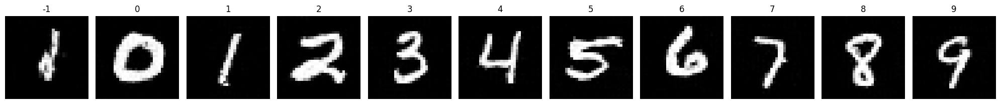

Epoch 307/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7751 - classifier_accuracy: 0.7314 - val_loss: 0.0495 - val_noise_loss: 0.0484 - val_image_loss: 0.1981 - val_classifier_loss: 0.1339 - val_classifier_accuracy: 0.9593 - learning_rate: 6.3776e-04


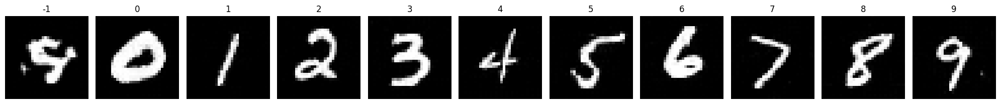

Epoch 308/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7855 - classifier_accuracy: 0.7313 - val_loss: 0.0496 - val_noise_loss: 0.0484 - val_image_loss: 0.2014 - val_classifier_loss: 0.1331 - val_classifier_accuracy: 0.9590 - learning_rate: 6.2472e-04


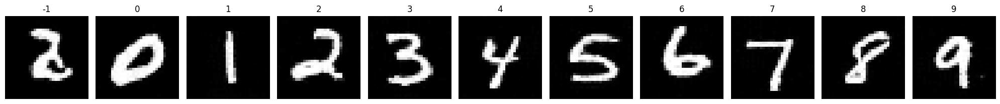

Epoch 309/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0294 - noise_loss: 0.0226 - classifier_loss: 0.7880 - classifier_accuracy: 0.7292 - val_loss: 0.0497 - val_noise_loss: 0.0486 - val_image_loss: 0.2014 - val_classifier_loss: 0.1352 - val_classifier_accuracy: 0.9586 - learning_rate: 6.1180e-04


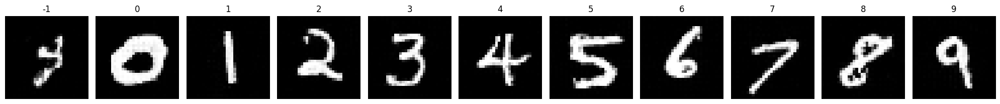

Epoch 310/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0296 - noise_loss: 0.0228 - classifier_loss: 0.7918 - classifier_accuracy: 0.7298 - val_loss: 0.0490 - val_noise_loss: 0.0478 - val_image_loss: 0.1977 - val_classifier_loss: 0.1389 - val_classifier_accuracy: 0.9573 - learning_rate: 5.9898e-04


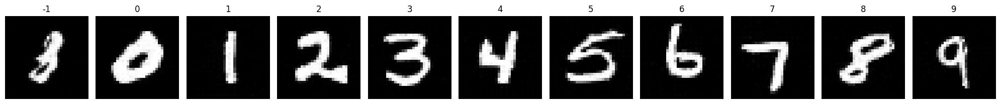

Epoch 311/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0293 - noise_loss: 0.0226 - classifier_loss: 0.7807 - classifier_accuracy: 0.7262 - val_loss: 0.0488 - val_noise_loss: 0.0476 - val_image_loss: 0.2005 - val_classifier_loss: 0.1357 - val_classifier_accuracy: 0.9592 - learning_rate: 5.8629e-04


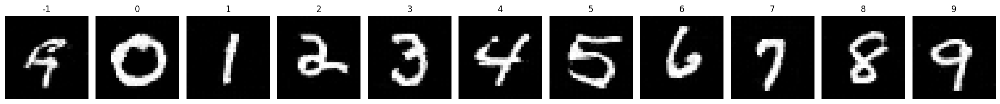

Epoch 312/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0294 - noise_loss: 0.0226 - classifier_loss: 0.7859 - classifier_accuracy: 0.7239 - val_loss: 0.0497 - val_noise_loss: 0.0485 - val_image_loss: 0.1980 - val_classifier_loss: 0.1345 - val_classifier_accuracy: 0.9592 - learning_rate: 5.7372e-04


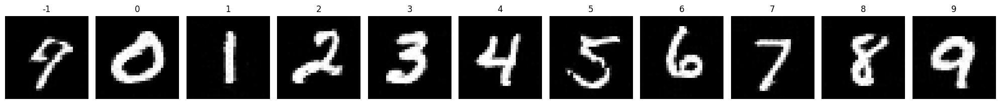

Epoch 313/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0292 - noise_loss: 0.0226 - classifier_loss: 0.7685 - classifier_accuracy: 0.7356 - val_loss: 0.0493 - val_noise_loss: 0.0482 - val_image_loss: 0.1956 - val_classifier_loss: 0.1304 - val_classifier_accuracy: 0.9596 - learning_rate: 5.6126e-04


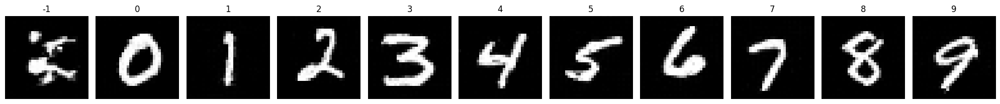

Epoch 314/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0292 - noise_loss: 0.0227 - classifier_loss: 0.7560 - classifier_accuracy: 0.7328 - val_loss: 0.0494 - val_noise_loss: 0.0483 - val_image_loss: 0.1947 - val_classifier_loss: 0.1273 - val_classifier_accuracy: 0.9605 - learning_rate: 5.4892e-04


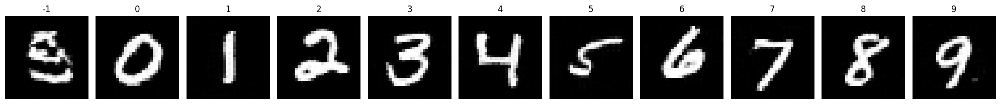

Epoch 315/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0293 - noise_loss: 0.0226 - classifier_loss: 0.7785 - classifier_accuracy: 0.7307 - val_loss: 0.0491 - val_noise_loss: 0.0480 - val_image_loss: 0.1941 - val_classifier_loss: 0.1248 - val_classifier_accuracy: 0.9613 - learning_rate: 5.3671e-04


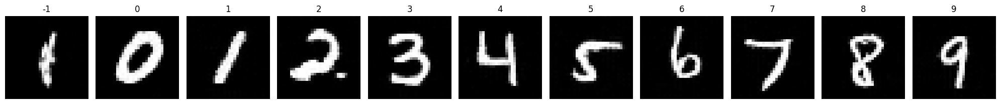

Epoch 316/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0295 - noise_loss: 0.0228 - classifier_loss: 0.7809 - classifier_accuracy: 0.7321 - val_loss: 0.0494 - val_noise_loss: 0.0483 - val_image_loss: 0.2003 - val_classifier_loss: 0.1262 - val_classifier_accuracy: 0.9603 - learning_rate: 5.2461e-04


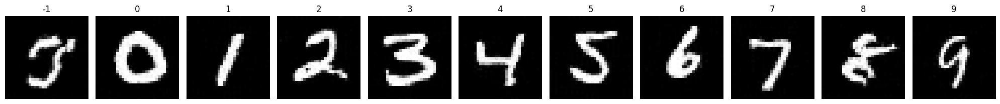

Epoch 317/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0293 - noise_loss: 0.0227 - classifier_loss: 0.7733 - classifier_accuracy: 0.7331 - val_loss: 0.0489 - val_noise_loss: 0.0478 - val_image_loss: 0.1986 - val_classifier_loss: 0.1249 - val_classifier_accuracy: 0.9608 - learning_rate: 5.1264e-04


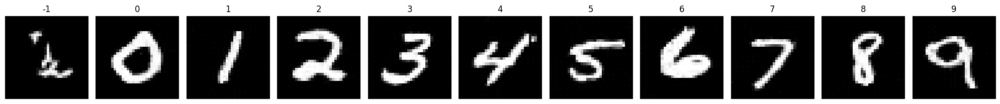

Epoch 318/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0226 - classifier_loss: 0.7732 - classifier_accuracy: 0.7286 - val_loss: 0.0487 - val_noise_loss: 0.0477 - val_image_loss: 0.1966 - val_classifier_loss: 0.1244 - val_classifier_accuracy: 0.9609 - learning_rate: 5.0079e-04


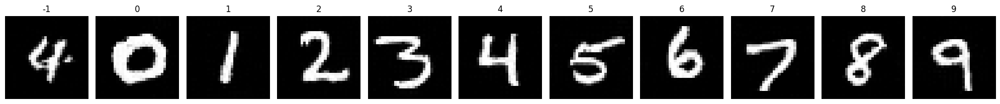

Epoch 319/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0292 - noise_loss: 0.0225 - classifier_loss: 0.7708 - classifier_accuracy: 0.7342 - val_loss: 0.0492 - val_noise_loss: 0.0482 - val_image_loss: 0.1907 - val_classifier_loss: 0.1242 - val_classifier_accuracy: 0.9616 - learning_rate: 4.8906e-04


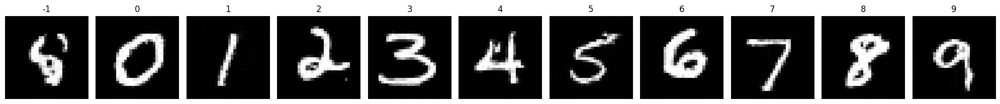

Epoch 320/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0293 - noise_loss: 0.0227 - classifier_loss: 0.7714 - classifier_accuracy: 0.7357 - val_loss: 0.0489 - val_noise_loss: 0.0479 - val_image_loss: 0.1935 - val_classifier_loss: 0.1245 - val_classifier_accuracy: 0.9613 - learning_rate: 4.7746e-04


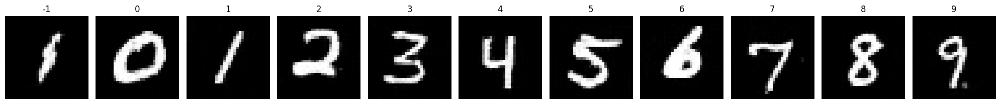

Epoch 321/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0227 - classifier_loss: 0.7559 - classifier_accuracy: 0.7424 - val_loss: 0.0492 - val_noise_loss: 0.0481 - val_image_loss: 0.1957 - val_classifier_loss: 0.1227 - val_classifier_accuracy: 0.9615 - learning_rate: 4.6598e-04


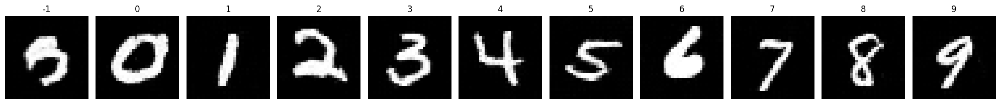

Epoch 322/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0291 - noise_loss: 0.0227 - classifier_loss: 0.7445 - classifier_accuracy: 0.7407 - val_loss: 0.0493 - val_noise_loss: 0.0482 - val_image_loss: 0.1976 - val_classifier_loss: 0.1235 - val_classifier_accuracy: 0.9616 - learning_rate: 4.5463e-04


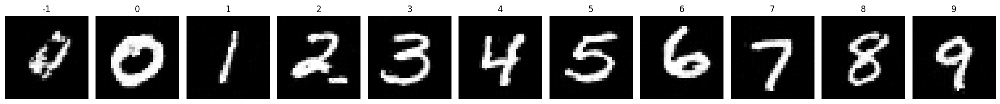

Epoch 323/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0289 - noise_loss: 0.0226 - classifier_loss: 0.7402 - classifier_accuracy: 0.7476 - val_loss: 0.0494 - val_noise_loss: 0.0483 - val_image_loss: 0.1937 - val_classifier_loss: 0.1226 - val_classifier_accuracy: 0.9618 - learning_rate: 4.4340e-04


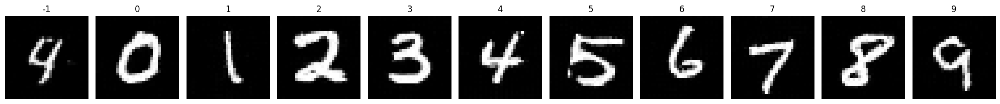

Epoch 324/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0290 - noise_loss: 0.0227 - classifier_loss: 0.7300 - classifier_accuracy: 0.7470 - val_loss: 0.0494 - val_noise_loss: 0.0484 - val_image_loss: 0.1979 - val_classifier_loss: 0.1210 - val_classifier_accuracy: 0.9624 - learning_rate: 4.3230e-04


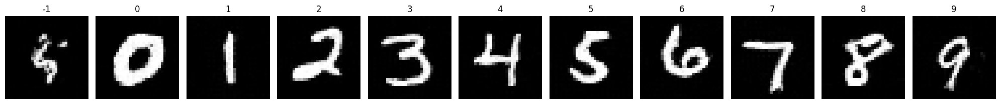

Epoch 325/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0292 - noise_loss: 0.0226 - classifier_loss: 0.7693 - classifier_accuracy: 0.7321 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.2003 - val_classifier_loss: 0.1191 - val_classifier_accuracy: 0.9627 - learning_rate: 4.2133e-04


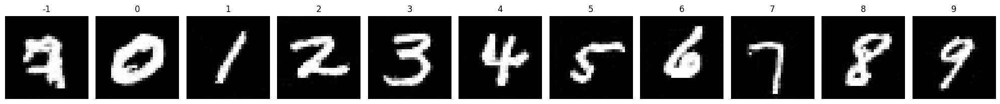

Epoch 326/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0294 - noise_loss: 0.0226 - classifier_loss: 0.7827 - classifier_accuracy: 0.7260 - val_loss: 0.0498 - val_noise_loss: 0.0488 - val_image_loss: 0.2016 - val_classifier_loss: 0.1186 - val_classifier_accuracy: 0.9628 - learning_rate: 4.1048e-04


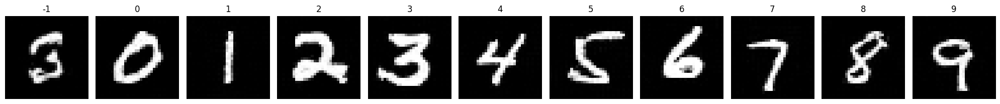

Epoch 327/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0226 - classifier_loss: 0.7695 - classifier_accuracy: 0.7327 - val_loss: 0.0503 - val_noise_loss: 0.0493 - val_image_loss: 0.2011 - val_classifier_loss: 0.1179 - val_classifier_accuracy: 0.9629 - learning_rate: 3.9977e-04


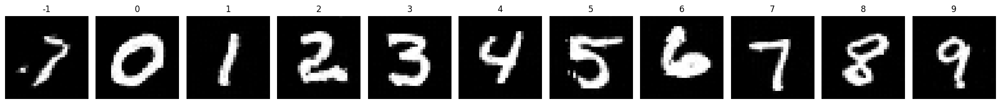

Epoch 328/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0293 - noise_loss: 0.0227 - classifier_loss: 0.7627 - classifier_accuracy: 0.7323 - val_loss: 0.0503 - val_noise_loss: 0.0492 - val_image_loss: 0.2013 - val_classifier_loss: 0.1186 - val_classifier_accuracy: 0.9625 - learning_rate: 3.8918e-04


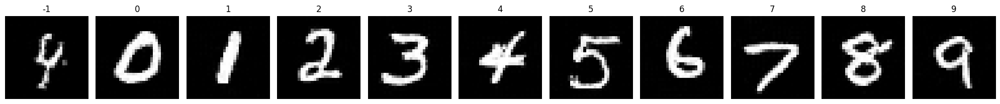

Epoch 329/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0292 - noise_loss: 0.0225 - classifier_loss: 0.7700 - classifier_accuracy: 0.7334 - val_loss: 0.0495 - val_noise_loss: 0.0485 - val_image_loss: 0.2009 - val_classifier_loss: 0.1188 - val_classifier_accuracy: 0.9629 - learning_rate: 3.7872e-04


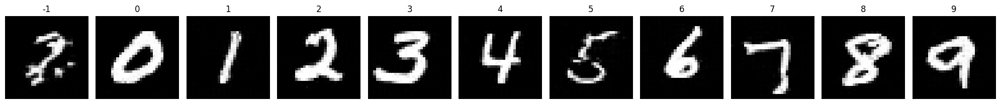

Epoch 330/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0288 - noise_loss: 0.0225 - classifier_loss: 0.7393 - classifier_accuracy: 0.7439 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.1978 - val_classifier_loss: 0.1182 - val_classifier_accuracy: 0.9633 - learning_rate: 3.6840e-04


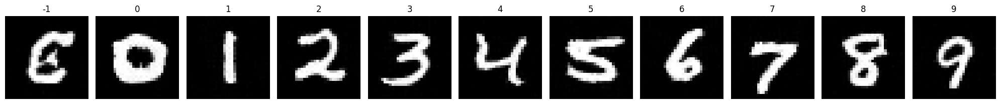

Epoch 331/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0293 - noise_loss: 0.0226 - classifier_loss: 0.7711 - classifier_accuracy: 0.7349 - val_loss: 0.0502 - val_noise_loss: 0.0491 - val_image_loss: 0.1982 - val_classifier_loss: 0.1190 - val_classifier_accuracy: 0.9635 - learning_rate: 3.5821e-04


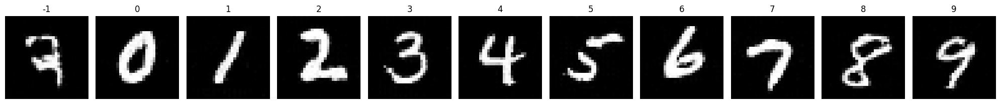

Epoch 332/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0292 - noise_loss: 0.0225 - classifier_loss: 0.7742 - classifier_accuracy: 0.7399 - val_loss: 0.0502 - val_noise_loss: 0.0492 - val_image_loss: 0.2022 - val_classifier_loss: 0.1182 - val_classifier_accuracy: 0.9641 - learning_rate: 3.4814e-04


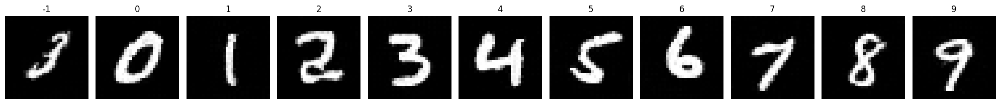

Epoch 333/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7476 - classifier_accuracy: 0.7380 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1994 - val_classifier_loss: 0.1182 - val_classifier_accuracy: 0.9640 - learning_rate: 3.3822e-04


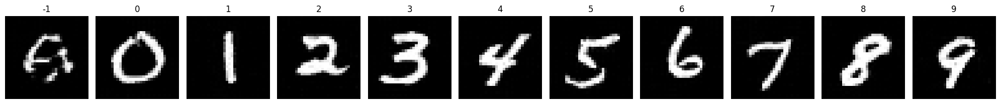

Epoch 334/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7535 - classifier_accuracy: 0.7434 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1966 - val_classifier_loss: 0.1182 - val_classifier_accuracy: 0.9649 - learning_rate: 3.2842e-04


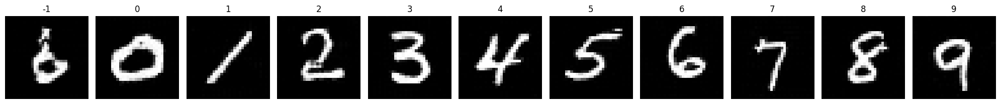

Epoch 335/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0290 - noise_loss: 0.0225 - classifier_loss: 0.7518 - classifier_accuracy: 0.7390 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.1996 - val_classifier_loss: 0.1171 - val_classifier_accuracy: 0.9649 - learning_rate: 3.1876e-04


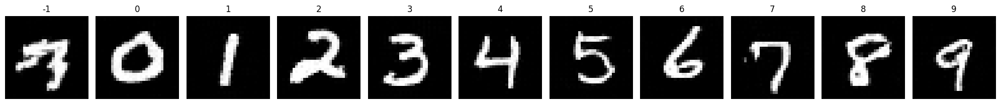

Epoch 336/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0291 - noise_loss: 0.0226 - classifier_loss: 0.7650 - classifier_accuracy: 0.7358 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.1982 - val_classifier_loss: 0.1173 - val_classifier_accuracy: 0.9650 - learning_rate: 3.0923e-04


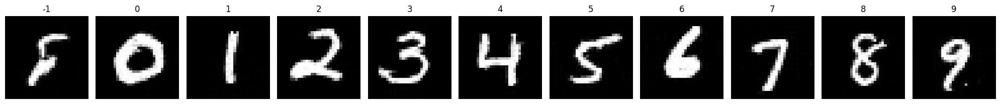

Epoch 337/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7411 - classifier_accuracy: 0.7483 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.1960 - val_classifier_loss: 0.1178 - val_classifier_accuracy: 0.9642 - learning_rate: 2.9984e-04


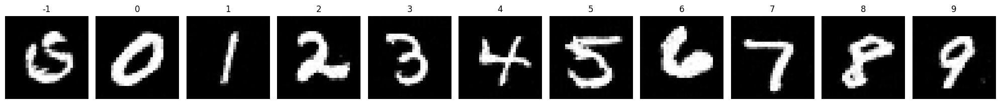

Epoch 338/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0290 - noise_loss: 0.0225 - classifier_loss: 0.7441 - classifier_accuracy: 0.7442 - val_loss: 0.0492 - val_noise_loss: 0.0482 - val_image_loss: 0.2021 - val_classifier_loss: 0.1183 - val_classifier_accuracy: 0.9635 - learning_rate: 2.9059e-04


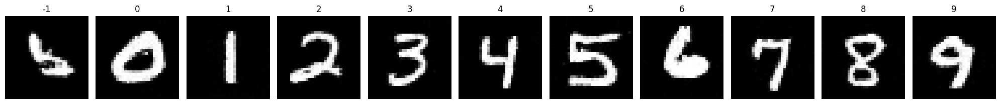

Epoch 339/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7435 - classifier_accuracy: 0.7478 - val_loss: 0.0491 - val_noise_loss: 0.0481 - val_image_loss: 0.1979 - val_classifier_loss: 0.1183 - val_classifier_accuracy: 0.9630 - learning_rate: 2.8147e-04


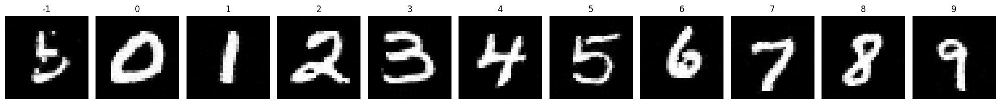

Epoch 340/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7446 - classifier_accuracy: 0.7442 - val_loss: 0.0492 - val_noise_loss: 0.0481 - val_image_loss: 0.1962 - val_classifier_loss: 0.1166 - val_classifier_accuracy: 0.9634 - learning_rate: 2.7248e-04


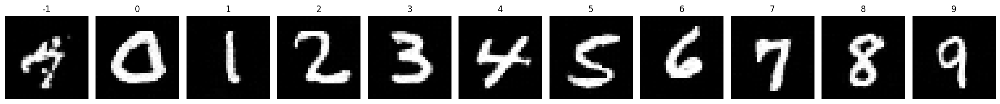

Epoch 341/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0287 - noise_loss: 0.0225 - classifier_loss: 0.7296 - classifier_accuracy: 0.7473 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1973 - val_classifier_loss: 0.1166 - val_classifier_accuracy: 0.9643 - learning_rate: 2.6364e-04


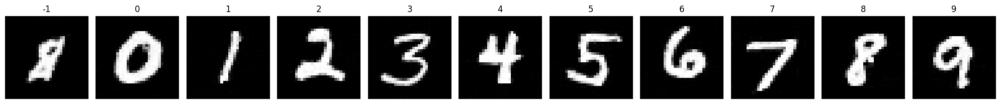

Epoch 342/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0289 - noise_loss: 0.0226 - classifier_loss: 0.7310 - classifier_accuracy: 0.7453 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1988 - val_classifier_loss: 0.1183 - val_classifier_accuracy: 0.9636 - learning_rate: 2.5493e-04


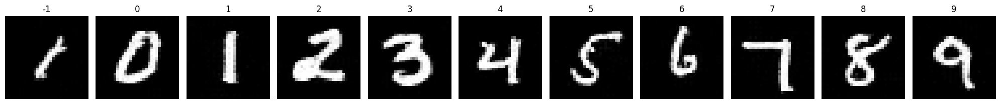

Epoch 343/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7393 - classifier_accuracy: 0.7422 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.1965 - val_classifier_loss: 0.1191 - val_classifier_accuracy: 0.9636 - learning_rate: 2.4636e-04


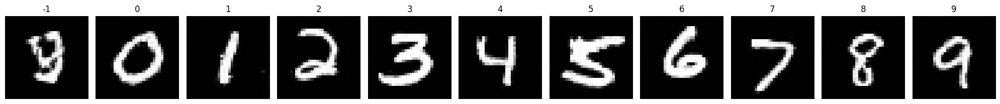

Epoch 344/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0225 - classifier_loss: 0.7437 - classifier_accuracy: 0.7451 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.2000 - val_classifier_loss: 0.1192 - val_classifier_accuracy: 0.9625 - learning_rate: 2.3793e-04


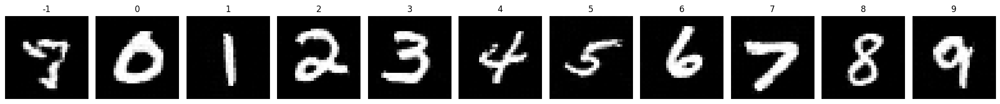

Epoch 345/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7348 - classifier_accuracy: 0.7499 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.1941 - val_classifier_loss: 0.1200 - val_classifier_accuracy: 0.9620 - learning_rate: 2.2964e-04


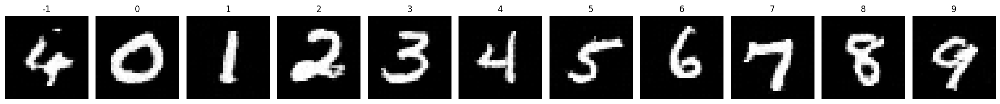

Epoch 346/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7325 - classifier_accuracy: 0.7493 - val_loss: 0.0490 - val_noise_loss: 0.0480 - val_image_loss: 0.2011 - val_classifier_loss: 0.1187 - val_classifier_accuracy: 0.9622 - learning_rate: 2.2149e-04


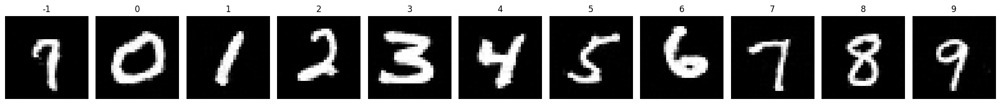

Epoch 347/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7431 - classifier_accuracy: 0.7473 - val_loss: 0.0494 - val_noise_loss: 0.0483 - val_image_loss: 0.1964 - val_classifier_loss: 0.1187 - val_classifier_accuracy: 0.9626 - learning_rate: 2.1348e-04


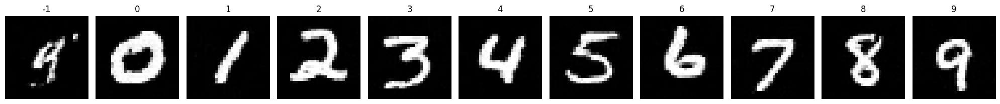

Epoch 348/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0224 - classifier_loss: 0.7575 - classifier_accuracy: 0.7354 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1964 - val_classifier_loss: 0.1188 - val_classifier_accuracy: 0.9628 - learning_rate: 2.0561e-04


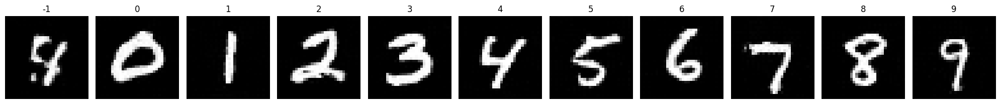

Epoch 349/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0223 - classifier_loss: 0.7389 - classifier_accuracy: 0.7375 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.1979 - val_classifier_loss: 0.1179 - val_classifier_accuracy: 0.9635 - learning_rate: 1.9789e-04


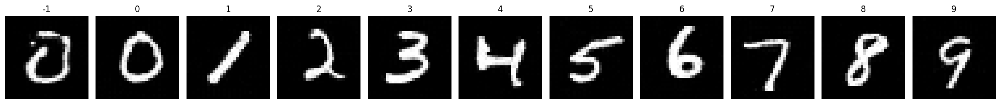

Epoch 350/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0285 - noise_loss: 0.0223 - classifier_loss: 0.7179 - classifier_accuracy: 0.7570 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.1976 - val_classifier_loss: 0.1183 - val_classifier_accuracy: 0.9639 - learning_rate: 1.9030e-04


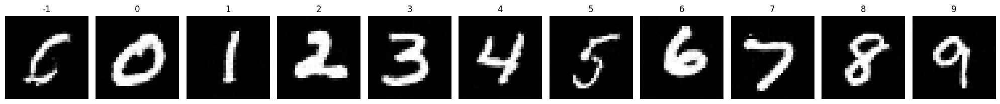

Epoch 351/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0285 - noise_loss: 0.0224 - classifier_loss: 0.7178 - classifier_accuracy: 0.7495 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1967 - val_classifier_loss: 0.1170 - val_classifier_accuracy: 0.9649 - learning_rate: 1.8286e-04


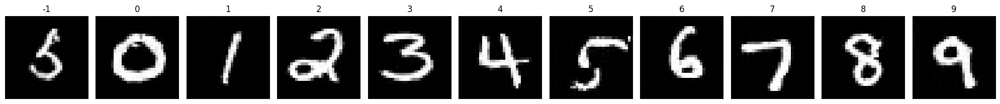

Epoch 352/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7342 - classifier_accuracy: 0.7459 - val_loss: 0.0502 - val_noise_loss: 0.0492 - val_image_loss: 0.1942 - val_classifier_loss: 0.1167 - val_classifier_accuracy: 0.9642 - learning_rate: 1.7556e-04


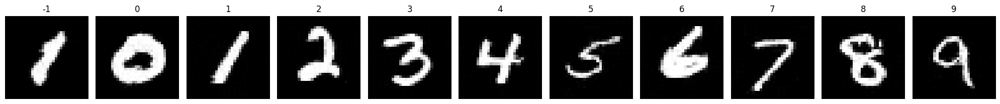

Epoch 353/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7338 - classifier_accuracy: 0.7467 - val_loss: 0.0491 - val_noise_loss: 0.0481 - val_image_loss: 0.2018 - val_classifier_loss: 0.1182 - val_classifier_accuracy: 0.9645 - learning_rate: 1.6840e-04


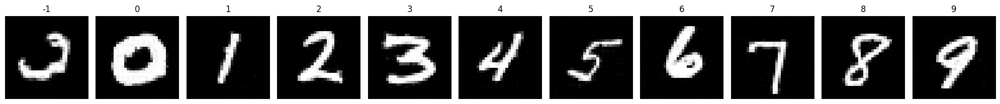

Epoch 354/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7421 - classifier_accuracy: 0.7464 - val_loss: 0.0502 - val_noise_loss: 0.0492 - val_image_loss: 0.1983 - val_classifier_loss: 0.1181 - val_classifier_accuracy: 0.9647 - learning_rate: 1.6139e-04


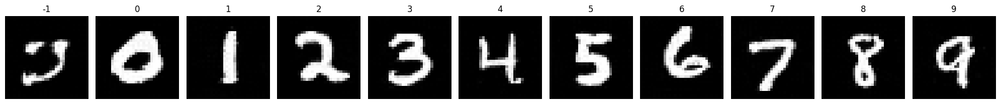

Epoch 355/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0223 - classifier_loss: 0.7270 - classifier_accuracy: 0.7479 - val_loss: 0.0498 - val_noise_loss: 0.0488 - val_image_loss: 0.1971 - val_classifier_loss: 0.1184 - val_classifier_accuracy: 0.9649 - learning_rate: 1.5452e-04


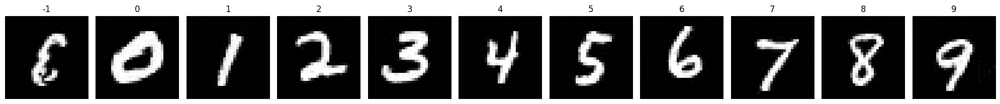

Epoch 356/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7396 - classifier_accuracy: 0.7465 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.2002 - val_classifier_loss: 0.1187 - val_classifier_accuracy: 0.9652 - learning_rate: 1.4780e-04


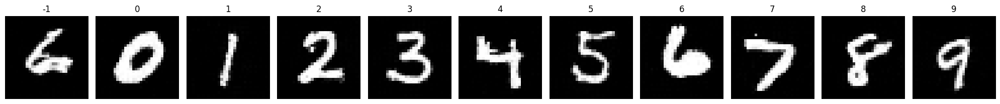

Epoch 357/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0289 - noise_loss: 0.0224 - classifier_loss: 0.7525 - classifier_accuracy: 0.7483 - val_loss: 0.0496 - val_noise_loss: 0.0485 - val_image_loss: 0.1953 - val_classifier_loss: 0.1181 - val_classifier_accuracy: 0.9650 - learning_rate: 1.4122e-04


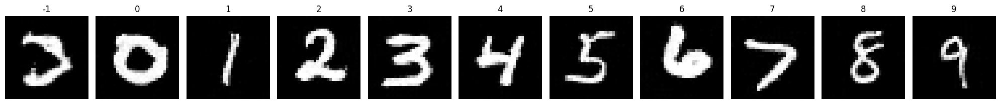

Epoch 358/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0288 - noise_loss: 0.0225 - classifier_loss: 0.7364 - classifier_accuracy: 0.7456 - val_loss: 0.0495 - val_noise_loss: 0.0485 - val_image_loss: 0.2059 - val_classifier_loss: 0.1186 - val_classifier_accuracy: 0.9644 - learning_rate: 1.3479e-04


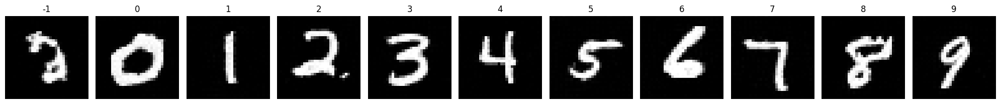

Epoch 359/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7355 - classifier_accuracy: 0.7439 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1957 - val_classifier_loss: 0.1187 - val_classifier_accuracy: 0.9649 - learning_rate: 1.2850e-04


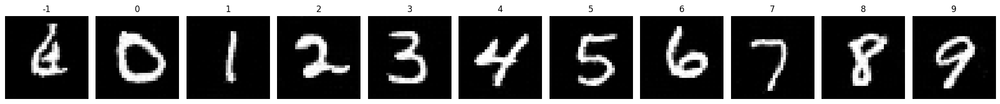

Epoch 360/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0224 - classifier_loss: 0.7265 - classifier_accuracy: 0.7472 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.1980 - val_classifier_loss: 0.1175 - val_classifier_accuracy: 0.9642 - learning_rate: 1.2236e-04


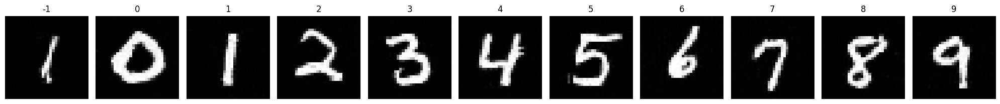

Epoch 361/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0290 - noise_loss: 0.0224 - classifier_loss: 0.7594 - classifier_accuracy: 0.7410 - val_loss: 0.0502 - val_noise_loss: 0.0492 - val_image_loss: 0.1936 - val_classifier_loss: 0.1174 - val_classifier_accuracy: 0.9645 - learning_rate: 1.1636e-04


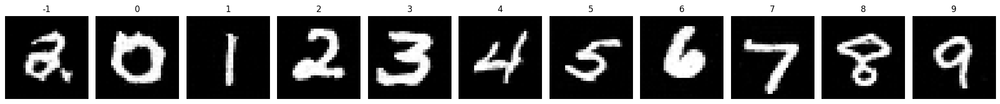

Epoch 362/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7429 - classifier_accuracy: 0.7422 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1970 - val_classifier_loss: 0.1166 - val_classifier_accuracy: 0.9647 - learning_rate: 1.1052e-04


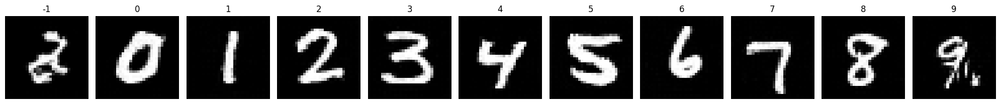

Epoch 363/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7414 - classifier_accuracy: 0.7443 - val_loss: 0.0502 - val_noise_loss: 0.0492 - val_image_loss: 0.1935 - val_classifier_loss: 0.1155 - val_classifier_accuracy: 0.9645 - learning_rate: 1.0482e-04


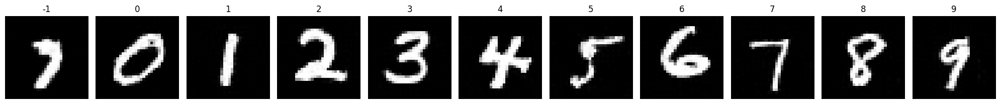

Epoch 364/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7396 - classifier_accuracy: 0.7427 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.2020 - val_classifier_loss: 0.1148 - val_classifier_accuracy: 0.9646 - learning_rate: 9.9266e-05


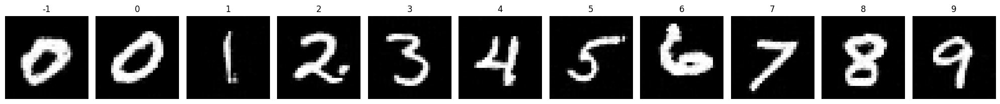

Epoch 365/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0224 - classifier_loss: 0.7116 - classifier_accuracy: 0.7506 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1990 - val_classifier_loss: 0.1138 - val_classifier_accuracy: 0.9647 - learning_rate: 9.3862e-05


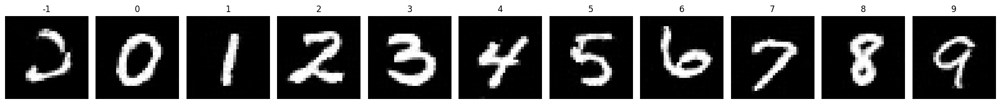

Epoch 366/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0285 - noise_loss: 0.0223 - classifier_loss: 0.7198 - classifier_accuracy: 0.7480 - val_loss: 0.0492 - val_noise_loss: 0.0482 - val_image_loss: 0.1990 - val_classifier_loss: 0.1142 - val_classifier_accuracy: 0.9646 - learning_rate: 8.8606e-05


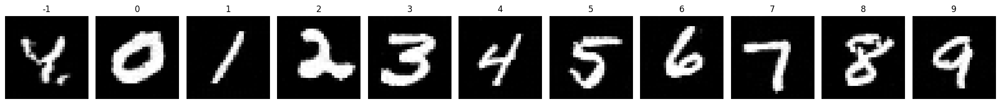

Epoch 367/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7363 - classifier_accuracy: 0.7459 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.2009 - val_classifier_loss: 0.1146 - val_classifier_accuracy: 0.9643 - learning_rate: 8.3500e-05


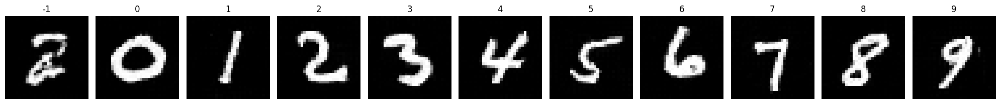

Epoch 368/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7360 - classifier_accuracy: 0.7461 - val_loss: 0.0496 - val_noise_loss: 0.0486 - val_image_loss: 0.2027 - val_classifier_loss: 0.1154 - val_classifier_accuracy: 0.9645 - learning_rate: 7.8542e-05


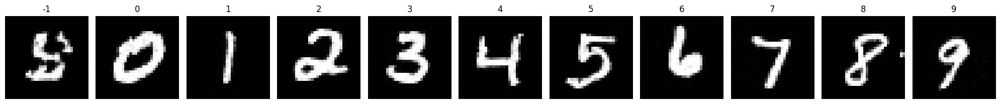

Epoch 369/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7476 - classifier_accuracy: 0.7408 - val_loss: 0.0494 - val_noise_loss: 0.0485 - val_image_loss: 0.2005 - val_classifier_loss: 0.1151 - val_classifier_accuracy: 0.9646 - learning_rate: 7.3734e-05


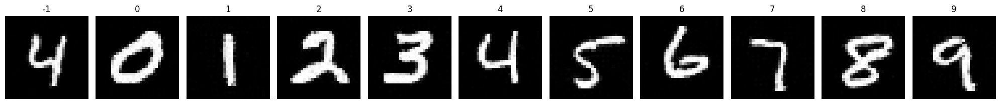

Epoch 370/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0288 - noise_loss: 0.0223 - classifier_loss: 0.7485 - classifier_accuracy: 0.7376 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.2017 - val_classifier_loss: 0.1148 - val_classifier_accuracy: 0.9648 - learning_rate: 6.9075e-05


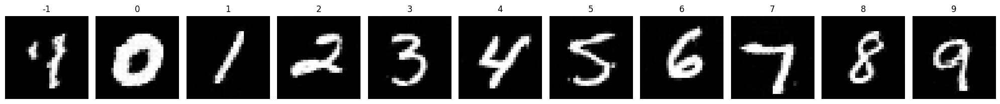

Epoch 371/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0285 - noise_loss: 0.0223 - classifier_loss: 0.7193 - classifier_accuracy: 0.7492 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.1996 - val_classifier_loss: 0.1152 - val_classifier_accuracy: 0.9650 - learning_rate: 6.4567e-05


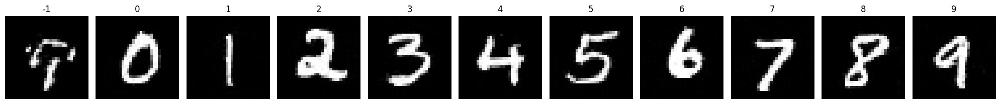

Epoch 372/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0288 - noise_loss: 0.0223 - classifier_loss: 0.7546 - classifier_accuracy: 0.7424 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.1990 - val_classifier_loss: 0.1154 - val_classifier_accuracy: 0.9649 - learning_rate: 6.0208e-05


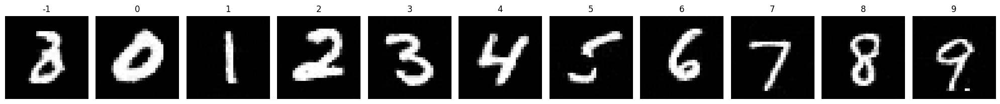

Epoch 373/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0288 - noise_loss: 0.0224 - classifier_loss: 0.7378 - classifier_accuracy: 0.7436 - val_loss: 0.0498 - val_noise_loss: 0.0489 - val_image_loss: 0.2005 - val_classifier_loss: 0.1138 - val_classifier_accuracy: 0.9645 - learning_rate: 5.6000e-05


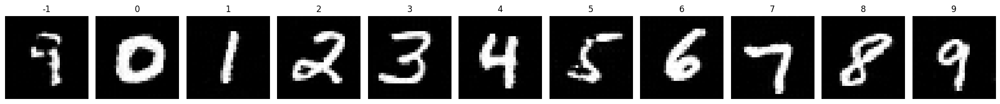

Epoch 374/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0286 - noise_loss: 0.0224 - classifier_loss: 0.7213 - classifier_accuracy: 0.7496 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.2013 - val_classifier_loss: 0.1131 - val_classifier_accuracy: 0.9655 - learning_rate: 5.1943e-05


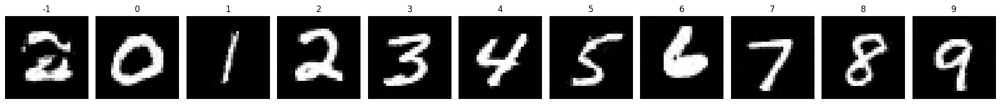

Epoch 375/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0222 - classifier_loss: 0.7371 - classifier_accuracy: 0.7469 - val_loss: 0.0494 - val_noise_loss: 0.0484 - val_image_loss: 0.2005 - val_classifier_loss: 0.1131 - val_classifier_accuracy: 0.9653 - learning_rate: 4.8037e-05


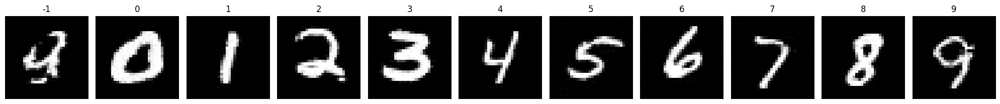

Epoch 376/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7252 - classifier_accuracy: 0.7492 - val_loss: 0.0504 - val_noise_loss: 0.0494 - val_image_loss: 0.1980 - val_classifier_loss: 0.1129 - val_classifier_accuracy: 0.9652 - learning_rate: 4.4282e-05


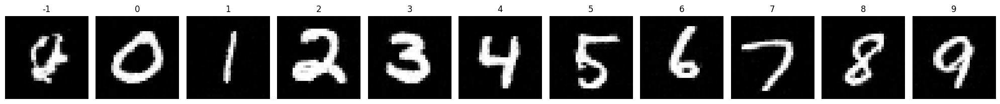

Epoch 377/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7352 - classifier_accuracy: 0.7483 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.1965 - val_classifier_loss: 0.1130 - val_classifier_accuracy: 0.9655 - learning_rate: 4.0678e-05


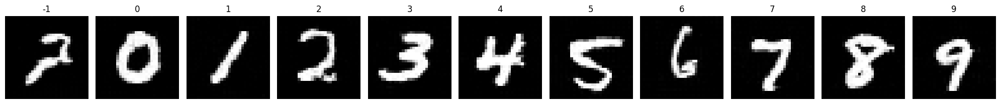

Epoch 378/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0285 - noise_loss: 0.0223 - classifier_loss: 0.7172 - classifier_accuracy: 0.7521 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.2007 - val_classifier_loss: 0.1129 - val_classifier_accuracy: 0.9652 - learning_rate: 3.7227e-05


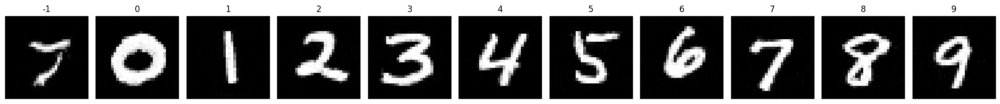

Epoch 379/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0222 - classifier_loss: 0.7438 - classifier_accuracy: 0.7413 - val_loss: 0.0493 - val_noise_loss: 0.0484 - val_image_loss: 0.2011 - val_classifier_loss: 0.1128 - val_classifier_accuracy: 0.9650 - learning_rate: 3.3927e-05


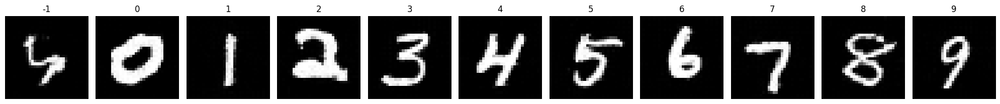

Epoch 380/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7379 - classifier_accuracy: 0.7463 - val_loss: 0.0492 - val_noise_loss: 0.0483 - val_image_loss: 0.1986 - val_classifier_loss: 0.1136 - val_classifier_accuracy: 0.9648 - learning_rate: 3.0779e-05


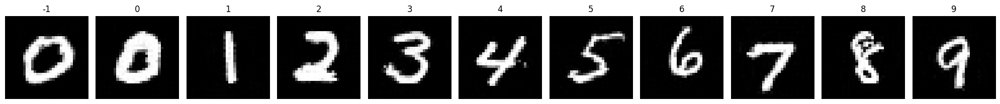

Epoch 381/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7367 - classifier_accuracy: 0.7428 - val_loss: 0.0491 - val_noise_loss: 0.0481 - val_image_loss: 0.2020 - val_classifier_loss: 0.1134 - val_classifier_accuracy: 0.9646 - learning_rate: 2.7784e-05


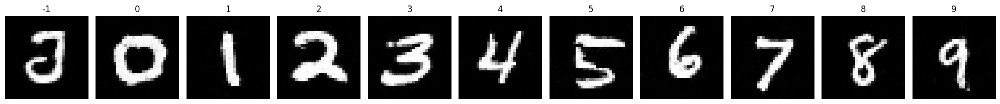

Epoch 382/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0284 - noise_loss: 0.0223 - classifier_loss: 0.7147 - classifier_accuracy: 0.7568 - val_loss: 0.0495 - val_noise_loss: 0.0485 - val_image_loss: 0.1984 - val_classifier_loss: 0.1133 - val_classifier_accuracy: 0.9644 - learning_rate: 2.4941e-05


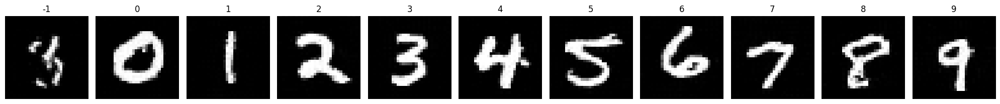

Epoch 383/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0286 - noise_loss: 0.0224 - classifier_loss: 0.7245 - classifier_accuracy: 0.7489 - val_loss: 0.0494 - val_noise_loss: 0.0485 - val_image_loss: 0.1995 - val_classifier_loss: 0.1129 - val_classifier_accuracy: 0.9645 - learning_rate: 2.2251e-05


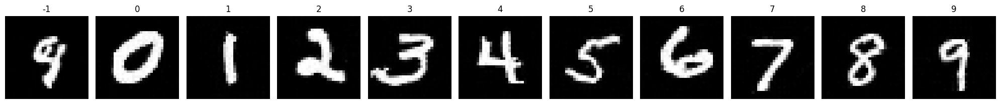

Epoch 384/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0286 - noise_loss: 0.0223 - classifier_loss: 0.7265 - classifier_accuracy: 0.7474 - val_loss: 0.0499 - val_noise_loss: 0.0489 - val_image_loss: 0.1992 - val_classifier_loss: 0.1124 - val_classifier_accuracy: 0.9648 - learning_rate: 1.9713e-05


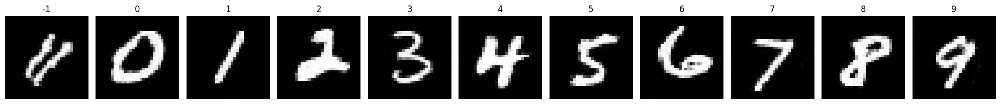

Epoch 385/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0284 - noise_loss: 0.0222 - classifier_loss: 0.7268 - classifier_accuracy: 0.7530 - val_loss: 0.0501 - val_noise_loss: 0.0491 - val_image_loss: 0.1906 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9653 - learning_rate: 1.7329e-05


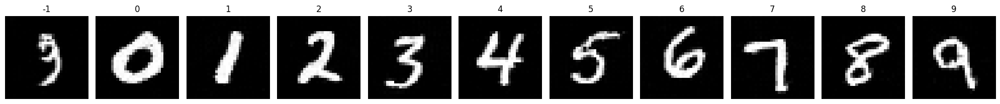

Epoch 386/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7332 - classifier_accuracy: 0.7468 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1991 - val_classifier_loss: 0.1123 - val_classifier_accuracy: 0.9656 - learning_rate: 1.5098e-05


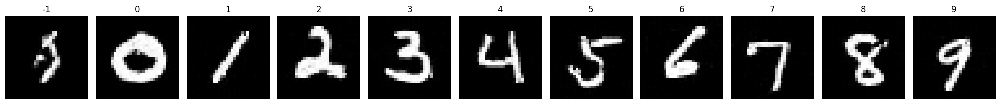

Epoch 387/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0283 - noise_loss: 0.0222 - classifier_loss: 0.7059 - classifier_accuracy: 0.7565 - val_loss: 0.0492 - val_noise_loss: 0.0482 - val_image_loss: 0.1980 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9655 - learning_rate: 1.3020e-05


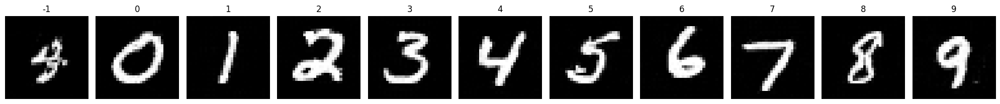

Epoch 388/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0223 - classifier_loss: 0.7325 - classifier_accuracy: 0.7459 - val_loss: 0.0501 - val_noise_loss: 0.0492 - val_image_loss: 0.1969 - val_classifier_loss: 0.1121 - val_classifier_accuracy: 0.9654 - learning_rate: 1.1095e-05


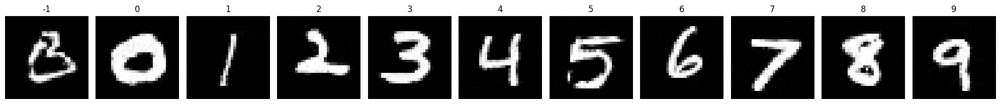

Epoch 389/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0285 - noise_loss: 0.0222 - classifier_loss: 0.7291 - classifier_accuracy: 0.7482 - val_loss: 0.0500 - val_noise_loss: 0.0490 - val_image_loss: 0.1985 - val_classifier_loss: 0.1120 - val_classifier_accuracy: 0.9650 - learning_rate: 9.3241e-06


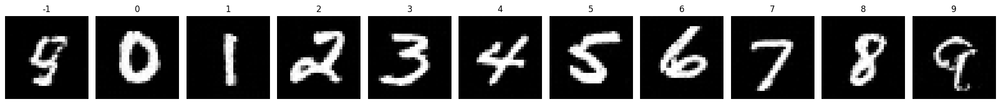

Epoch 390/400
468/468 [==============================] - 60s 128ms/step - loss: 0.0288 - noise_loss: 0.0223 - classifier_loss: 0.7467 - classifier_accuracy: 0.7435 - val_loss: 0.0497 - val_noise_loss: 0.0488 - val_image_loss: 0.1991 - val_classifier_loss: 0.1121 - val_classifier_accuracy: 0.9643 - learning_rate: 7.7066e-06


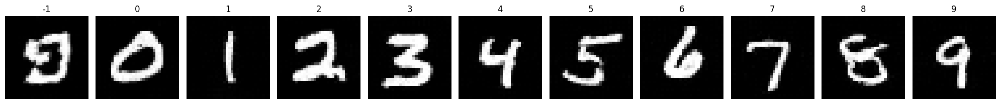

Epoch 391/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0287 - noise_loss: 0.0222 - classifier_loss: 0.7581 - classifier_accuracy: 0.7388 - val_loss: 0.0498 - val_noise_loss: 0.0488 - val_image_loss: 0.1999 - val_classifier_loss: 0.1120 - val_classifier_accuracy: 0.9644 - learning_rate: 6.2430e-06


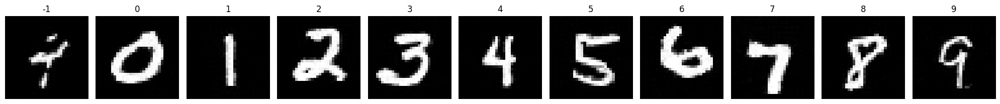

Epoch 392/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0285 - noise_loss: 0.0222 - classifier_loss: 0.7211 - classifier_accuracy: 0.7460 - val_loss: 0.0499 - val_noise_loss: 0.0490 - val_image_loss: 0.1943 - val_classifier_loss: 0.1121 - val_classifier_accuracy: 0.9646 - learning_rate: 4.9332e-06


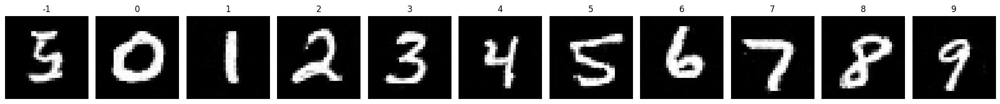

Epoch 393/400
468/468 [==============================] - 61s 130ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7287 - classifier_accuracy: 0.7471 - val_loss: 0.0491 - val_noise_loss: 0.0482 - val_image_loss: 0.1980 - val_classifier_loss: 0.1121 - val_classifier_accuracy: 0.9644 - learning_rate: 3.7773e-06


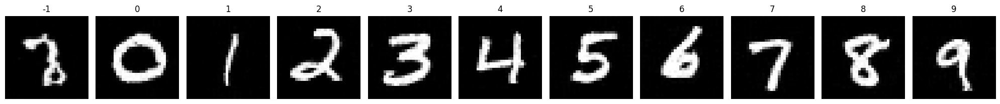

Epoch 394/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0287 - noise_loss: 0.0224 - classifier_loss: 0.7423 - classifier_accuracy: 0.7458 - val_loss: 0.0498 - val_noise_loss: 0.0488 - val_image_loss: 0.1970 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9644 - learning_rate: 2.7753e-06


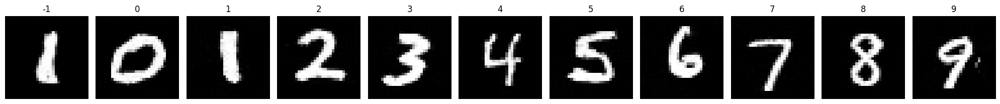

Epoch 395/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0285 - noise_loss: 0.0222 - classifier_loss: 0.7336 - classifier_accuracy: 0.7474 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1977 - val_classifier_loss: 0.1123 - val_classifier_accuracy: 0.9645 - learning_rate: 1.9275e-06


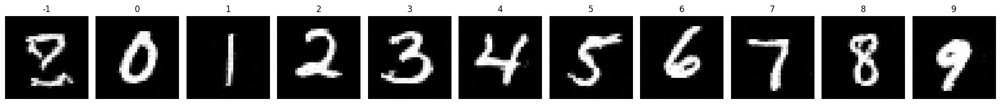

Epoch 396/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0285 - noise_loss: 0.0222 - classifier_loss: 0.7324 - classifier_accuracy: 0.7454 - val_loss: 0.0497 - val_noise_loss: 0.0487 - val_image_loss: 0.1996 - val_classifier_loss: 0.1123 - val_classifier_accuracy: 0.9645 - learning_rate: 1.2337e-06


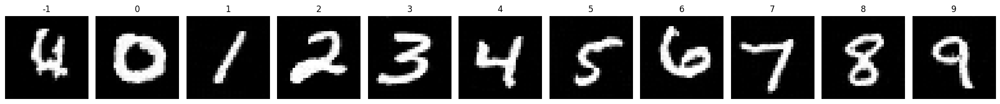

Epoch 397/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0285 - noise_loss: 0.0222 - classifier_loss: 0.7280 - classifier_accuracy: 0.7521 - val_loss: 0.0498 - val_noise_loss: 0.0488 - val_image_loss: 0.1994 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9646 - learning_rate: 6.9395e-07


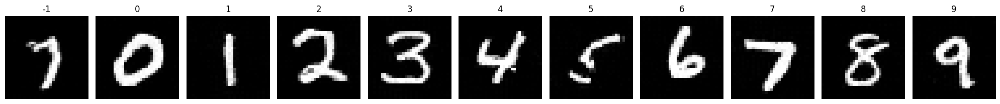

Epoch 398/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0288 - noise_loss: 0.0223 - classifier_loss: 0.7513 - classifier_accuracy: 0.7396 - val_loss: 0.0498 - val_noise_loss: 0.0489 - val_image_loss: 0.1971 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9646 - learning_rate: 3.0845e-07


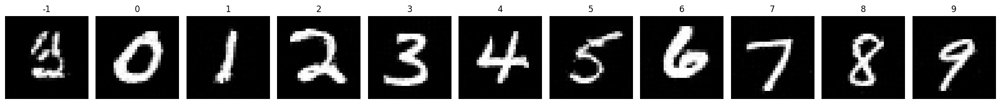

Epoch 399/400
468/468 [==============================] - 61s 129ms/step - loss: 0.0286 - noise_loss: 0.0223 - classifier_loss: 0.7276 - classifier_accuracy: 0.7448 - val_loss: 0.0495 - val_noise_loss: 0.0485 - val_image_loss: 0.2024 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9646 - learning_rate: 7.7039e-08


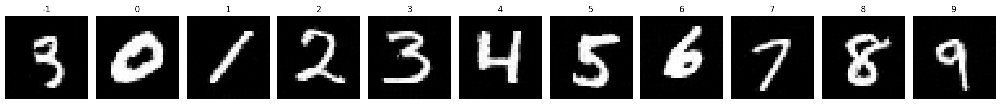

Epoch 400/400
468/468 [==============================] - 60s 129ms/step - loss: 0.0282 - noise_loss: 0.0223 - classifier_loss: 0.6820 - classifier_accuracy: 0.7660 - val_loss: 0.0495 - val_noise_loss: 0.0485 - val_image_loss: 0.1993 - val_classifier_loss: 0.1122 - val_classifier_accuracy: 0.9646 - learning_rate: 0.0000e+00


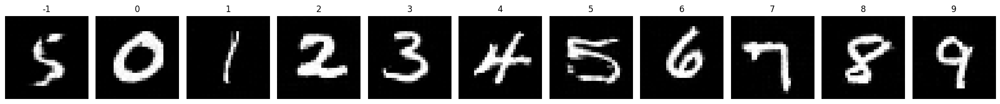

In [8]:
history = model.fit(
    x=trainset, 
    epochs=epochs, 
    validation_data=valset, 
    callbacks=callbacks_list
).history

In [9]:
model.save_weights("./models/U-DiT CLF/model.weights.h5")

In [11]:
model.evaluate(valset, network_name="ema")

79/79 [==============================] - 11s 141ms/step - loss: 0.0498 - noise_loss: 0.0488 - image_loss: 0.1982 - classifier_loss: 0.1122 - classifier_accuracy: 0.9646


[0.049763843417167664,
 0.0487988255918026,
 0.1981763243675232,
 0.11221320927143097,
 0.9646000266075134]

In [12]:
model.evaluate(valset, network_name="raw")

79/79 [==============================] - 17s 145ms/step - loss: 0.0495 - noise_loss: 0.0486 - image_loss: 0.2026 - classifier_loss: 0.1122 - classifier_accuracy: 0.9646


[0.04952859878540039,
 0.04856349900364876,
 0.20260262489318848,
 0.11222027242183685,
 0.9646000266075134]

Steps: 1000/1000


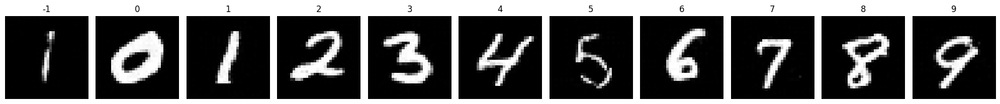

In [13]:
from common.utils import plot_images


imgs = model.sample(add_null_label=True, scale=3., steps=1_000, eta=1., verbose=True)
plot_images(imgs, has_null_label=True)

Steps: 1000/1000


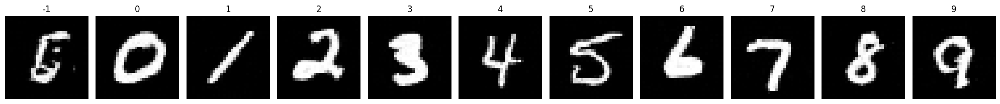

In [14]:
imgs = model.sample(add_null_label=True, scale=3., steps=1_000, verbose=True)
plot_images(imgs, has_null_label=True)

Steps: 50/50


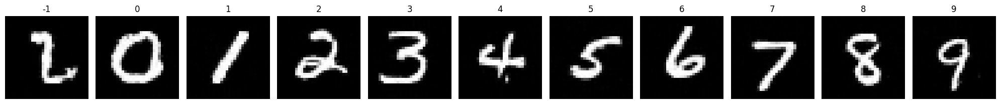

In [15]:
imgs = model.sample(add_null_label=True, scale=3., verbose=True)
plot_images(imgs, has_null_label=True)

Steps: 50/50


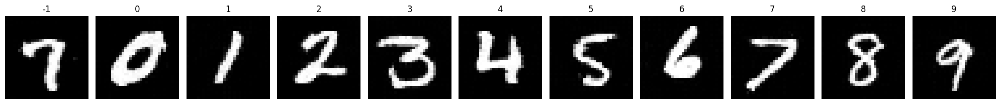

In [16]:
imgs = model.sample(add_null_label=True, scale=4., verbose=True)
plot_images(imgs, has_null_label=True)

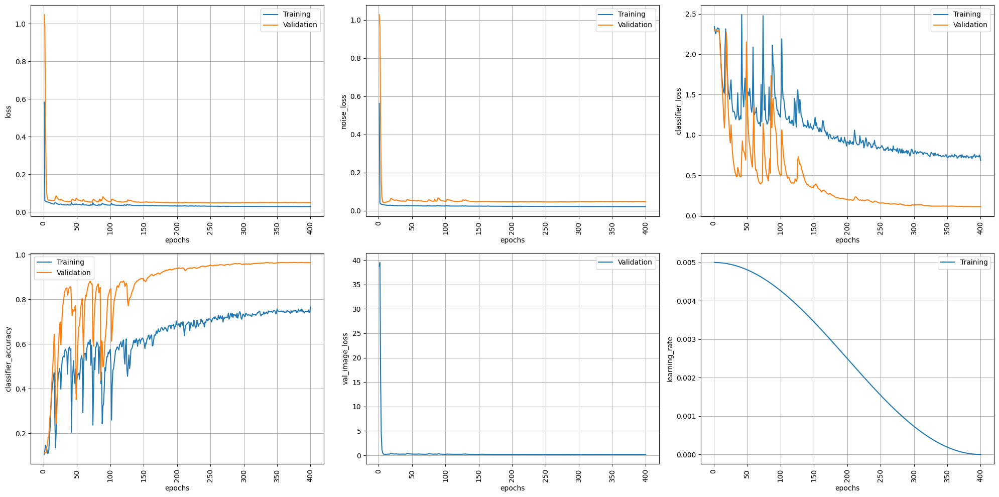

In [17]:
from common.utils import plot_history


plot_history(history)

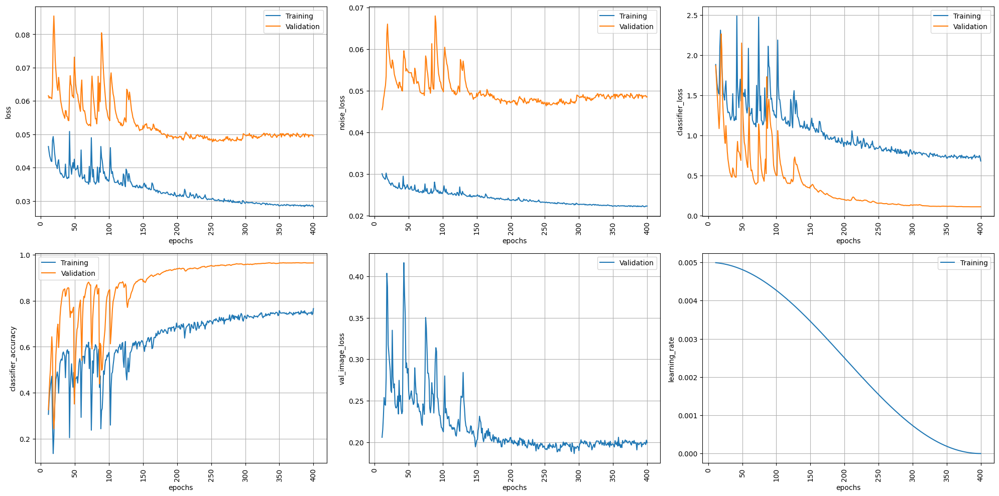

In [18]:
plot_history(history, show_all_x_ticks=False, range_=(10, None))